### 라이브러리

In [143]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import transforms
from scipy.optimize import linear_sum_assignment
from torch.optim.lr_scheduler import ReduceLROnPlateau

### 데이터 로드

In [144]:
'''
    TODO : data load 함수 정의
          load_mask_and_label : binary mask, label 반환
          __getitem__ : load_mask_and_label를 사용해 tensor 형태의 image, mask, label 반환
'''
class MNIST_seg_dataset(Dataset):
    def __init__(self, root_dir, mode='train', transform=None):
        self.image_dir = os.path.join(root_dir, mode, 'image')
        self.mask_dir = os.path.join(root_dir, mode, 'gt')
        self.transform = transform
        self.image_names = sorted(os.listdir(self.image_dir))  # listdir은 정렬된 순서 보장 X

    def __len__(self): # 몇 개의 데이터 샘플이 있는지 반환(DataLoader 내부	배치 수 계산), __getitem__에서 몇 번 반복할지 결정 -> 안 쓰면 DataLoader에서 에러 발생함
        return len(self.image_names)
    
    def load_mask_and_label(self, path):
        mask = np.array(Image.open(path))
        binary_mask = (mask > 0).astype(np.float32)

        values = np.unique(mask) # 0 or 0 & 값+1
        values = values[values != 0] # 0이 아닌 것만 vales에 남음
        if len(values) == 0:
            label = -1
        elif len(values) == 1:
            label = values[0] - 1
    
        return binary_mask, label
    
    def __getitem__(self, idx):
        base_name = self.image_names[idx].split('.')[0] 
        img_path = os.path.join(self.image_dir, f"{base_name}.png")
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        masks = []
        labels = []
        for i in range(4):
            mask_path = os.path.join(self.mask_dir, f"{base_name}_{i}.png")
            binary_mask, class_label = self.load_mask_and_label(mask_path)
            masks.append(torch.tensor(binary_mask))     
            labels.append(class_label)                

        masks = torch.stack(masks, dim=0) # 4개를 하나의 텐서로 묶어서 (4, 64, 64) 텐서로 만듬
        labels = torch.tensor(labels, dtype=torch.long)

        return image, masks, labels

In [145]:

'''
    TODO : data load
'''
transform = transforms.Compose([
    transforms.ToTensor(),
])

train_dataset = MNIST_seg_dataset(root_dir='mnist_seg_dataset', mode='train',transform=transform)
test_dataset = MNIST_seg_dataset(root_dir='mnist_seg_dataset', mode='test', transform=transform)


In [146]:
# '''
#     data load 결과 확인
# '''
# image, masks, labels = train_dataset[0] 
# print(image.shape)   
# print(masks.shape) 
# print(labels)       

# plt.figure(figsize=(1, 1))
# plt.imshow(image.permute(1, 2, 0)) 
# plt.title("Original Image")
# plt.axis('off')
# plt.show()
# for i in range(4):
#     plt.figure(figsize=(1, 1))
#     plt.imshow(masks[i], cmap='gray')
#     plt.title(f"Mask {i} (Label: {labels[i].item()})")
#     plt.axis('off')
#     plt.show()

### 매칭 방식 정의

In [147]:
'''
    TODO : Hungarian Matching 방식의 유사도 측정
         : pred_mask, true_mask 사이 겹치는 정도 수치로 나타냄
         : IoU = 교집합 / 합집합 ( 0 ~ 1(완전 일치))
'''
def compute_iou(pred_mask, true_mask, eps=1e-6):
    intersection = (pred_mask * true_mask).sum()
    union = pred_mask.sum() + true_mask.sum() - intersection
    return (intersection + eps) / (union + eps)

### AutoEncoder 기반 모델

In [148]:
'''
    TODO : 모델 클래스 및 시각화 함수 정의
         : Encoder, Decoder는 AutoEncoder에서 사용한 가장 성능이 괜찮았던 구조 사용
         : MultiSegNet - Encoder, Decoder를 하나로 아우르는 모델 - Decoder는 최대 객체 4개에 따라 4개로 분할
'''
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),    
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Dropout(p=0.05),  # Dropout2d 추가
            nn.Conv2d(16, 32, 3, stride=2, padding=1),   
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Dropout(p=0.05),  # Dropout2d 추가
            nn.Conv2d(32, 64, 3, stride=1, padding=1),   
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(p=0.05),  # Dropout2d 추가
            nn.Conv2d(64, 128, 3, stride=1, padding=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(p=0.05),  # Dropout2d 추가
            nn.Conv2d(128, 128, 3, stride=1, padding=1), 
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(p=0.05),  # Dropout2d 추가
        )

    def forward(self, x):
        return self.encoder(x)

class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 3, stride=1, padding=1),   
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=1, padding=1),    
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),  
            nn.ReLU(),
            nn.ConvTranspose2d(16, 4, 3, stride=2, padding=1, output_padding=1),   
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.decoder(x)


class MultiSegNet(nn.Module):
    def __init__(self, num_instances=4):
        super().__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    def forward(self, x):
        f = self.encoder(x)
        out = self.decoder(f)
        return out

# 각 디코더가 만든 마스크와 gt 마스크를 Hungarian 알고리즘으로 연결해, 어떤 디코더가 어떤 gt를 가장 잘 예측했는지 시각화
def visualize_decoder_outputs_with_matching(img, preds, masks, labels, epoch): # img: 입력 이미지 (3, 64, 64), preds: 디코더 출력 4개 (4, 1, 64, 64), masks: gt 마스크 4개 (4, 64, 64)
    img = img.permute(1, 2, 0).cpu().numpy()
    preds = preds.detach().cpu()  # (4, 1, 64, 64)
    masks = masks.cpu()
    labels = labels.cpu()

    # IoU 기반 cost matrix 생성 (4x4)
    cost_matrix = torch.zeros(4, 4)
    for i in range(4):
        for j in range(4):
            if labels[j] == -1:
                cost_matrix[i, j] = 1.0  # 객체가 없는 경우에는 큰 비용
            else:
                inter = (preds[i] * masks[j]).sum()
                union = preds[i].sum() + masks[j].sum() - inter
                iou = (inter + 1e-6) / (union + 1e-6)
                cost_matrix[i, j] = 1 - iou  # 비용: 1 - IoU(1 - 완전 일치)

    row_ind, col_ind = linear_sum_assignment(cost_matrix.numpy())

    _, axes = plt.subplots(2, 5, figsize=(10, 3))
    axes[0, 0].imshow(img)
    axes[0, 0].set_title("Input")
    axes[0, 0].axis('off')

    for k, (i, j) in enumerate(zip(row_ind, col_ind)): # row : Decoder, col : gt
        axes[0, k+1].imshow(preds[i], cmap='gray') # Decoder
        axes[0, k+1].set_title(f"Channel {i} → GT {j}")
        axes[0, k+1].axis('off')

        axes[1, k+1].imshow(masks[j], cmap='gray') # gt
        axes[1, k+1].set_title(f"Matched GT {j}")
        axes[1, k+1].axis('off')

    axes[1, 0].axis('off')
    plt.suptitle(f"Epoch {epoch} Hungarian Matching")
    plt.tight_layout()
    plt.show()
    
def visualize_loss_curves(train_losses, test_losses):
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training & Test Loss')
    plt.legend()
    plt.grid()
    plt.show()

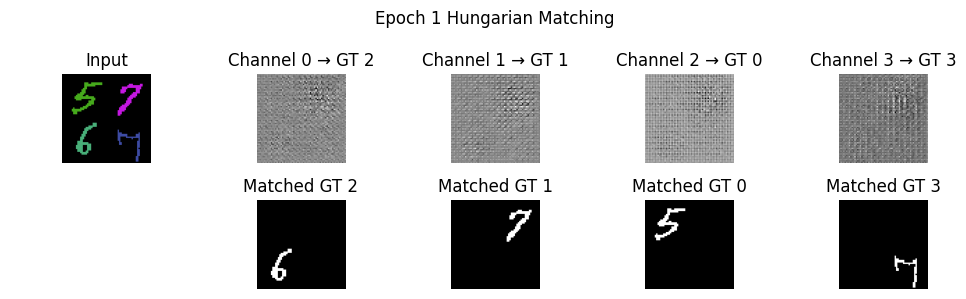

Model saved at epoch 1 with test loss: 1.2361
Epoch 1 | Train Loss: 0.9738 | Test Loss: 1.2361


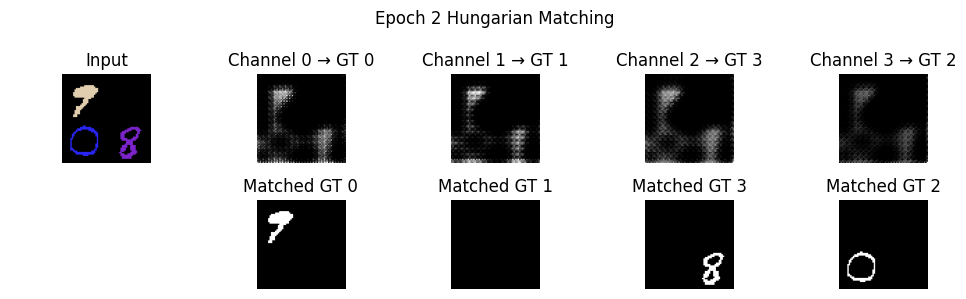

Model saved at epoch 2 with test loss: 0.3992
Epoch 2 | Train Loss: 0.3954 | Test Loss: 0.3992


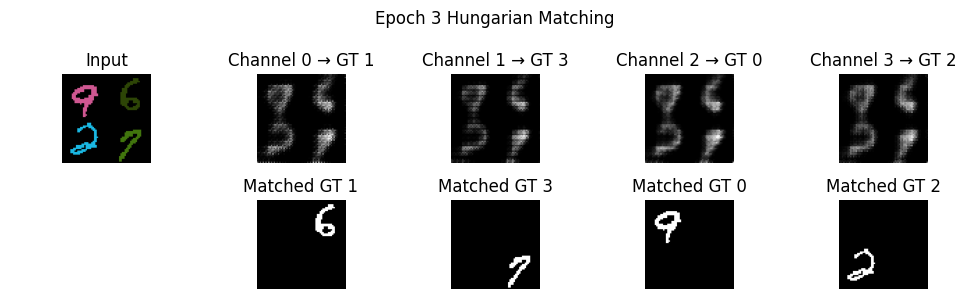

Model saved at epoch 3 with test loss: 0.3503
Epoch 3 | Train Loss: 0.3499 | Test Loss: 0.3503


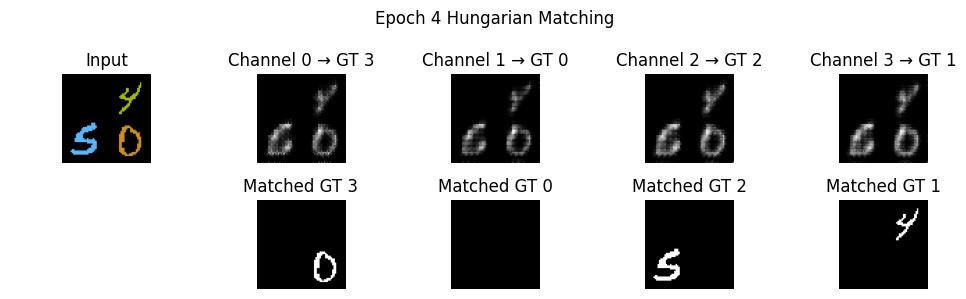

Model saved at epoch 4 with test loss: 0.3314
Epoch 4 | Train Loss: 0.3308 | Test Loss: 0.3314


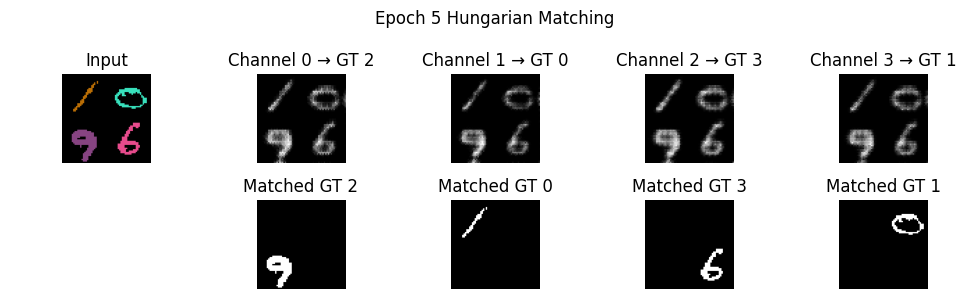

Model saved at epoch 5 with test loss: 0.3213
Epoch 5 | Train Loss: 0.3208 | Test Loss: 0.3213


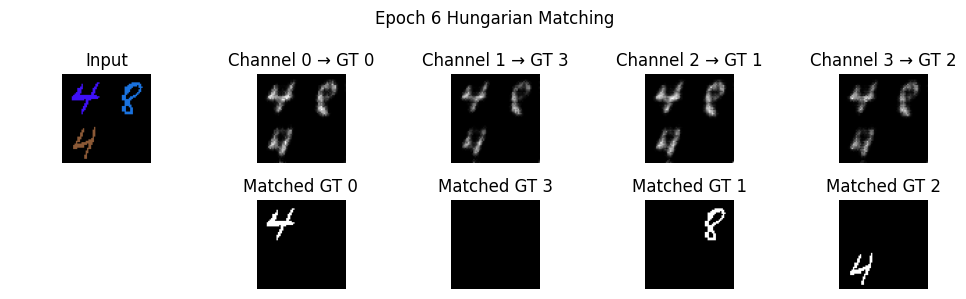

Model saved at epoch 6 with test loss: 0.3129
Epoch 6 | Train Loss: 0.3127 | Test Loss: 0.3129


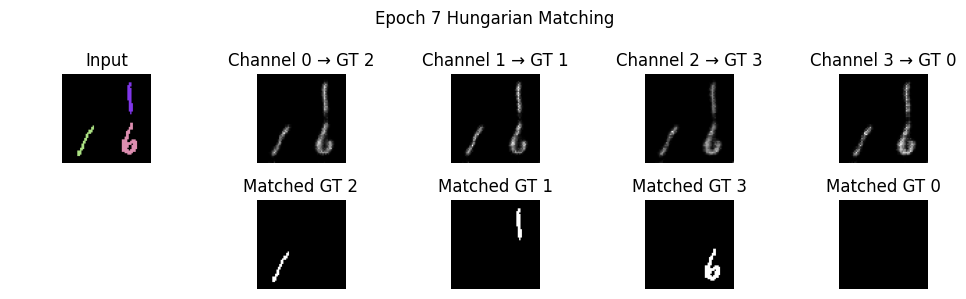

Model saved at epoch 7 with test loss: 0.3026
Epoch 7 | Train Loss: 0.3034 | Test Loss: 0.3026


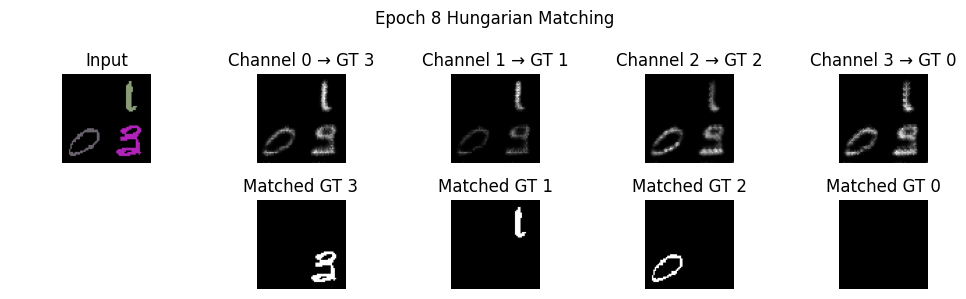

Model saved at epoch 8 with test loss: 0.2946
Epoch 8 | Train Loss: 0.2916 | Test Loss: 0.2946


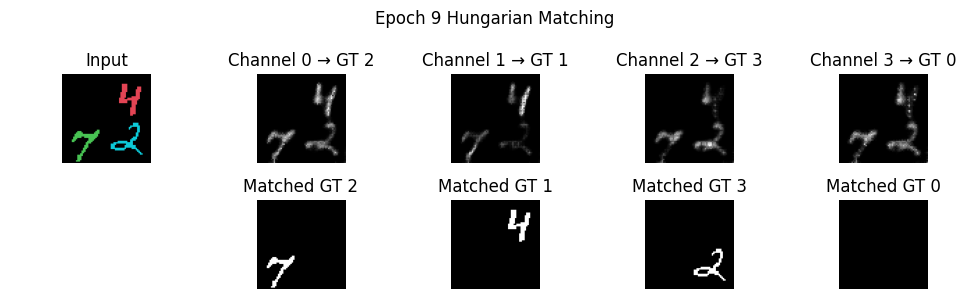

Epoch 9 | Train Loss: 0.2728 | Test Loss: 0.3289


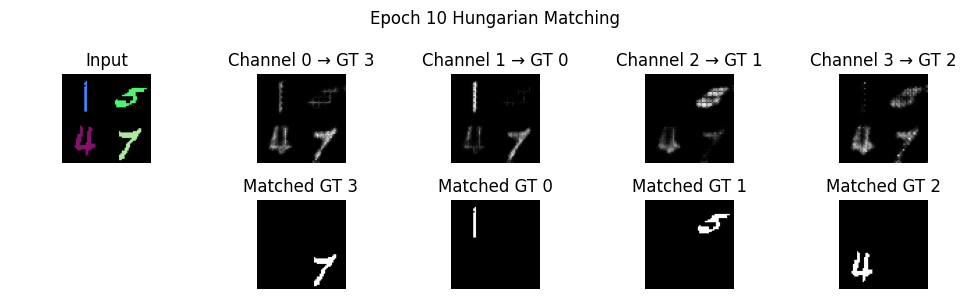

Model saved at epoch 10 with test loss: 0.2593
Epoch 10 | Train Loss: 0.2561 | Test Loss: 0.2593


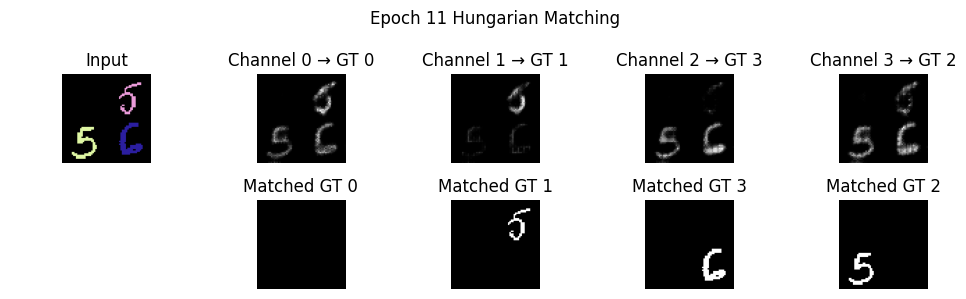

Epoch 11 | Train Loss: 0.2434 | Test Loss: 0.2981


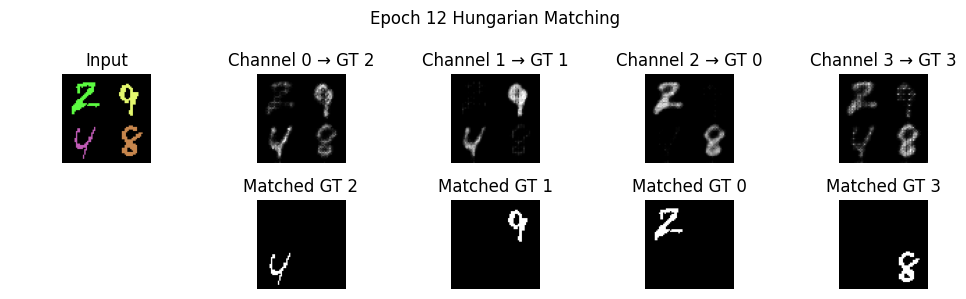

Model saved at epoch 12 with test loss: 0.2410
Epoch 12 | Train Loss: 0.2375 | Test Loss: 0.2410


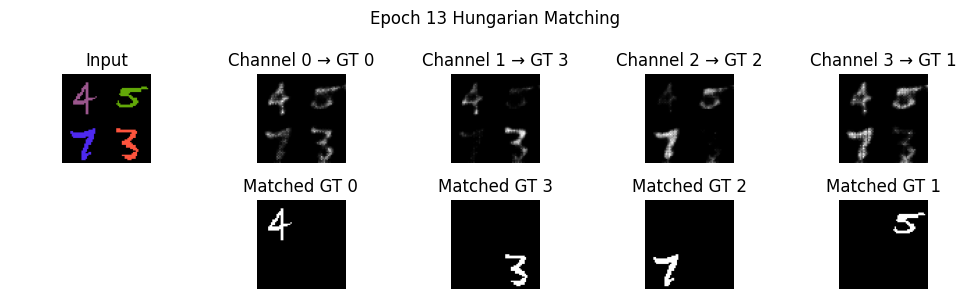

Epoch 13 | Train Loss: 0.2305 | Test Loss: 0.2666


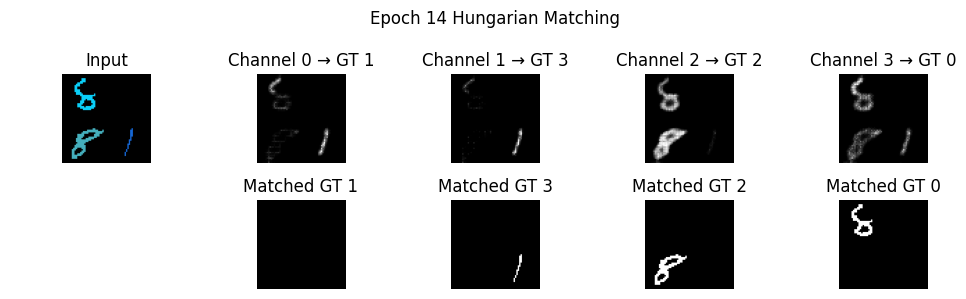

Model saved at epoch 14 with test loss: 0.2397
Epoch 14 | Train Loss: 0.2217 | Test Loss: 0.2397


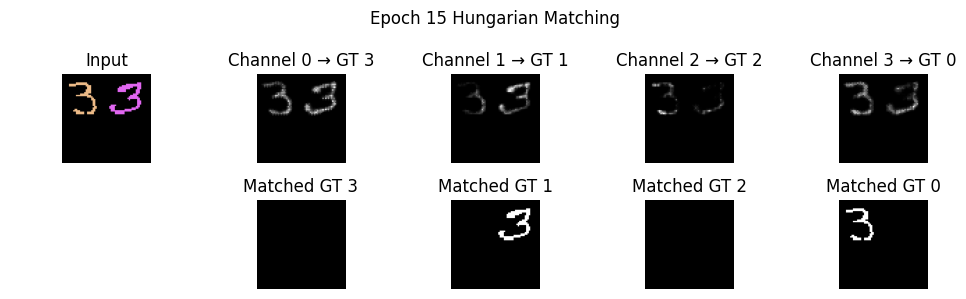

Model saved at epoch 15 with test loss: 0.2396
Epoch 15 | Train Loss: 0.2210 | Test Loss: 0.2396


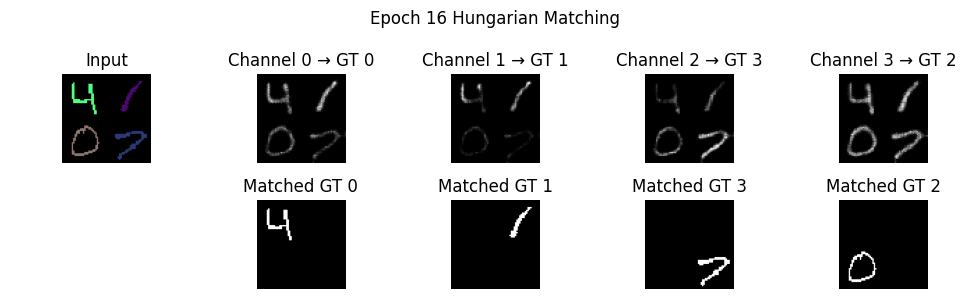

Model saved at epoch 16 with test loss: 0.2302
Epoch 16 | Train Loss: 0.2165 | Test Loss: 0.2302


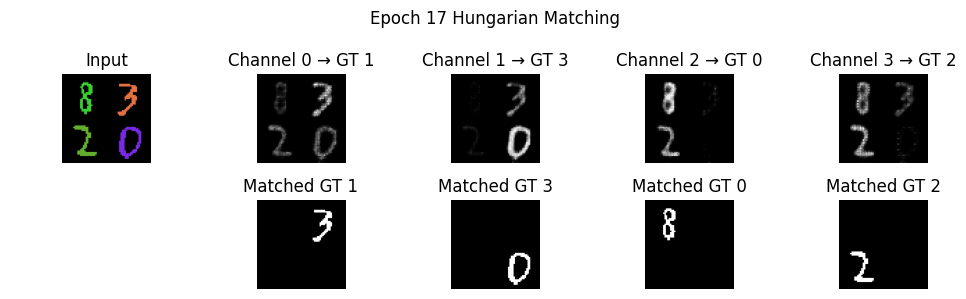

Model saved at epoch 17 with test loss: 0.2128
Epoch 17 | Train Loss: 0.2027 | Test Loss: 0.2128


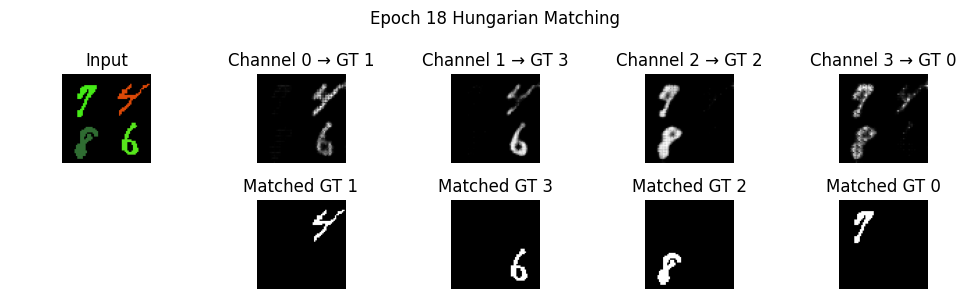

Model saved at epoch 18 with test loss: 0.1848
Epoch 18 | Train Loss: 0.1815 | Test Loss: 0.1848


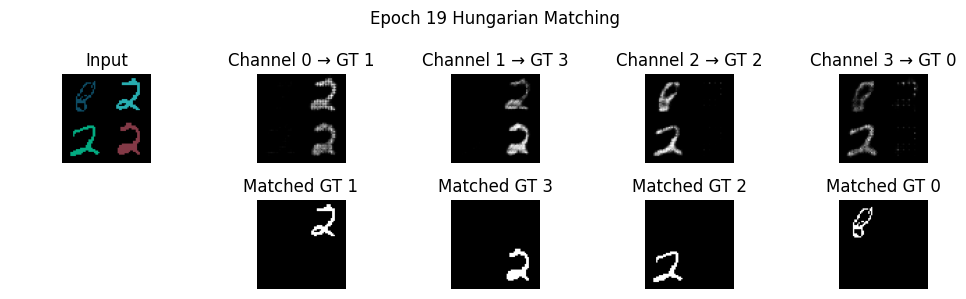

Epoch 19 | Train Loss: 0.1708 | Test Loss: 0.1896


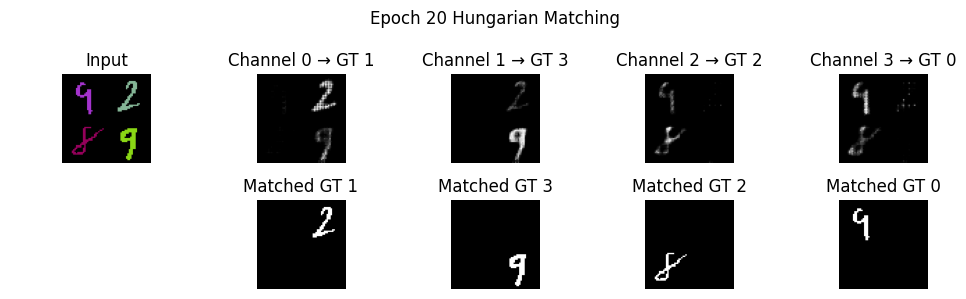

Model saved at epoch 20 with test loss: 0.1723
Epoch 20 | Train Loss: 0.1659 | Test Loss: 0.1723


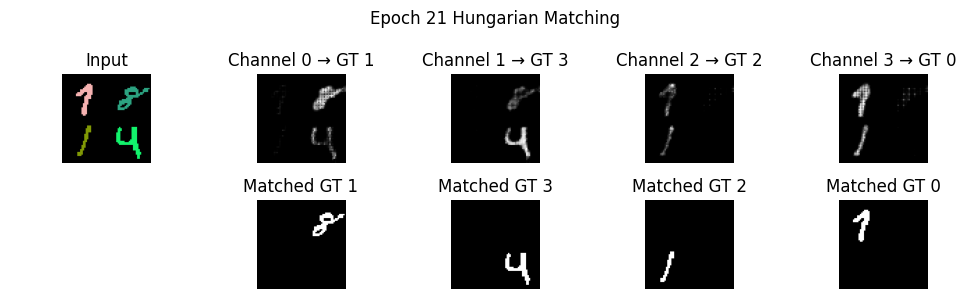

Epoch 21 | Train Loss: 0.1550 | Test Loss: 0.1805


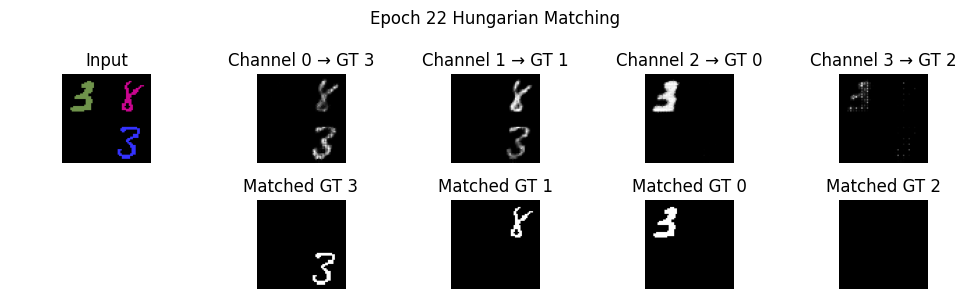

Model saved at epoch 22 with test loss: 0.1352
Epoch 22 | Train Loss: 0.1293 | Test Loss: 0.1352


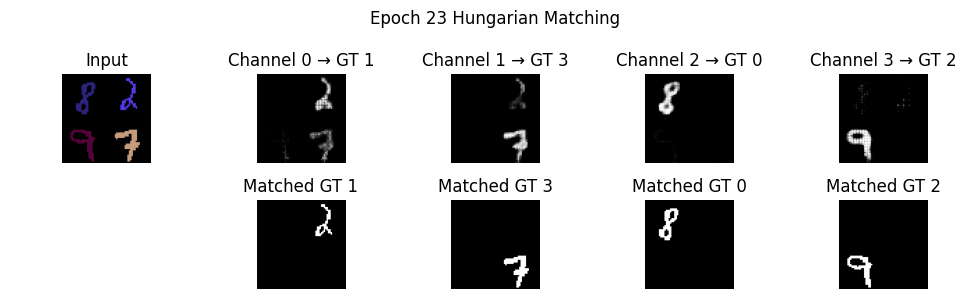

Model saved at epoch 23 with test loss: 0.0812
Epoch 23 | Train Loss: 0.1121 | Test Loss: 0.0812


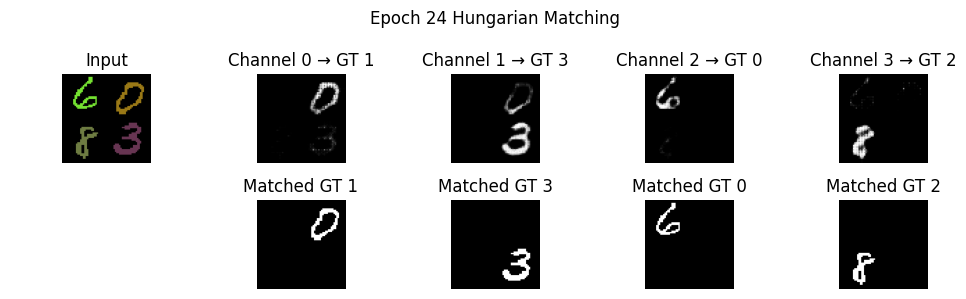

Model saved at epoch 24 with test loss: 0.0625
Epoch 24 | Train Loss: 0.0750 | Test Loss: 0.0625


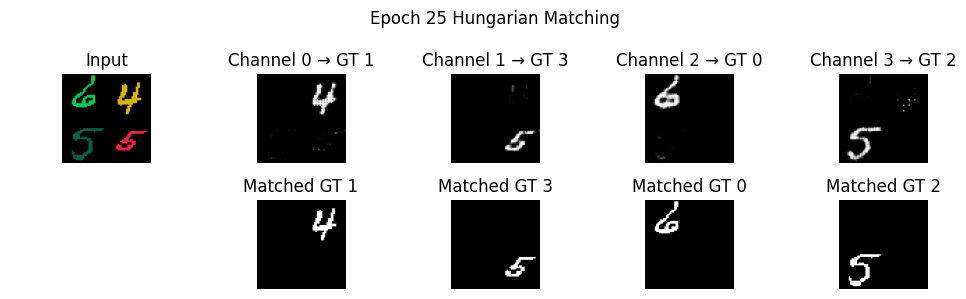

Model saved at epoch 25 with test loss: 0.0598
Epoch 25 | Train Loss: 0.0626 | Test Loss: 0.0598


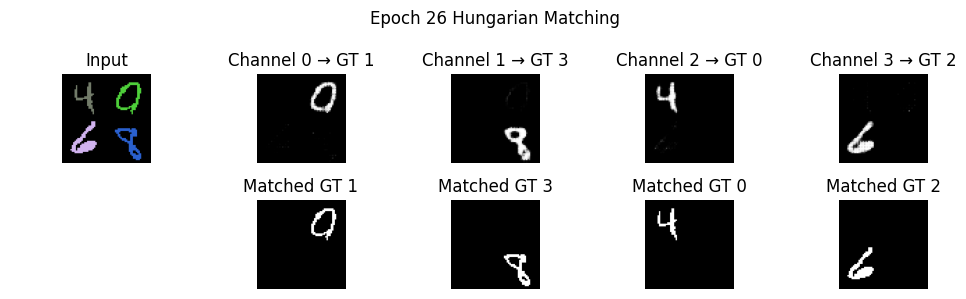

Model saved at epoch 26 with test loss: 0.0494
Epoch 26 | Train Loss: 0.0572 | Test Loss: 0.0494


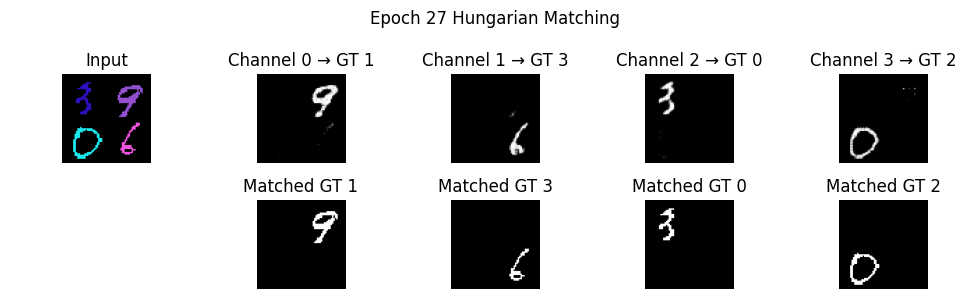

Model saved at epoch 27 with test loss: 0.0450
Epoch 27 | Train Loss: 0.0513 | Test Loss: 0.0450


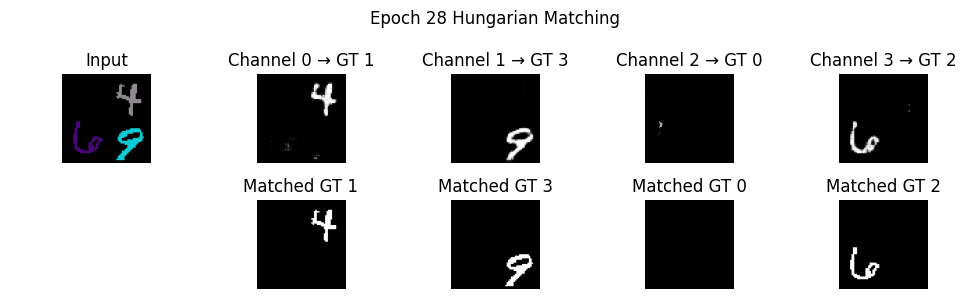

Epoch 28 | Train Loss: 0.0513 | Test Loss: 0.0463


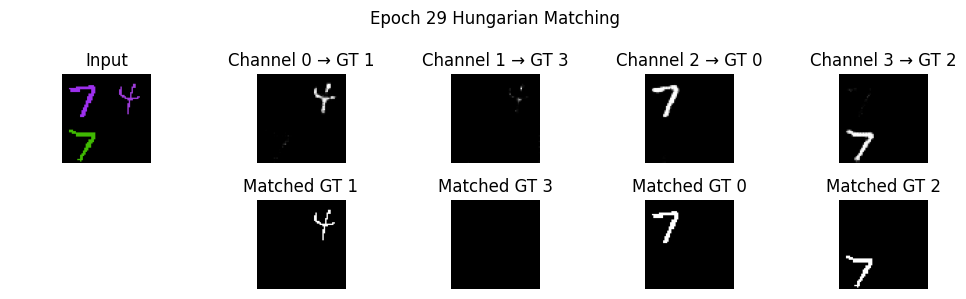

Model saved at epoch 29 with test loss: 0.0445
Epoch 29 | Train Loss: 0.0546 | Test Loss: 0.0445


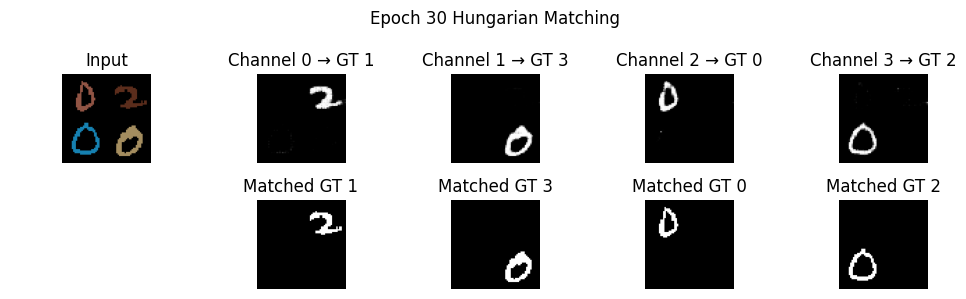

Model saved at epoch 30 with test loss: 0.0394
Epoch 30 | Train Loss: 0.0457 | Test Loss: 0.0394


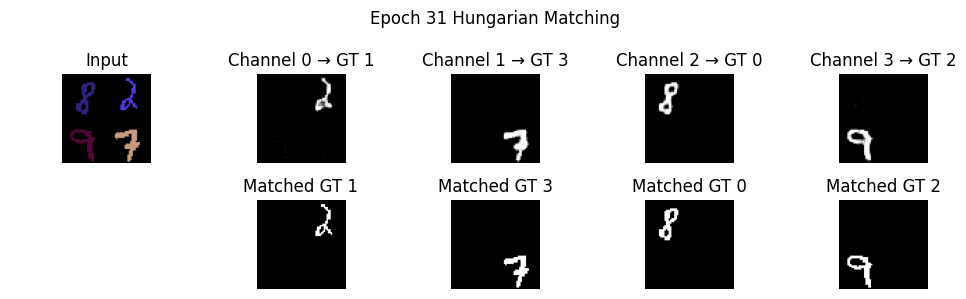

Model saved at epoch 31 with test loss: 0.0373
Epoch 31 | Train Loss: 0.0431 | Test Loss: 0.0373


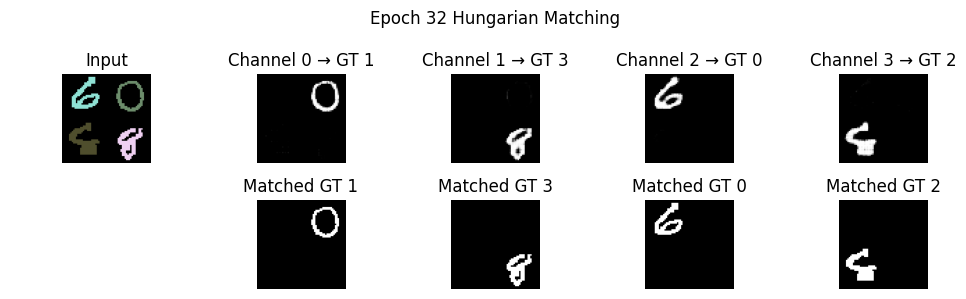

Epoch 32 | Train Loss: 0.0412 | Test Loss: 0.0476


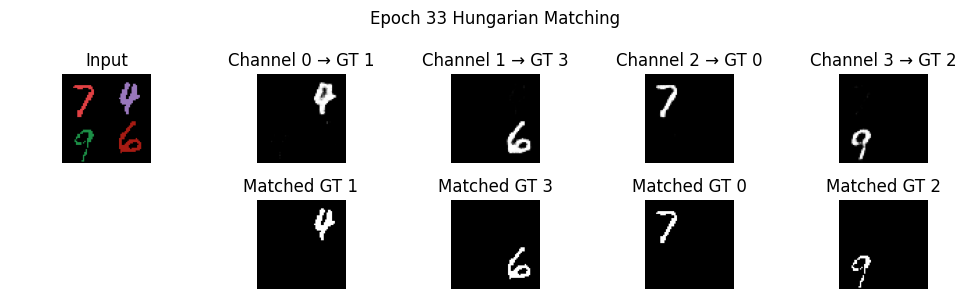

Epoch 33 | Train Loss: 0.0472 | Test Loss: 0.0407


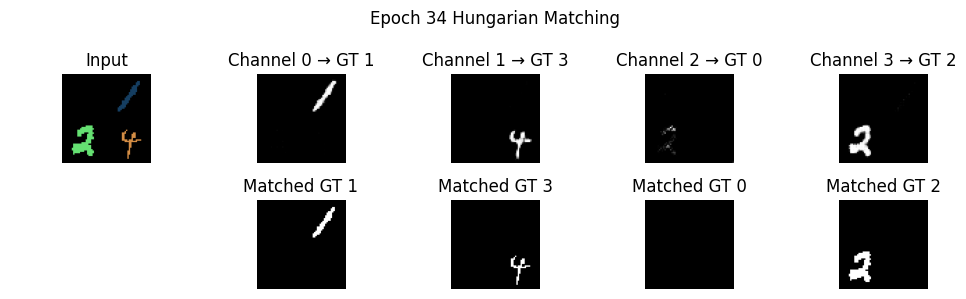

Model saved at epoch 34 with test loss: 0.0347
Epoch 34 | Train Loss: 0.0407 | Test Loss: 0.0347


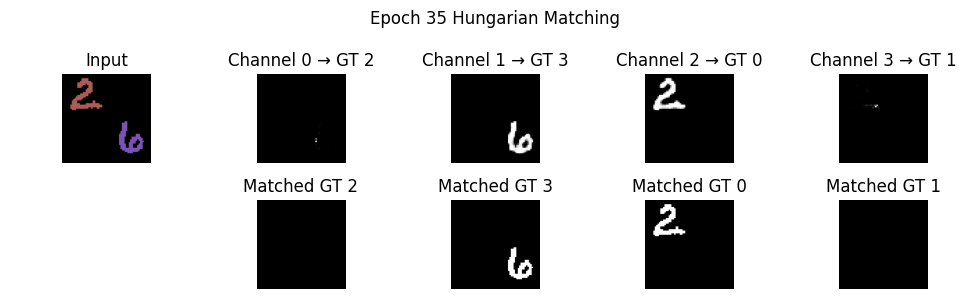

Epoch 35 | Train Loss: 0.0388 | Test Loss: 0.0382


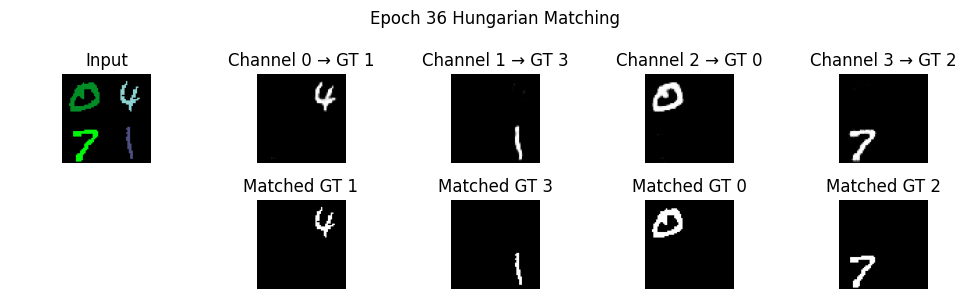

Model saved at epoch 36 with test loss: 0.0329
Epoch 36 | Train Loss: 0.0387 | Test Loss: 0.0329


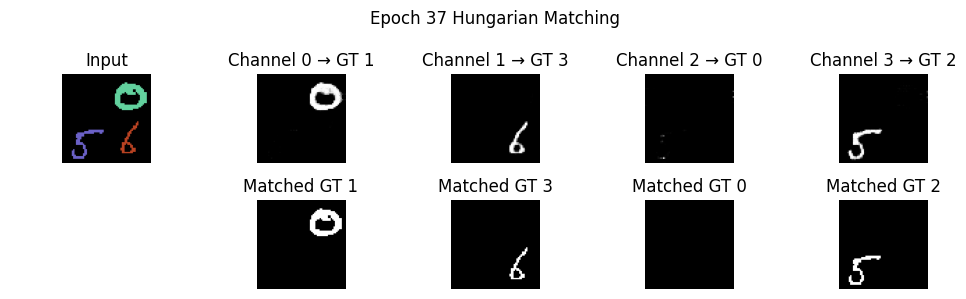

Model saved at epoch 37 with test loss: 0.0317
Epoch 37 | Train Loss: 0.0357 | Test Loss: 0.0317


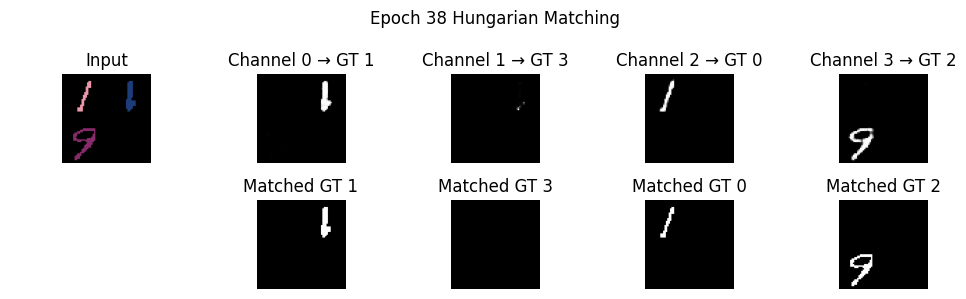

Model saved at epoch 38 with test loss: 0.0305
Epoch 38 | Train Loss: 0.0345 | Test Loss: 0.0305


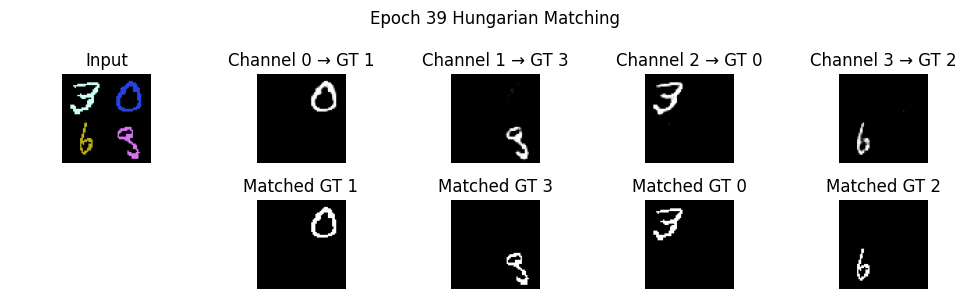

Model saved at epoch 39 with test loss: 0.0289
Epoch 39 | Train Loss: 0.0335 | Test Loss: 0.0289


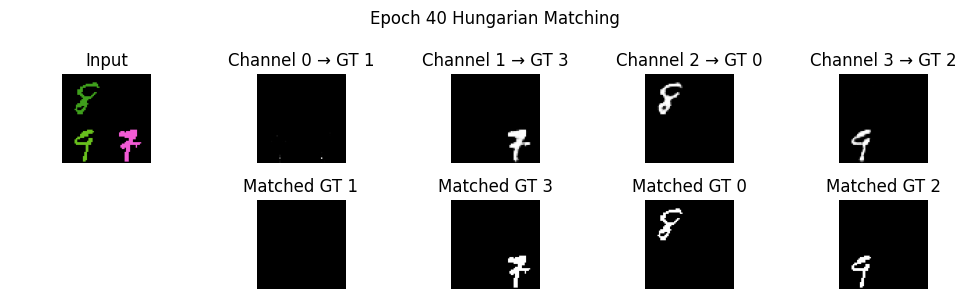

Model saved at epoch 40 with test loss: 0.0288
Epoch 40 | Train Loss: 0.0341 | Test Loss: 0.0288


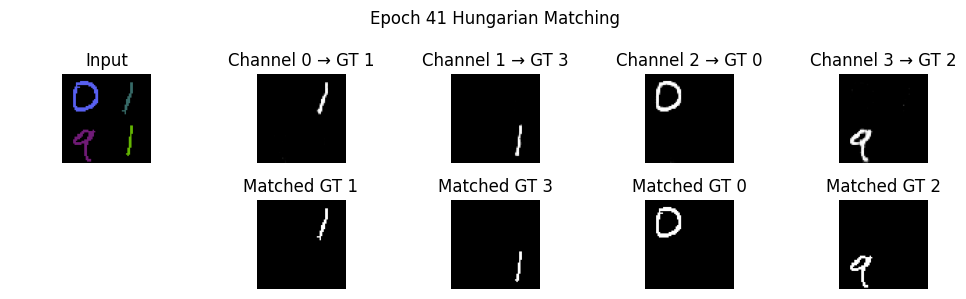

Epoch 41 | Train Loss: 0.0373 | Test Loss: 0.0316


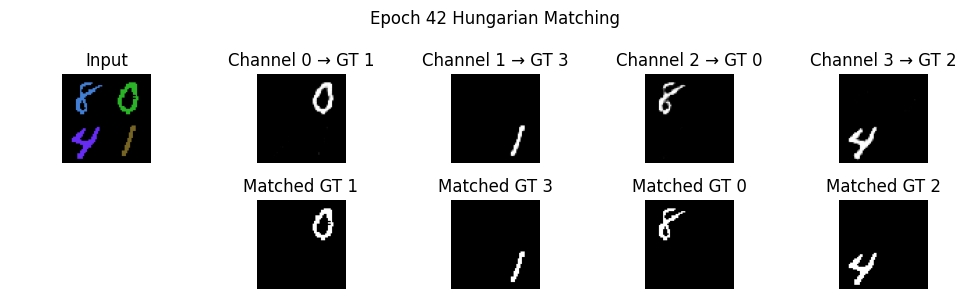

Model saved at epoch 42 with test loss: 0.0278
Epoch 42 | Train Loss: 0.0330 | Test Loss: 0.0278


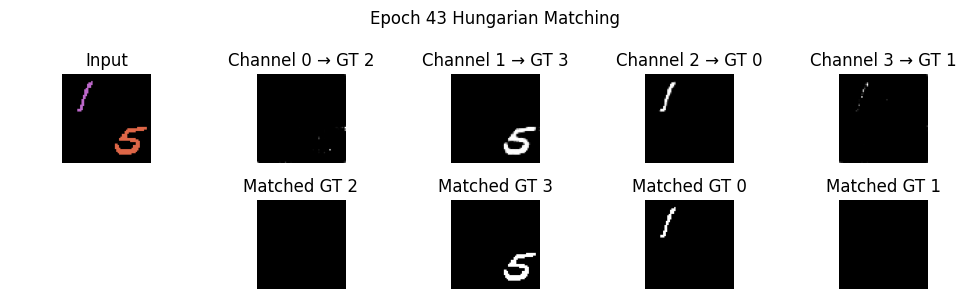

Epoch 43 | Train Loss: 0.0319 | Test Loss: 0.0293


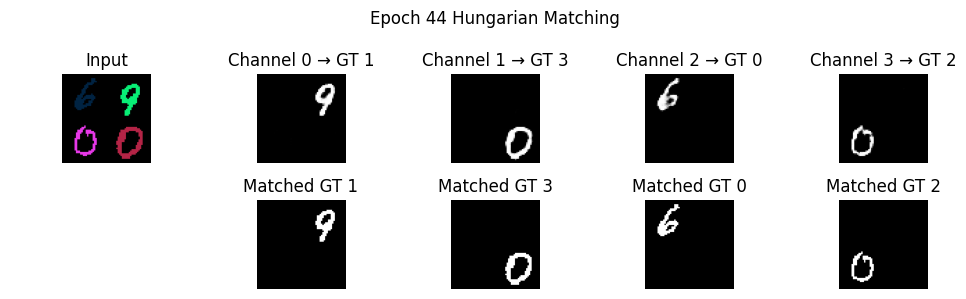

Model saved at epoch 44 with test loss: 0.0268
Epoch 44 | Train Loss: 0.0315 | Test Loss: 0.0268


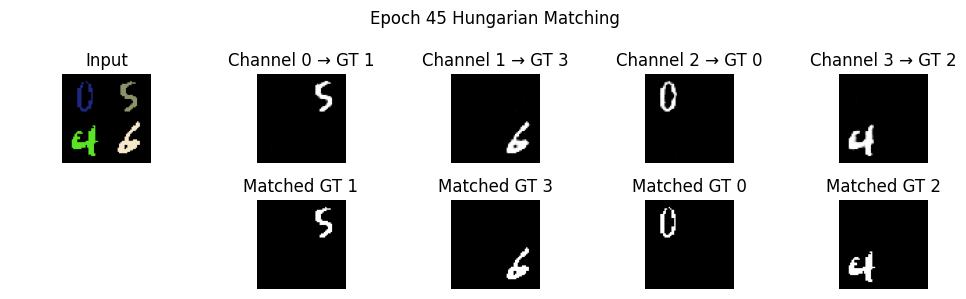

Model saved at epoch 45 with test loss: 0.0260
Epoch 45 | Train Loss: 0.0307 | Test Loss: 0.0260


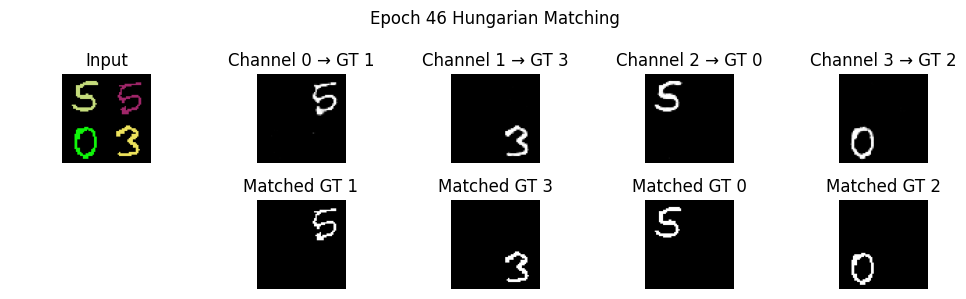

Epoch 46 | Train Loss: 0.0296 | Test Loss: 0.0268


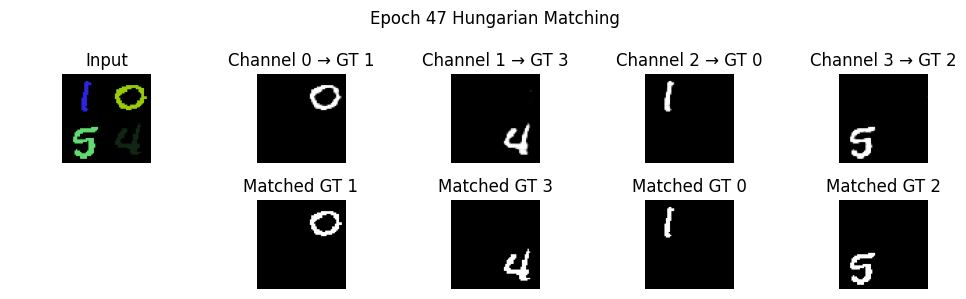

Epoch 47 | Train Loss: 0.0292 | Test Loss: 0.0262


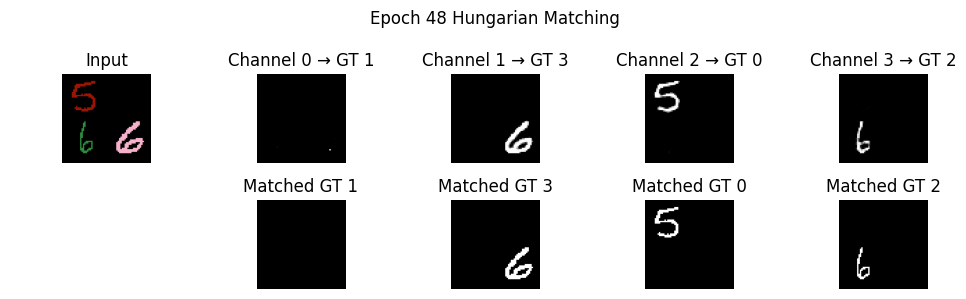

Epoch 48 | Train Loss: 0.0302 | Test Loss: 0.0263


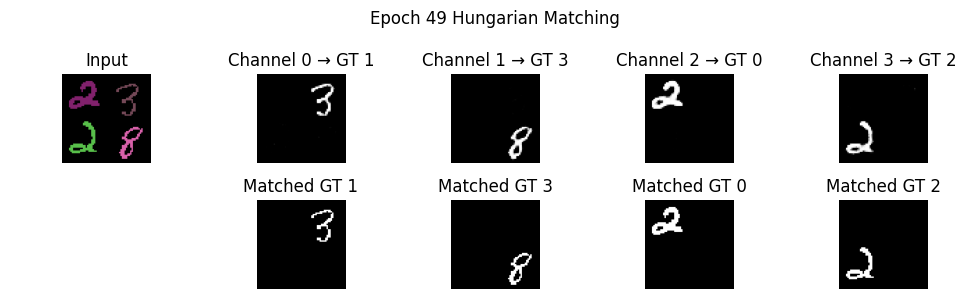

Epoch 49 | Train Loss: 0.0299 | Test Loss: 0.0323


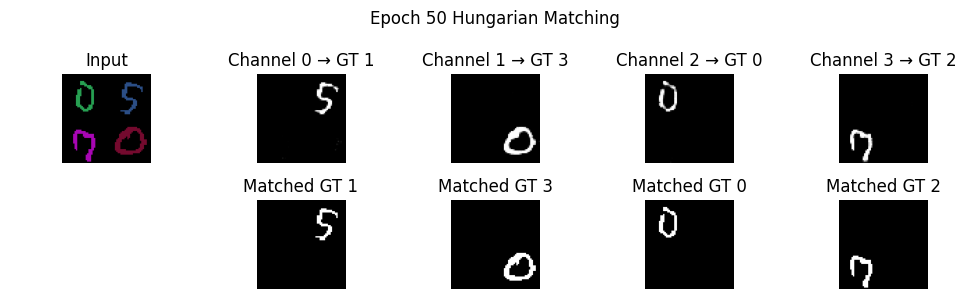

Model saved at epoch 50 with test loss: 0.0243
Epoch 50 | Train Loss: 0.0295 | Test Loss: 0.0243


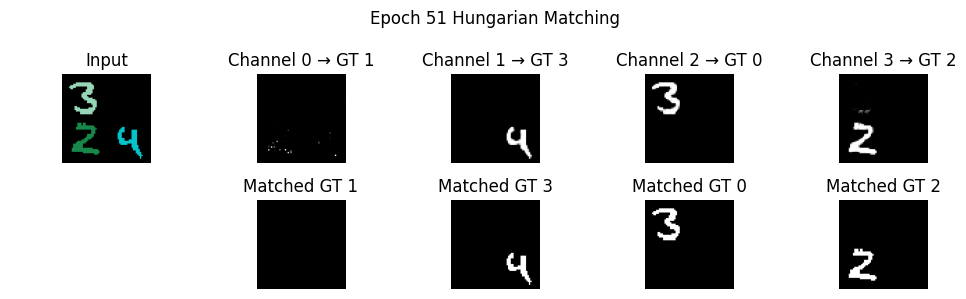

Model saved at epoch 51 with test loss: 0.0236
Epoch 51 | Train Loss: 0.0272 | Test Loss: 0.0236


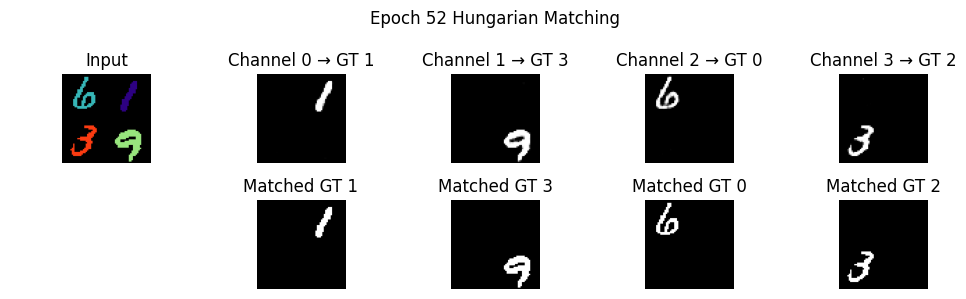

Model saved at epoch 52 with test loss: 0.0225
Epoch 52 | Train Loss: 0.0263 | Test Loss: 0.0225


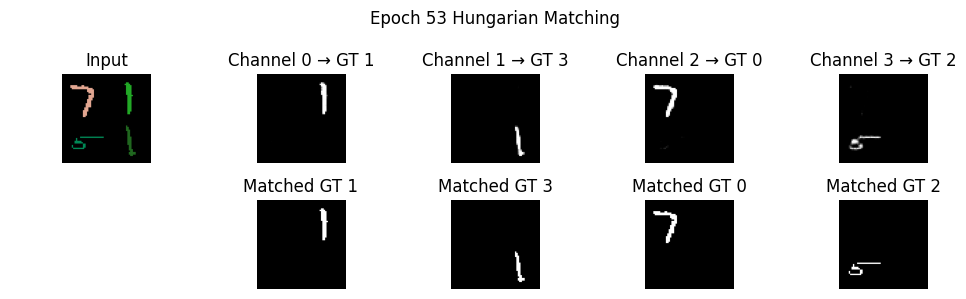

Model saved at epoch 53 with test loss: 0.0225
Epoch 53 | Train Loss: 0.0262 | Test Loss: 0.0225


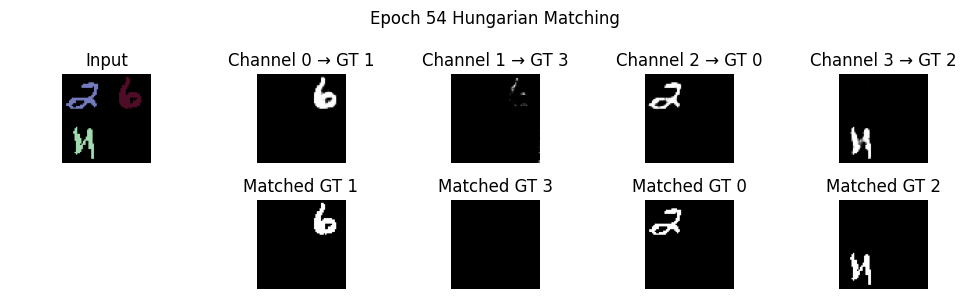

Model saved at epoch 54 with test loss: 0.0220
Epoch 54 | Train Loss: 0.0259 | Test Loss: 0.0220


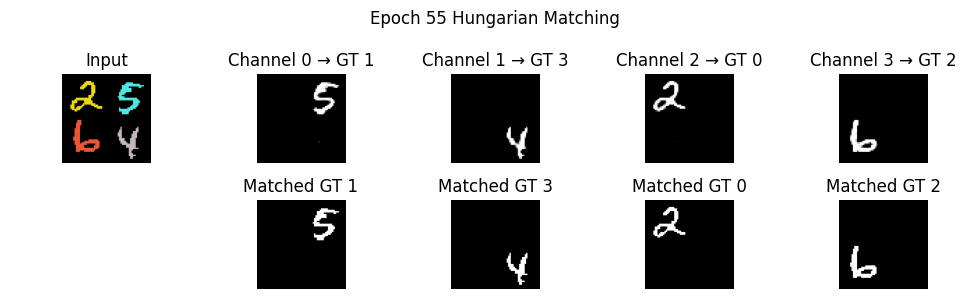

Epoch 55 | Train Loss: 0.0256 | Test Loss: 0.0221


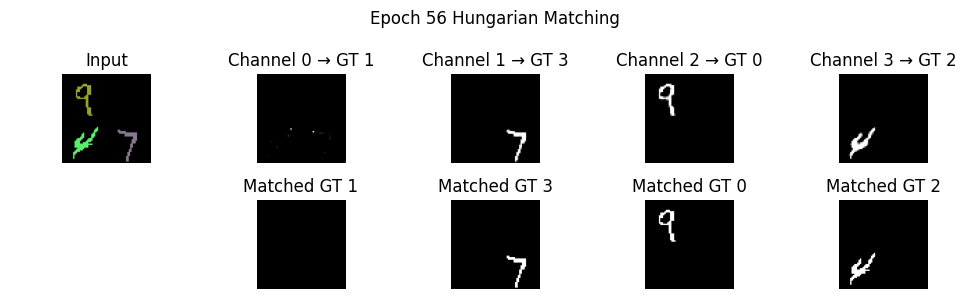

Model saved at epoch 56 with test loss: 0.0217
Epoch 56 | Train Loss: 0.0253 | Test Loss: 0.0217


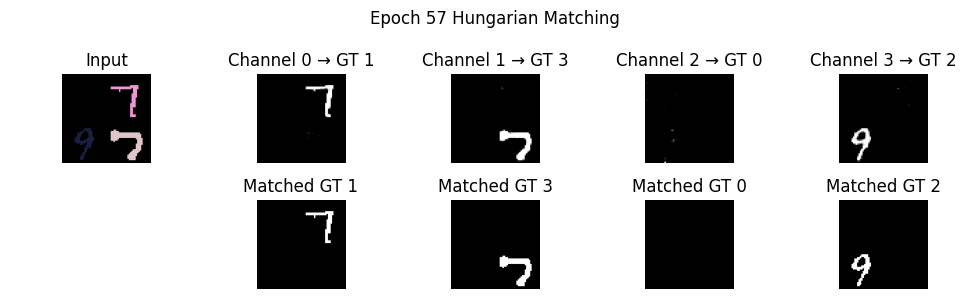

Model saved at epoch 57 with test loss: 0.0216
Epoch 57 | Train Loss: 0.0250 | Test Loss: 0.0216


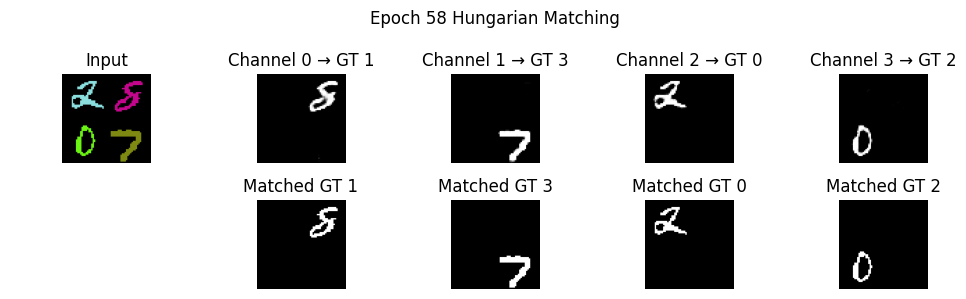

Epoch 58 | Train Loss: 0.0249 | Test Loss: 0.0223


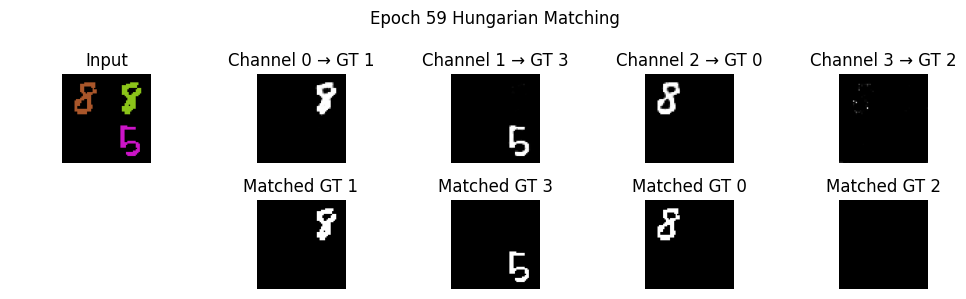

Model saved at epoch 59 with test loss: 0.0208
Epoch 59 | Train Loss: 0.0246 | Test Loss: 0.0208


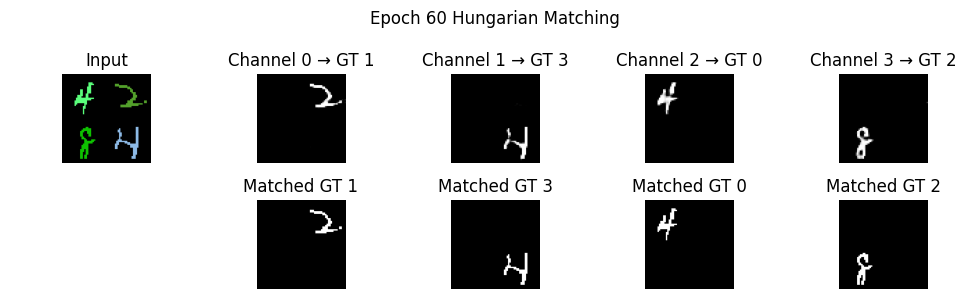

Epoch 60 | Train Loss: 0.0245 | Test Loss: 0.0226


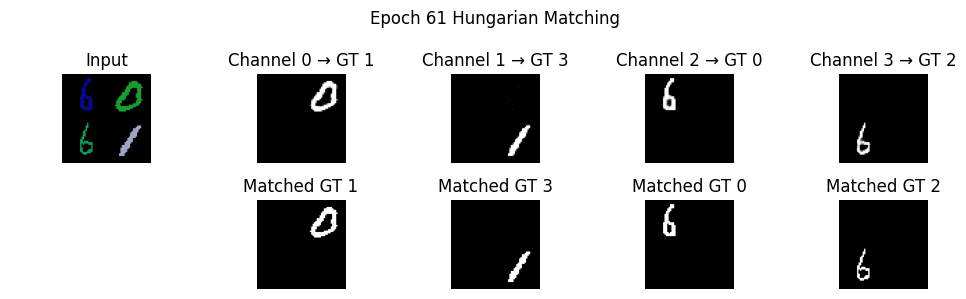

Epoch 61 | Train Loss: 0.0252 | Test Loss: 0.0210


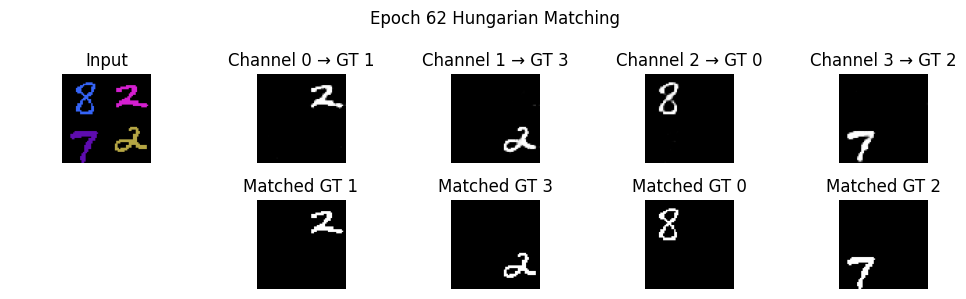

Model saved at epoch 62 with test loss: 0.0205
Epoch 62 | Train Loss: 0.0243 | Test Loss: 0.0205


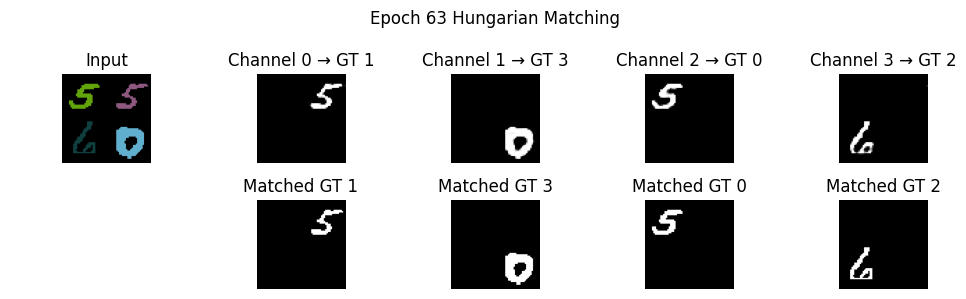

Epoch 63 | Train Loss: 0.0240 | Test Loss: 0.0210


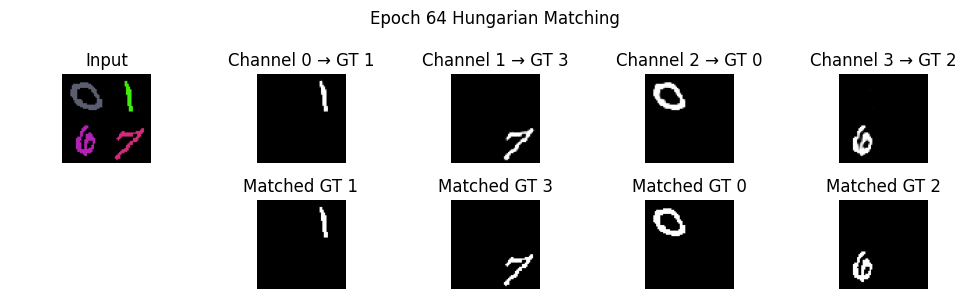

Epoch 64 | Train Loss: 0.0237 | Test Loss: 0.0212


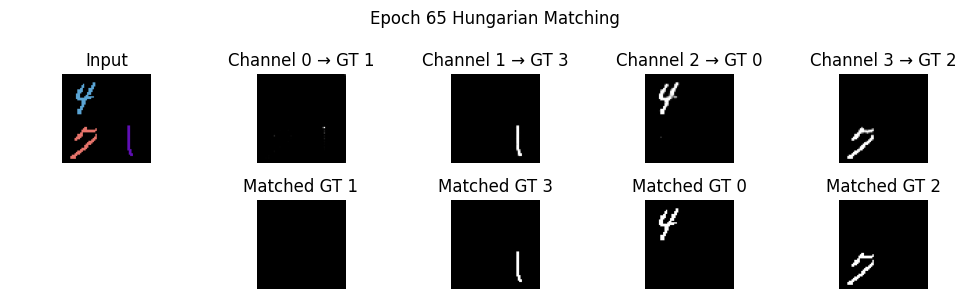

Model saved at epoch 65 with test loss: 0.0199
Epoch 65 | Train Loss: 0.0235 | Test Loss: 0.0199


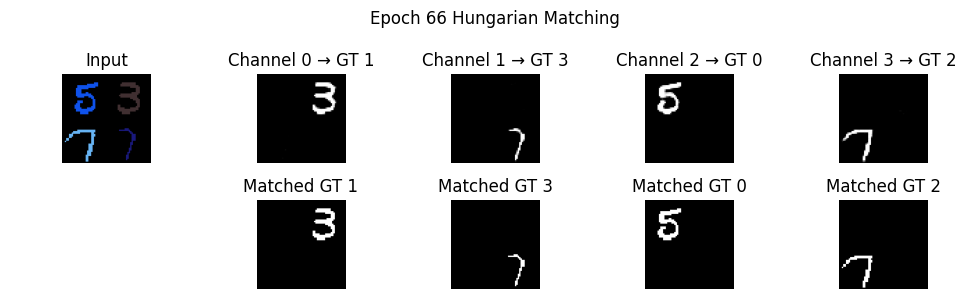

Model saved at epoch 66 with test loss: 0.0195
Epoch 66 | Train Loss: 0.0234 | Test Loss: 0.0195


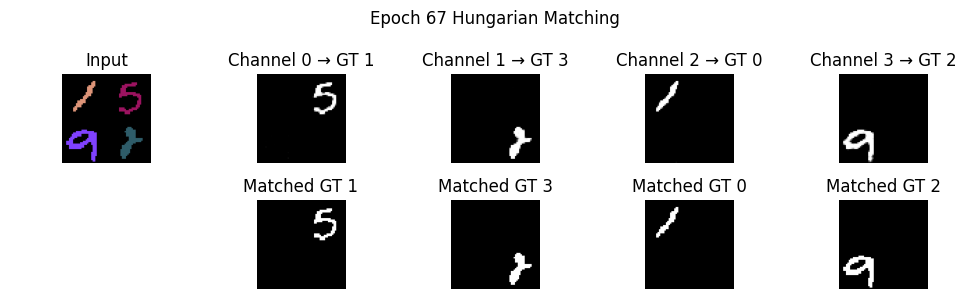

Epoch 67 | Train Loss: 0.0231 | Test Loss: 0.0212


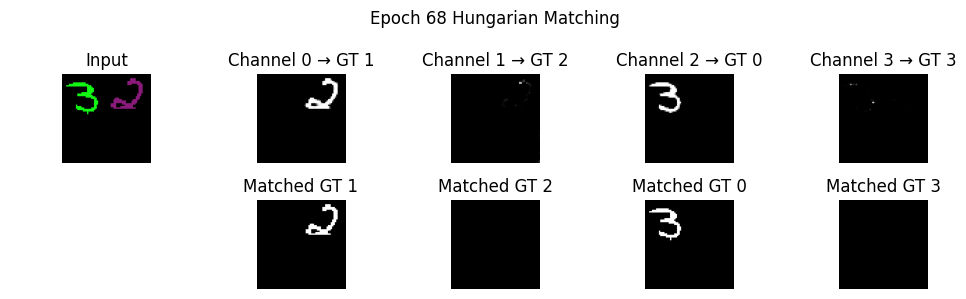

Model saved at epoch 68 with test loss: 0.0194
Epoch 68 | Train Loss: 0.0233 | Test Loss: 0.0194


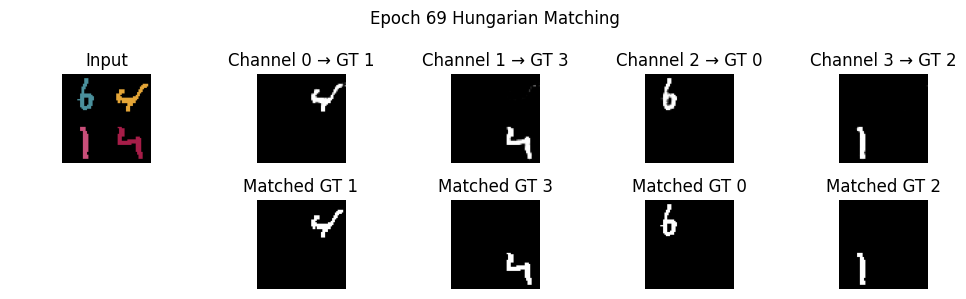

Epoch 69 | Train Loss: 0.0236 | Test Loss: 0.0207


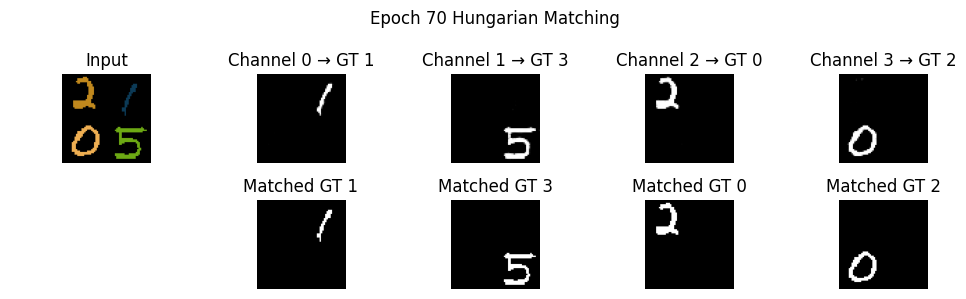

Model saved at epoch 70 with test loss: 0.0192
Epoch 70 | Train Loss: 0.0231 | Test Loss: 0.0192


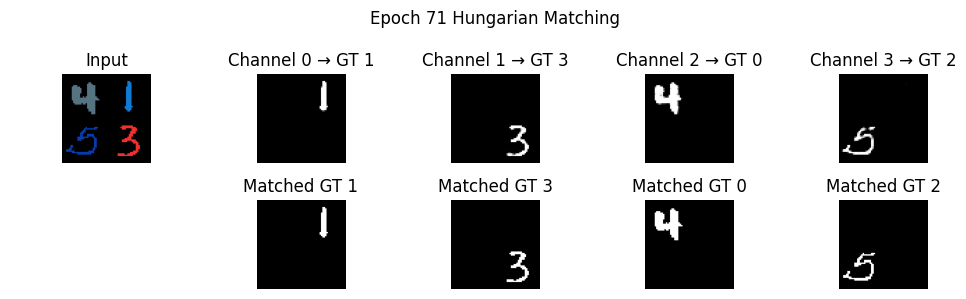

Model saved at epoch 71 with test loss: 0.0189
Epoch 71 | Train Loss: 0.0225 | Test Loss: 0.0189


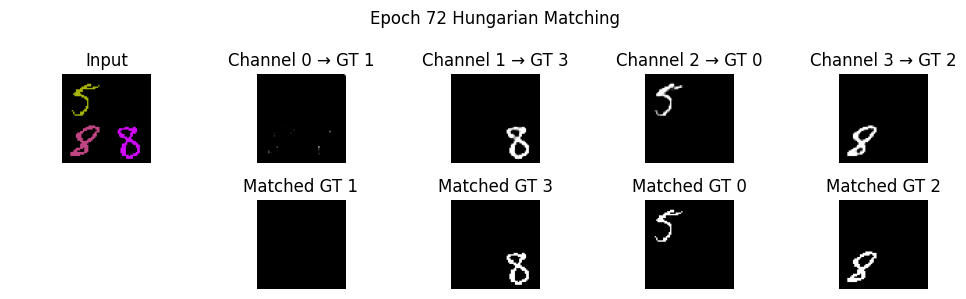

Epoch 72 | Train Loss: 0.0220 | Test Loss: 0.0204


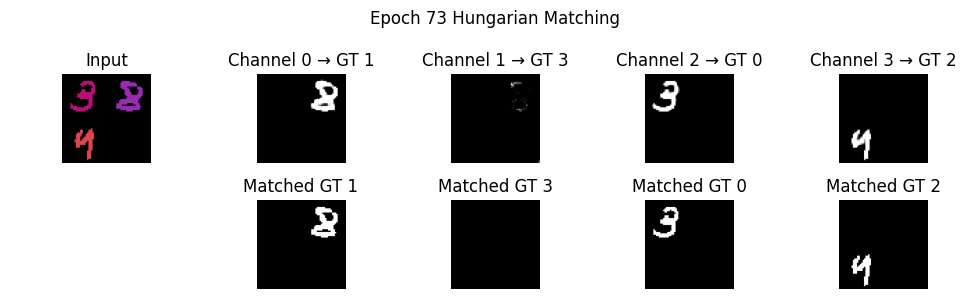

Model saved at epoch 73 with test loss: 0.0187
Epoch 73 | Train Loss: 0.0232 | Test Loss: 0.0187


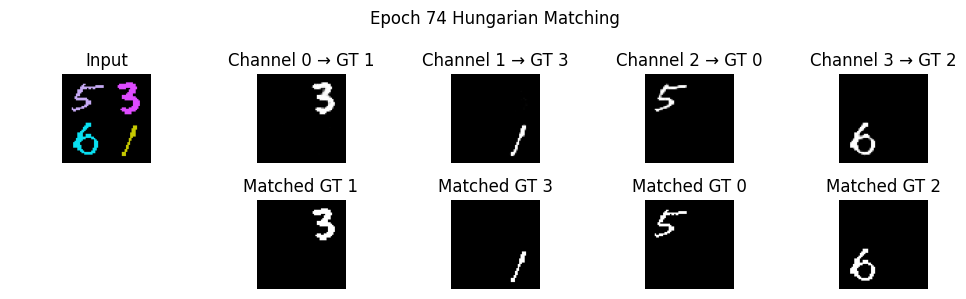

Epoch 74 | Train Loss: 0.0220 | Test Loss: 0.0202


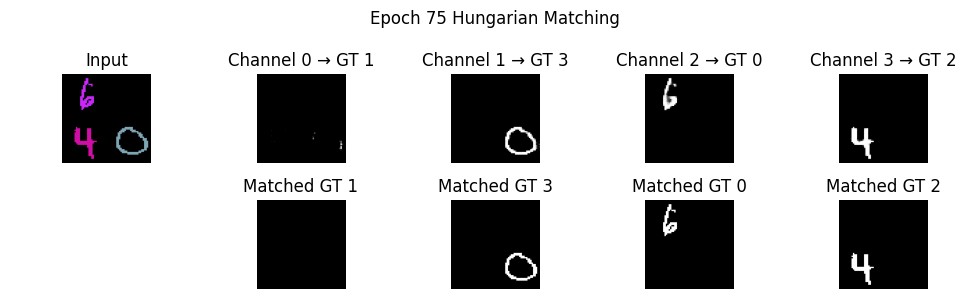

Model saved at epoch 75 with test loss: 0.0181
Epoch 75 | Train Loss: 0.0220 | Test Loss: 0.0181


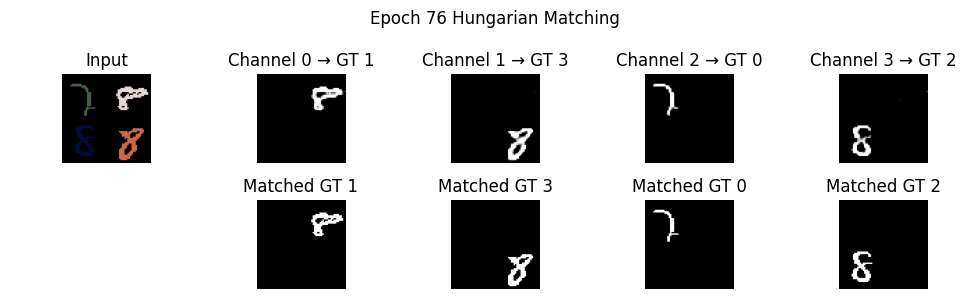

Model saved at epoch 76 with test loss: 0.0179
Epoch 76 | Train Loss: 0.0218 | Test Loss: 0.0179


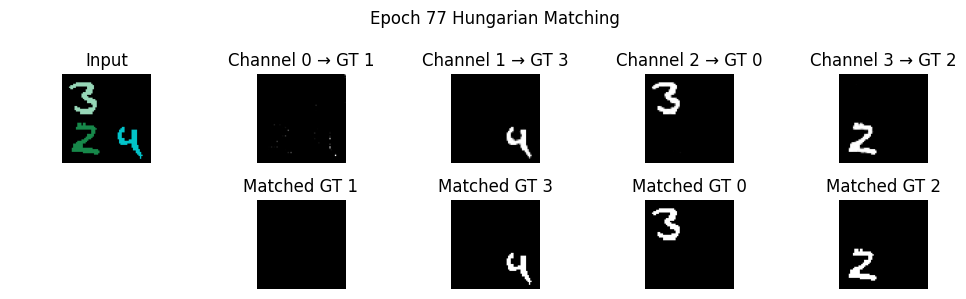

Epoch 77 | Train Loss: 0.0217 | Test Loss: 0.0211


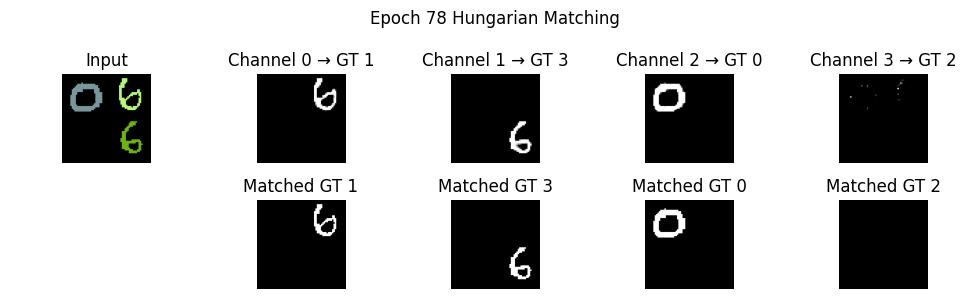

Model saved at epoch 78 with test loss: 0.0176
Epoch 78 | Train Loss: 0.0220 | Test Loss: 0.0176


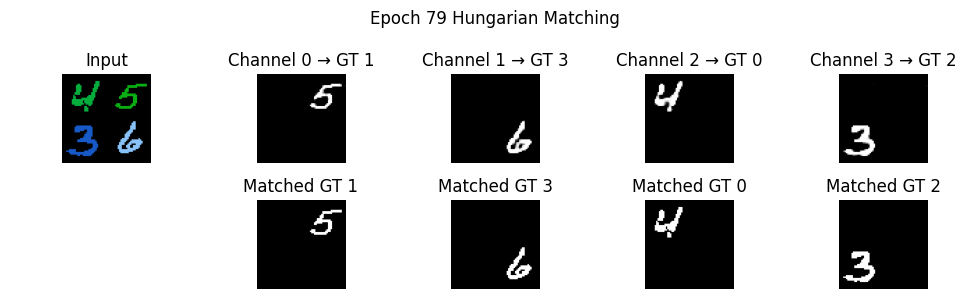

Epoch 79 | Train Loss: 0.0210 | Test Loss: 0.0194


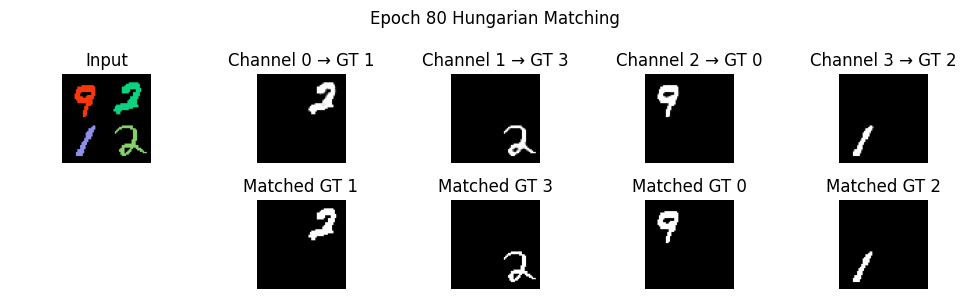

Model saved at epoch 80 with test loss: 0.0173
Epoch 80 | Train Loss: 0.0216 | Test Loss: 0.0173


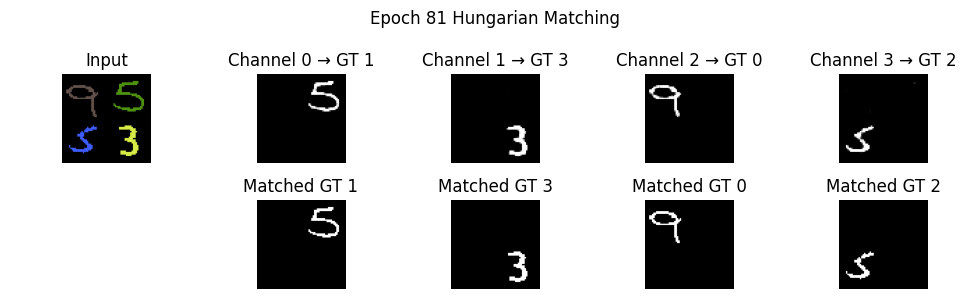

Epoch 81 | Train Loss: 0.0208 | Test Loss: 0.0177


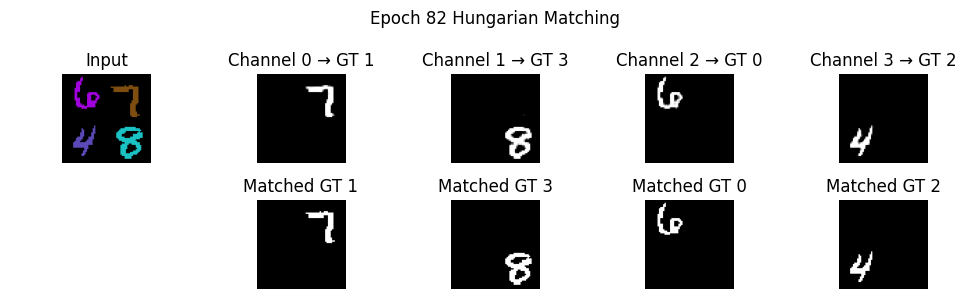

Model saved at epoch 82 with test loss: 0.0169
Epoch 82 | Train Loss: 0.0203 | Test Loss: 0.0169


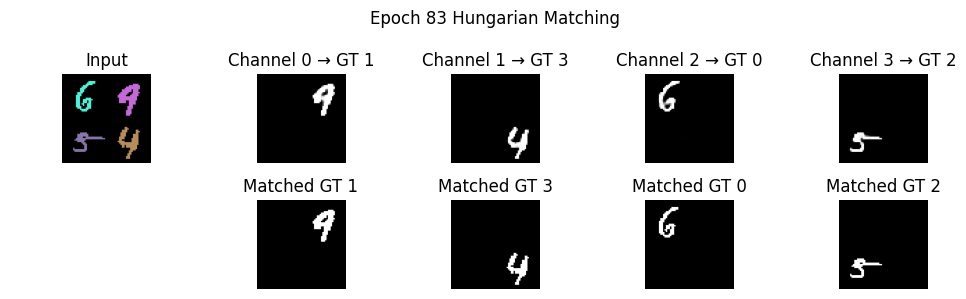

Epoch 83 | Train Loss: 0.0206 | Test Loss: 0.0184


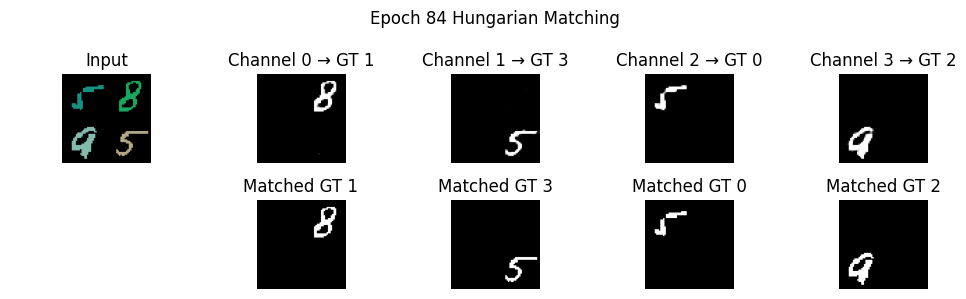

Model saved at epoch 84 with test loss: 0.0167
Epoch 84 | Train Loss: 0.0201 | Test Loss: 0.0167


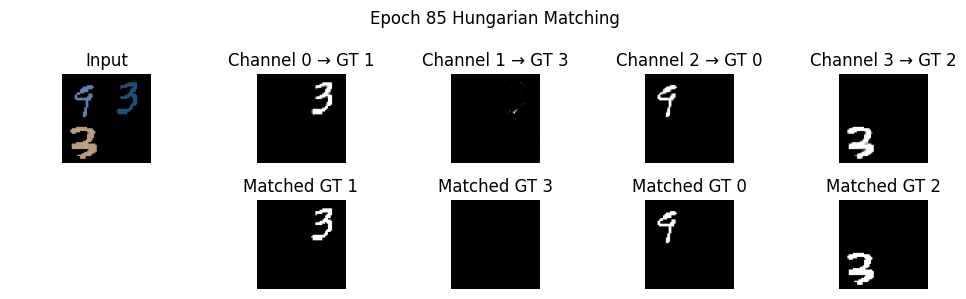

Model saved at epoch 85 with test loss: 0.0166
Epoch 85 | Train Loss: 0.0198 | Test Loss: 0.0166


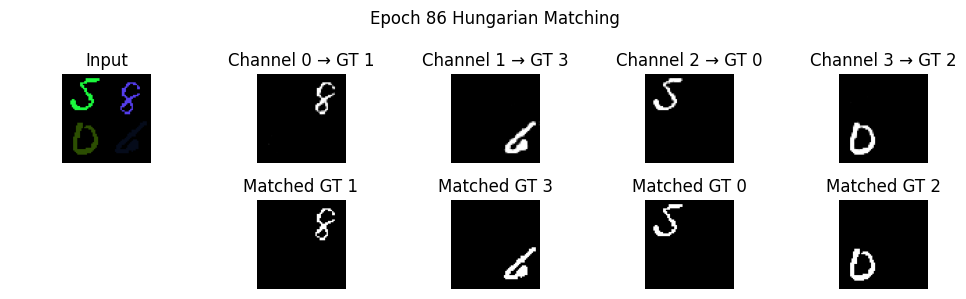

Model saved at epoch 86 with test loss: 0.0163
Epoch 86 | Train Loss: 0.0195 | Test Loss: 0.0163


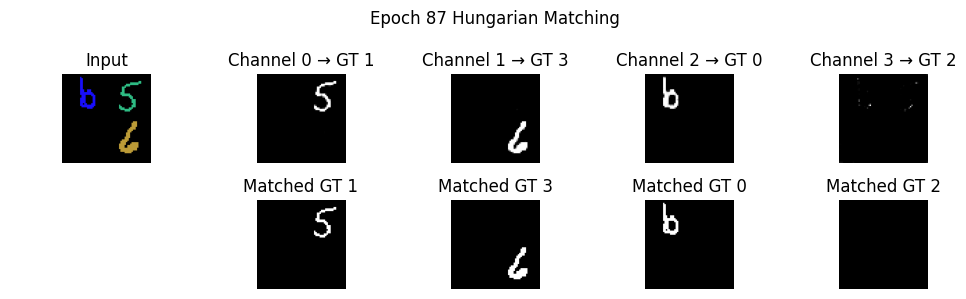

Epoch 87 | Train Loss: 0.0195 | Test Loss: 0.0165


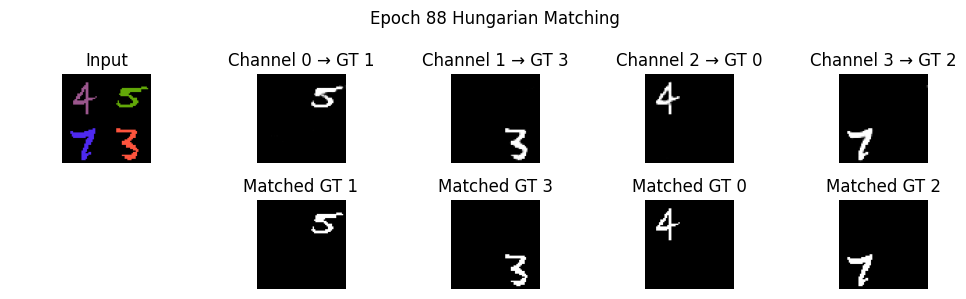

Model saved at epoch 88 with test loss: 0.0161
Epoch 88 | Train Loss: 0.0194 | Test Loss: 0.0161


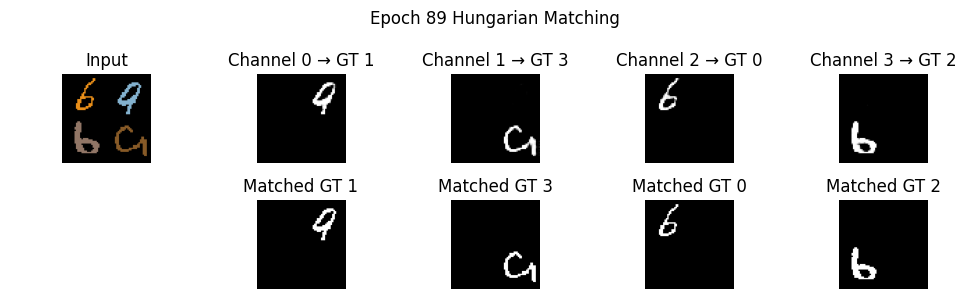

Epoch 89 | Train Loss: 0.0195 | Test Loss: 0.0171


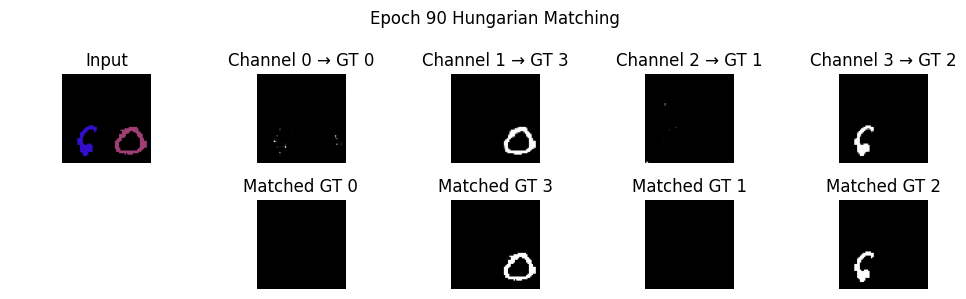

Epoch 90 | Train Loss: 0.0195 | Test Loss: 0.0161


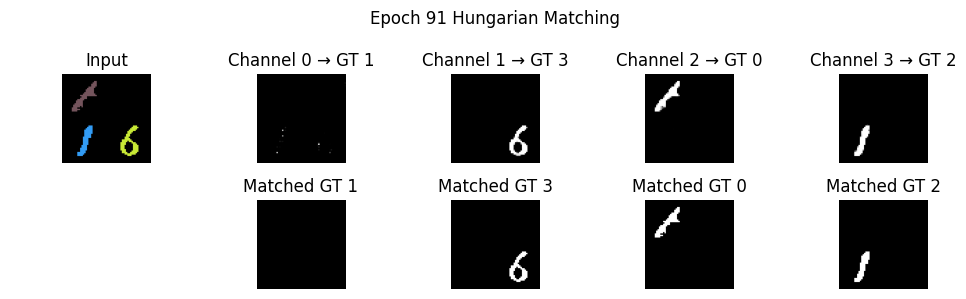

Epoch 91 | Train Loss: 0.0189 | Test Loss: 0.0163


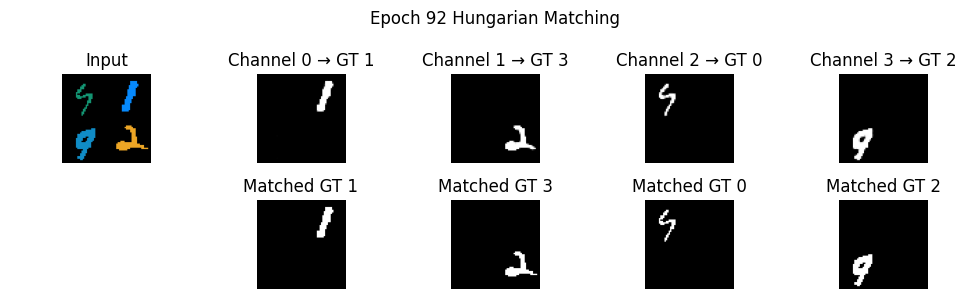

Model saved at epoch 92 with test loss: 0.0157
Epoch 92 | Train Loss: 0.0187 | Test Loss: 0.0157


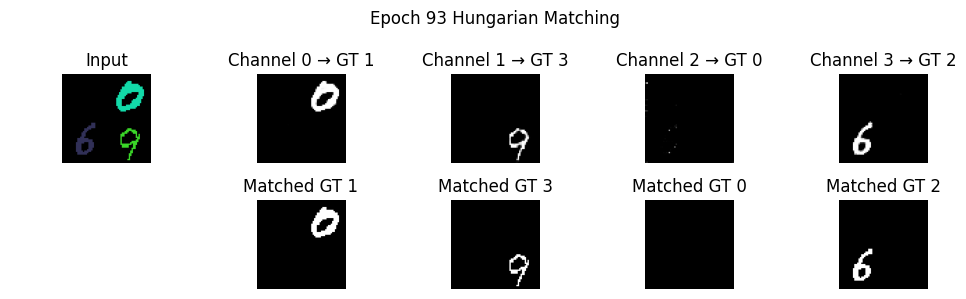

Epoch 93 | Train Loss: 0.0185 | Test Loss: 0.0159


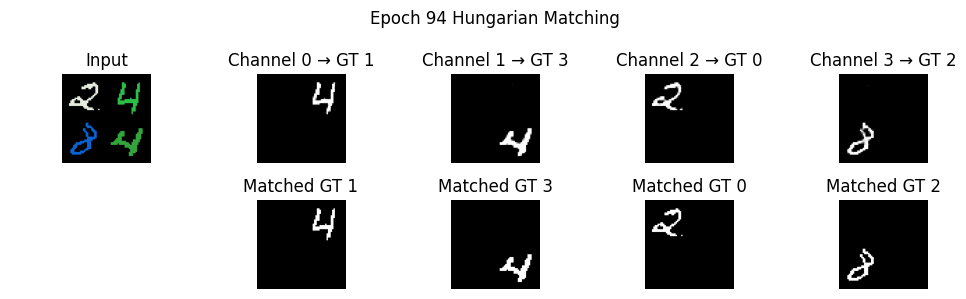

Model saved at epoch 94 with test loss: 0.0156
Epoch 94 | Train Loss: 0.0184 | Test Loss: 0.0156


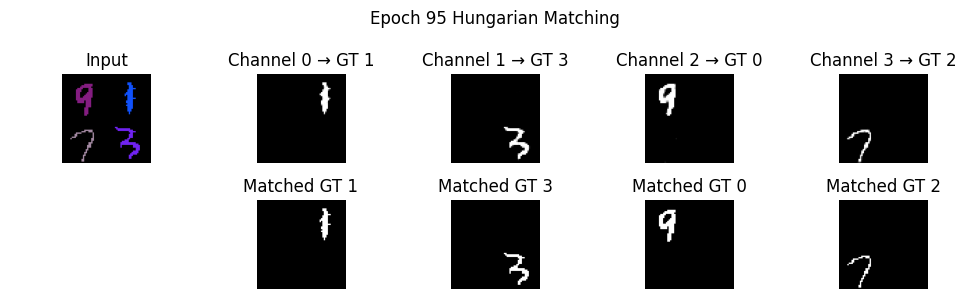

Model saved at epoch 95 with test loss: 0.0154
Epoch 95 | Train Loss: 0.0182 | Test Loss: 0.0154


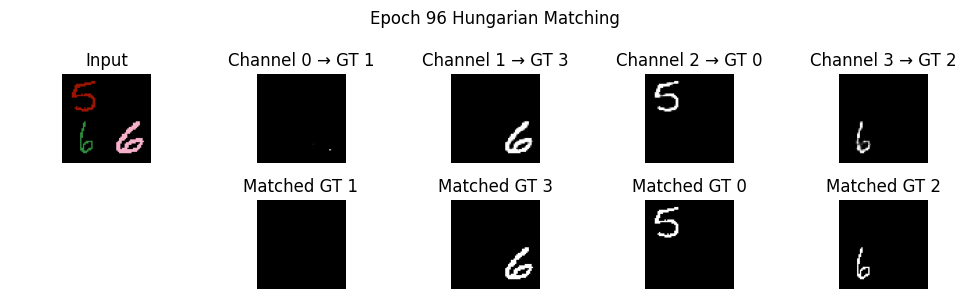

Model saved at epoch 96 with test loss: 0.0153
Epoch 96 | Train Loss: 0.0185 | Test Loss: 0.0153


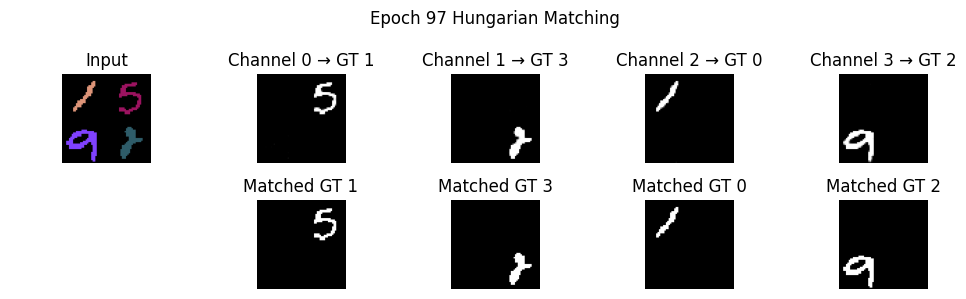

Model saved at epoch 97 with test loss: 0.0149
Epoch 97 | Train Loss: 0.0180 | Test Loss: 0.0149


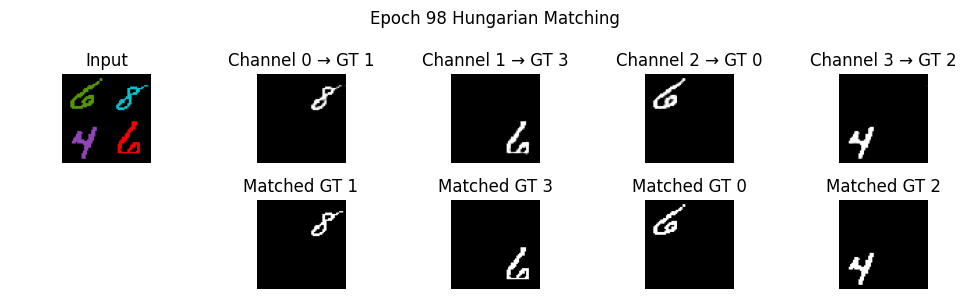

Model saved at epoch 98 with test loss: 0.0148
Epoch 98 | Train Loss: 0.0180 | Test Loss: 0.0148


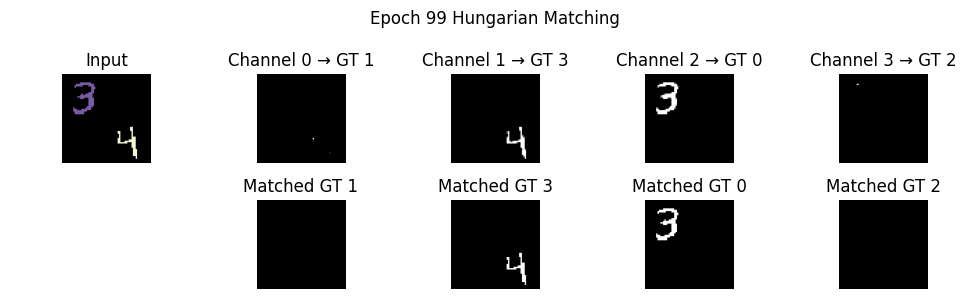

Model saved at epoch 99 with test loss: 0.0146
Epoch 99 | Train Loss: 0.0178 | Test Loss: 0.0146


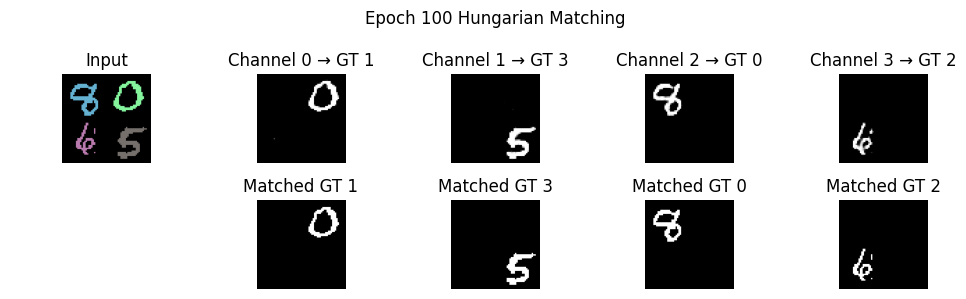

Epoch 100 | Train Loss: 0.0187 | Test Loss: 0.0164


In [89]:
'''
    TODO : 학습 루프 정의
'''
batch_size = 64
epochs = 100
lr = 0.003
device = 'mps'

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

seg_model = MultiSegNet().to(device)
optimizer = torch.optim.Adam(seg_model.parameters(), lr=lr)
criterion = nn.BCELoss()
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

train_loss_list = []
test_loss_list = []
best_test_loss = float('inf')  # 초기값을 매우 큰 값으로 설정

for epoch in range(epochs):
    seg_model.train()
    total_train_loss = 0

    for batch_idx, (img, masks, labels) in enumerate(train_loader):
        img, masks, labels = img.to(device), masks.to(device), labels.to(device)
        pred = seg_model(img)  # (B, 4, 1, 64, 64)

        loss = 0
        for b in range(img.size(0)):
            cost_matrix = torch.zeros(4, 4)
            for i in range(4):
                for j in range(4):
                    if labels[b, j] == -1:
                        cost_matrix[i, j] = 1.0  # worst IoU
                    else:
                        iou = compute_iou(pred[b, i], masks[b, j])
                        cost_matrix[i, j] = 1 - iou  # IoU를 최소화 비용으로

            row_idx, col_idx = linear_sum_assignment(cost_matrix.detach().cpu().numpy())
            for i, j in zip(row_idx, col_idx):
                if labels[b, j] != -1:
                    loss += criterion(pred[b, i], masks[b, j])
        
        loss = loss / img.size(0)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

        if batch_idx == 0:
            seg_model.eval()
            with torch.no_grad():
                visualize_decoder_outputs_with_matching(img[0], pred[0], masks[0], labels[0], epoch+1)
            seg_model.train()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_list.append(avg_train_loss)

    # ====== 테스트 ======
    seg_model.eval()
    total_test_loss = 0

    with torch.no_grad():
        for img, masks, labels in test_loader:
            img, masks, labels = img.to(device), masks.to(device), labels.to(device)
            pred = seg_model(img)

            loss = 0
            for b in range(img.size(0)):
                cost_matrix = torch.zeros(4, 4)
                for i in range(4):
                    for j in range(4):
                        if labels[b, j] == -1:
                            cost_matrix[i, j] = 1.0
                        else:
                            iou = compute_iou(pred[b, i], masks[b, j])
                            cost_matrix[i, j] = 1 - iou

                row_idx, col_idx = linear_sum_assignment(cost_matrix.detach().cpu().numpy())
                for i, j in zip(row_idx, col_idx):
                    if labels[b, j] != -1:
                        loss += criterion(pred[b, i], masks[b, j])

            loss = loss / img.size(0)
            total_test_loss += loss.item()

    avg_test_loss = total_test_loss / len(test_loader)
    test_loss_list.append(avg_test_loss)
    if avg_test_loss < best_test_loss:
        best_test_loss = avg_test_loss
        torch.save(seg_model.state_dict(), 'best_multi_seg_model.pth')
        print(f"Model saved at epoch {epoch+1} with test loss: {avg_test_loss:.4f}")
        
    scheduler.step(avg_test_loss)

    print(f"Epoch {epoch+1} | Train Loss: {avg_train_loss:.4f} | Test Loss: {avg_test_loss:.4f}")

Min Train Loss: 0.0178 at epoch 98
Min Test Loss: 0.0146 at epoch 98


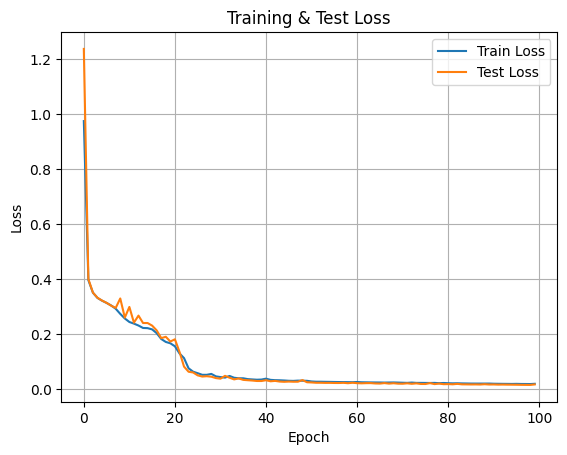

In [90]:
'''
    TODO : loss 시각화
'''
min_train_loss = min(train_loss_list)
min_train_epoch = train_loss_list.index(min_train_loss)

min_test_loss = min(test_loss_list)
min_test_epoch = test_loss_list.index(min_test_loss)

print(f"Min Train Loss: {min_train_loss:.4f} at epoch {min_train_epoch}")
print(f"Min Test Loss: {min_test_loss:.4f} at epoch {min_test_epoch}")

visualize_loss_curves(train_loss_list, test_loss_list) 

### AutoEncdoer layer 기반의 Unet

In [150]:
class UNetLight(nn.Module):
    def __init__(self, in_channels=3, out_channels=4):
        super(UNetLight, self).__init__()

        # Encoder
        self.enc1 = self.conv_block(in_channels, 16)
        self.enc2 = self.conv_block(16, 32)
        self.enc3 = self.conv_block(32, 64)
        self.enc4 = self.conv_block(64, 128)
        self.enc5 = self.conv_block(128, 128)

        # Decoder
        self.up4 = nn.ConvTranspose2d(128, 128, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(128 + 128, 64)

        self.up3 = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(64 + 64, 32)

        self.up2 = nn.ConvTranspose2d(32, 32, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(32 + 32, 16)

        self.up1 = nn.ConvTranspose2d(16, 16, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(16 + 16, 16)

        # Final conv
        self.final_conv = nn.Conv2d(16, out_channels, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(F.max_pool2d(e1, 2))
        e3 = self.enc3(F.max_pool2d(e2, 2))
        e4 = self.enc4(F.max_pool2d(e3, 2))
        e5 = self.enc5(F.max_pool2d(e4, 2))

        # Decoder
        d4 = self.up4(e5)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)

        d3 = self.up3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        out = self.final_conv(d1)
        out = self.sigmoid(out)

        return out


/opt/anaconda3/envs/UR/lib/python3.13/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


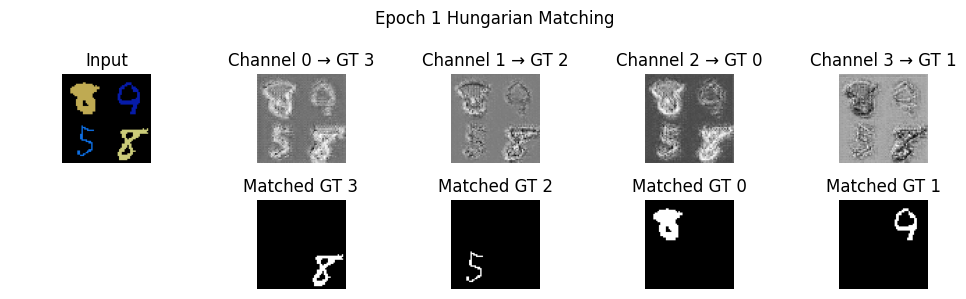

Model saved at epoch 1 with test loss: 2.6597
Epoch 1 | Train Loss: 2.6830 | Test Loss: 2.6597


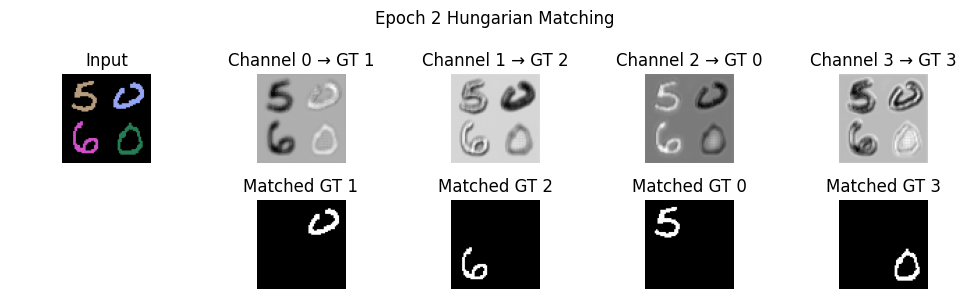

Model saved at epoch 2 with test loss: 2.0638
Epoch 2 | Train Loss: 2.1620 | Test Loss: 2.0638


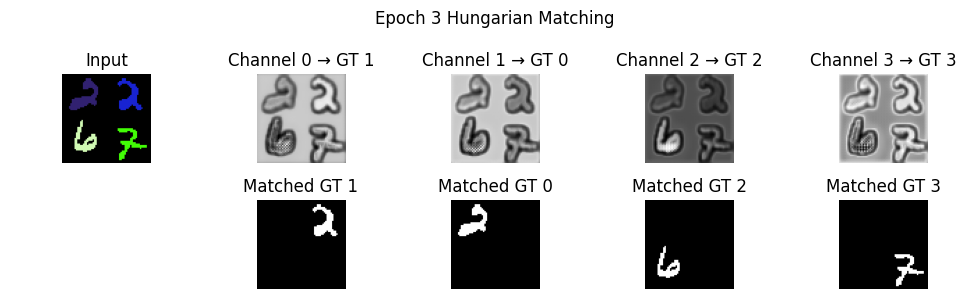

Model saved at epoch 3 with test loss: 1.3445
Epoch 3 | Train Loss: 1.6054 | Test Loss: 1.3445


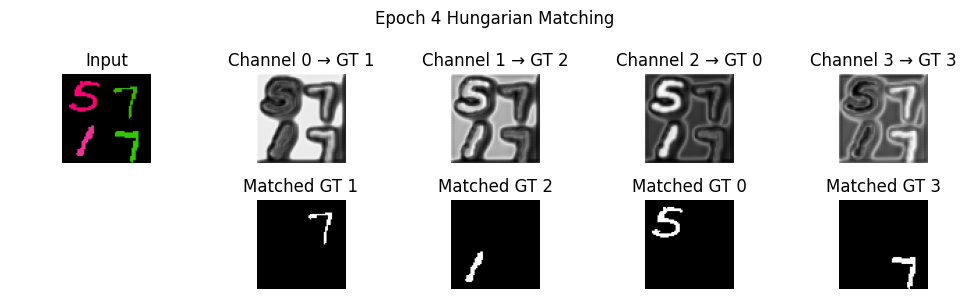

Model saved at epoch 4 with test loss: 0.8953
Epoch 4 | Train Loss: 1.1248 | Test Loss: 0.8953


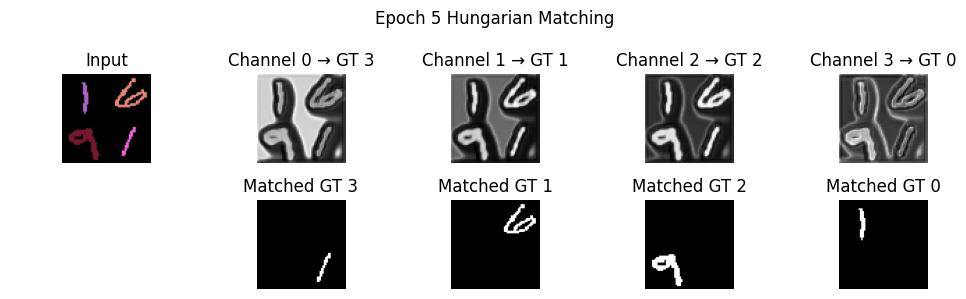

Model saved at epoch 5 with test loss: 0.6633
Epoch 5 | Train Loss: 0.7741 | Test Loss: 0.6633


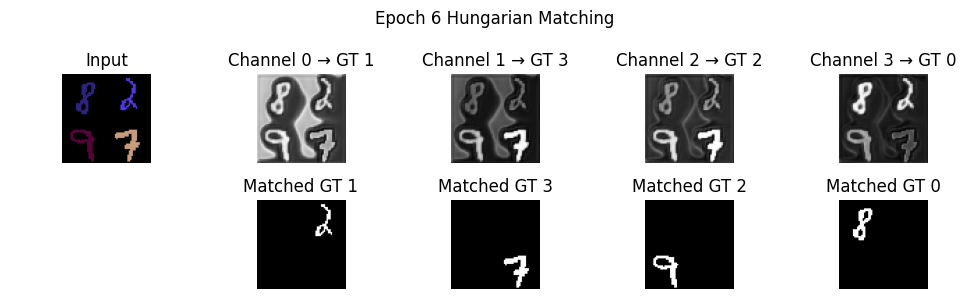

Model saved at epoch 6 with test loss: 0.6276
Epoch 6 | Train Loss: 0.5510 | Test Loss: 0.6276


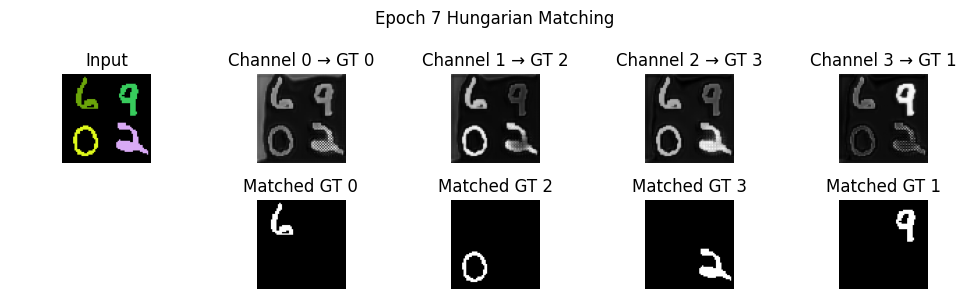

Model saved at epoch 7 with test loss: 0.4373
Epoch 7 | Train Loss: 0.4206 | Test Loss: 0.4373


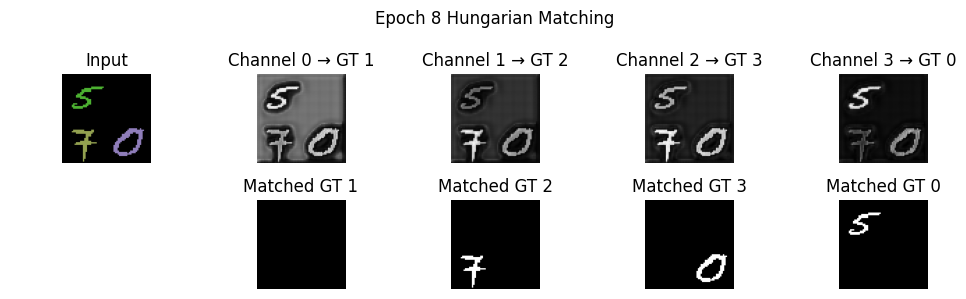

Model saved at epoch 8 with test loss: 0.3416
Epoch 8 | Train Loss: 0.3513 | Test Loss: 0.3416


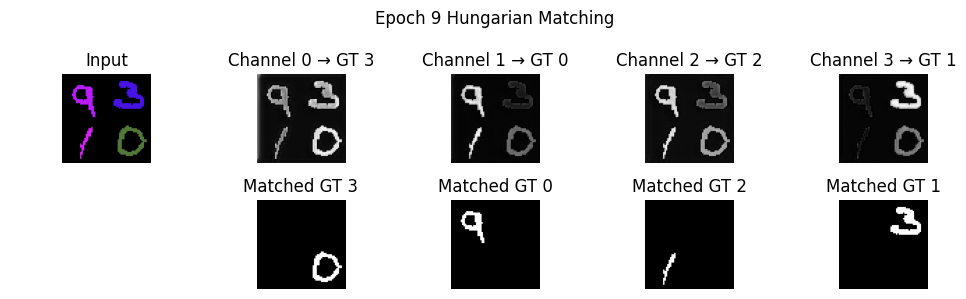

Model saved at epoch 9 with test loss: 0.3171
Epoch 9 | Train Loss: 0.3070 | Test Loss: 0.3171


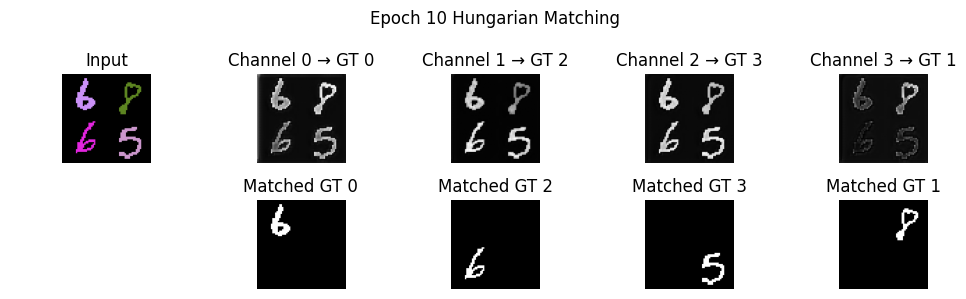

Model saved at epoch 10 with test loss: 0.2872
Epoch 10 | Train Loss: 0.2785 | Test Loss: 0.2872


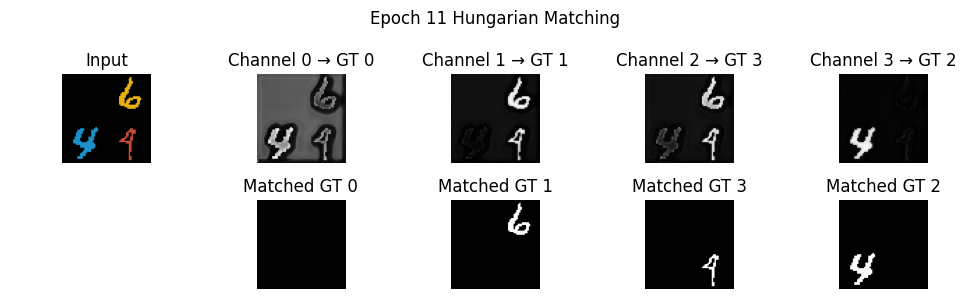

Model saved at epoch 11 with test loss: 0.2604
Epoch 11 | Train Loss: 0.2587 | Test Loss: 0.2604


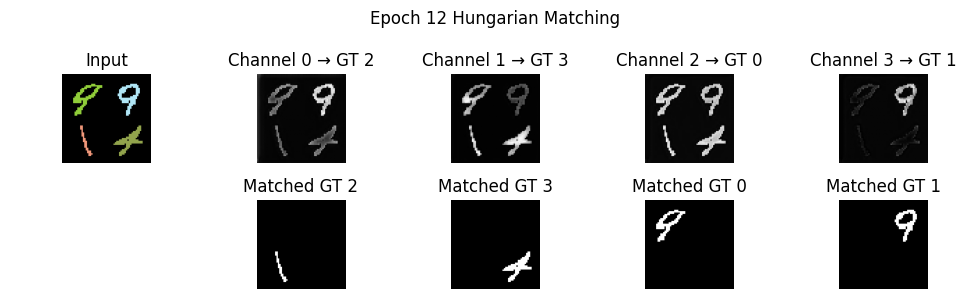

Model saved at epoch 12 with test loss: 0.2436
Epoch 12 | Train Loss: 0.2444 | Test Loss: 0.2436


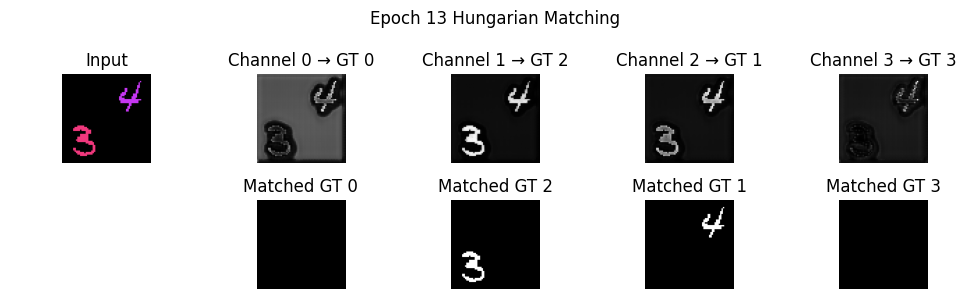

Model saved at epoch 13 with test loss: 0.2417
Epoch 13 | Train Loss: 0.2344 | Test Loss: 0.2417


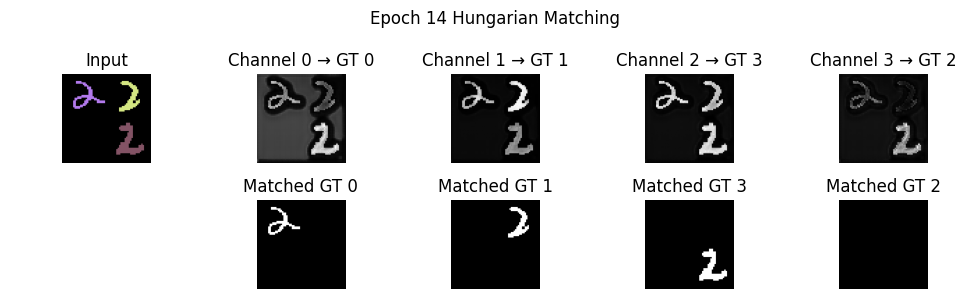

Model saved at epoch 14 with test loss: 0.2232
Epoch 14 | Train Loss: 0.2249 | Test Loss: 0.2232


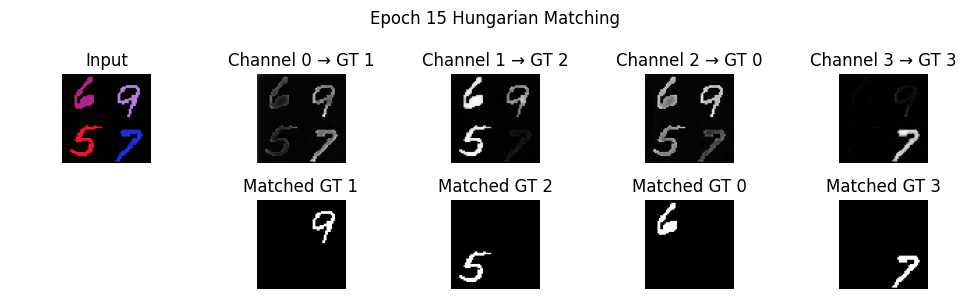

Epoch 15 | Train Loss: 0.2168 | Test Loss: 0.2247


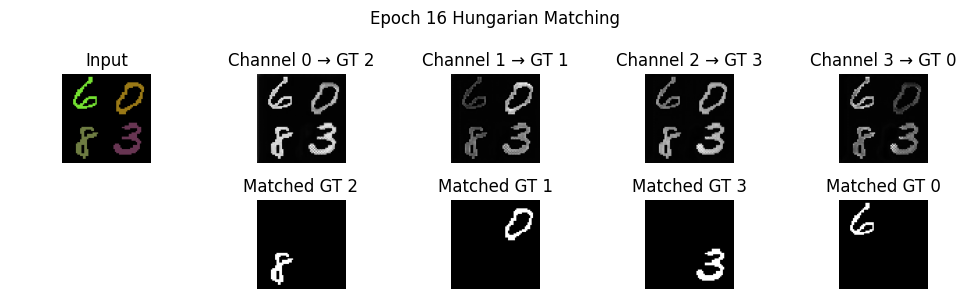

Model saved at epoch 16 with test loss: 0.2181
Epoch 16 | Train Loss: 0.2119 | Test Loss: 0.2181


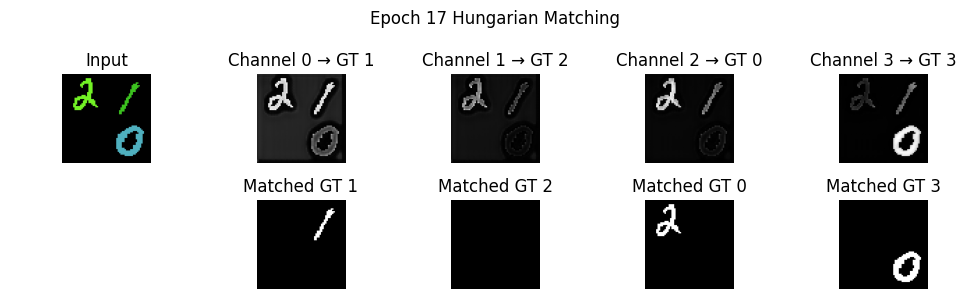

Model saved at epoch 17 with test loss: 0.2056
Epoch 17 | Train Loss: 0.2013 | Test Loss: 0.2056


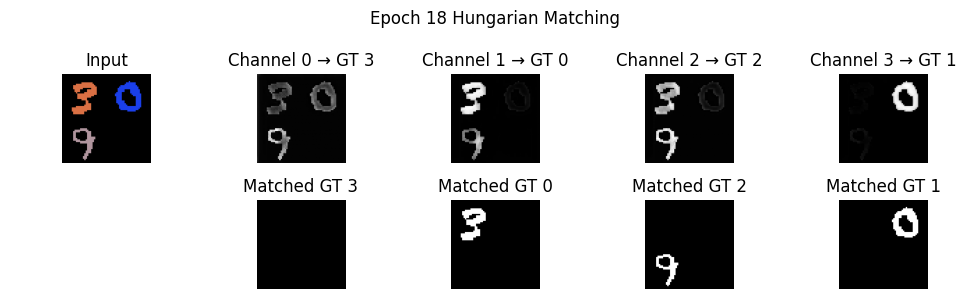

Model saved at epoch 18 with test loss: 0.1964
Epoch 18 | Train Loss: 0.1872 | Test Loss: 0.1964


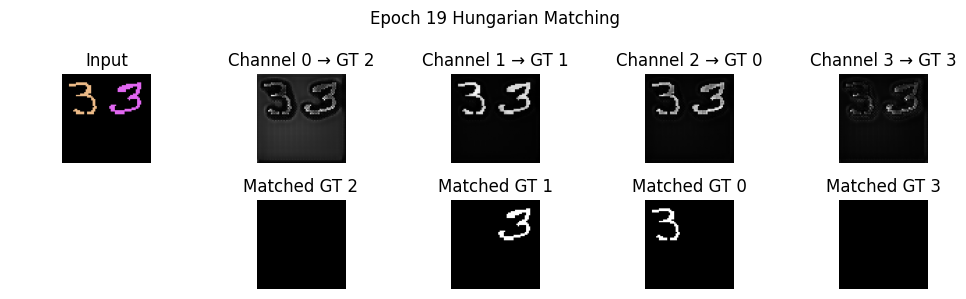

Model saved at epoch 19 with test loss: 0.1743
Epoch 19 | Train Loss: 0.1687 | Test Loss: 0.1743


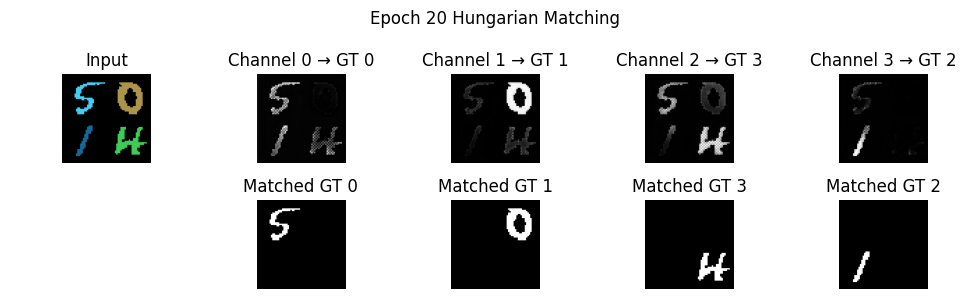

Epoch 20 | Train Loss: 0.1575 | Test Loss: 0.2577


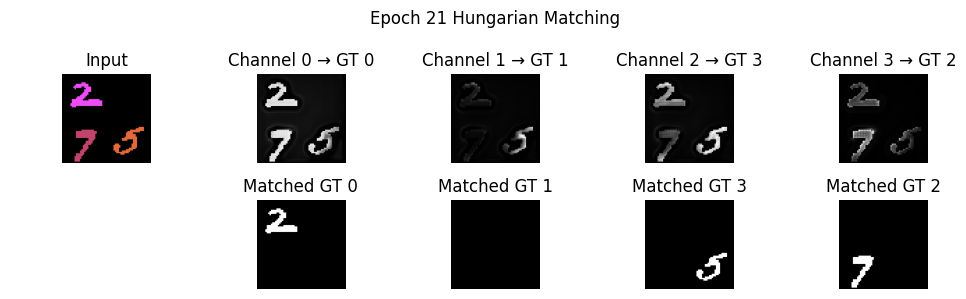

Epoch 21 | Train Loss: 0.1492 | Test Loss: 0.1986


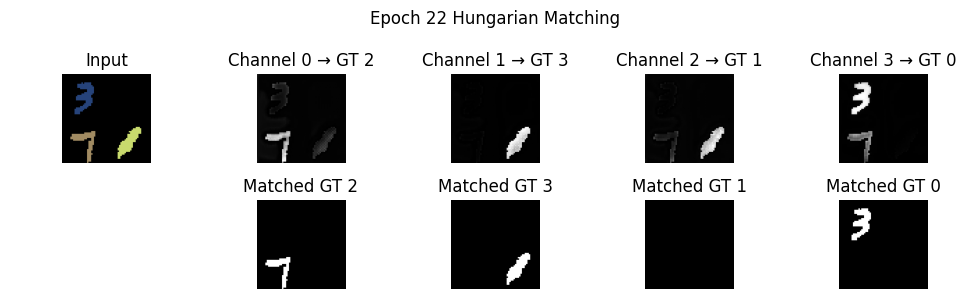

Model saved at epoch 22 with test loss: 0.1341
Epoch 22 | Train Loss: 0.1259 | Test Loss: 0.1341


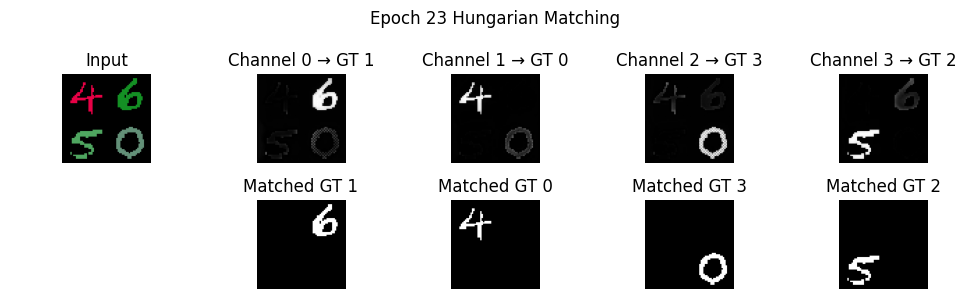

Model saved at epoch 23 with test loss: 0.1254
Epoch 23 | Train Loss: 0.1105 | Test Loss: 0.1254


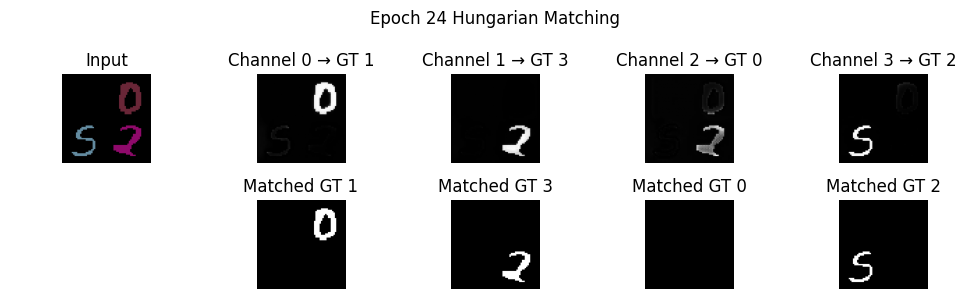

Model saved at epoch 24 with test loss: 0.0863
Epoch 24 | Train Loss: 0.0961 | Test Loss: 0.0863


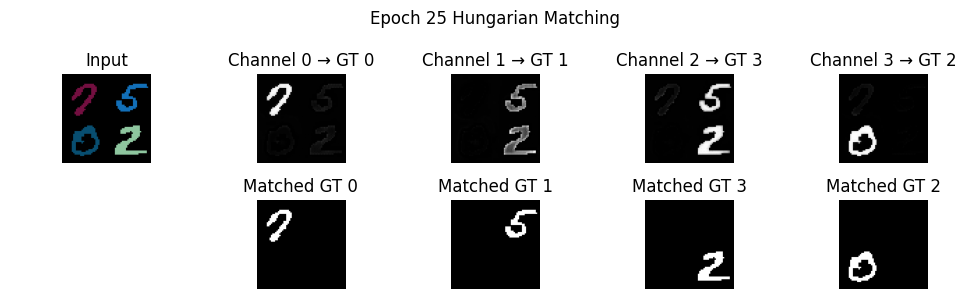

Epoch 25 | Train Loss: 0.0833 | Test Loss: 0.1000


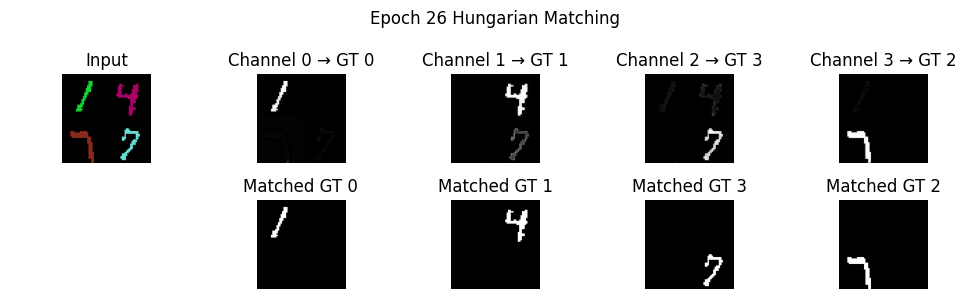

Model saved at epoch 26 with test loss: 0.0755
Epoch 26 | Train Loss: 0.0735 | Test Loss: 0.0755


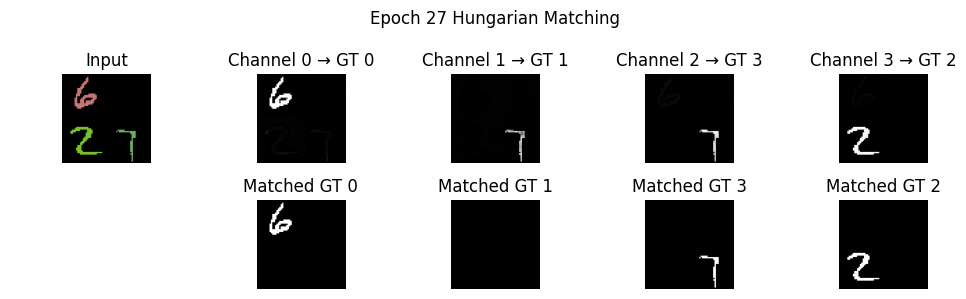

Model saved at epoch 27 with test loss: 0.0694
Epoch 27 | Train Loss: 0.0659 | Test Loss: 0.0694


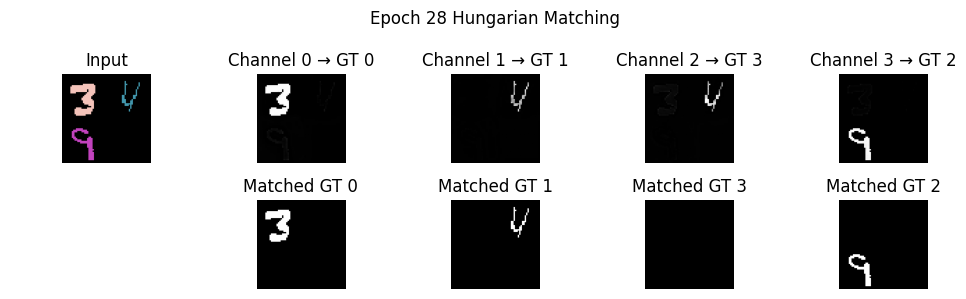

Model saved at epoch 28 with test loss: 0.0670
Epoch 28 | Train Loss: 0.0614 | Test Loss: 0.0670


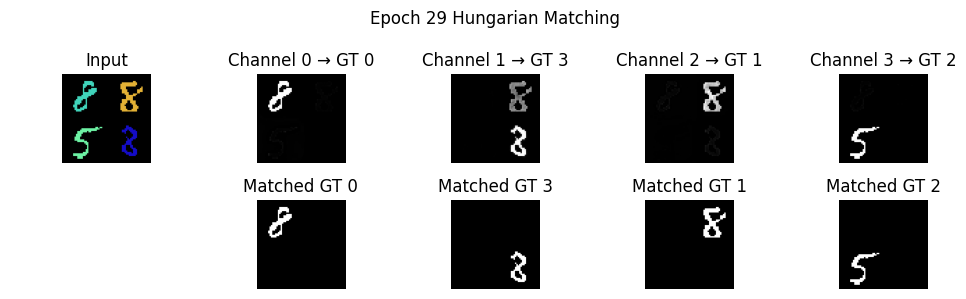

Model saved at epoch 29 with test loss: 0.0658
Epoch 29 | Train Loss: 0.0584 | Test Loss: 0.0658


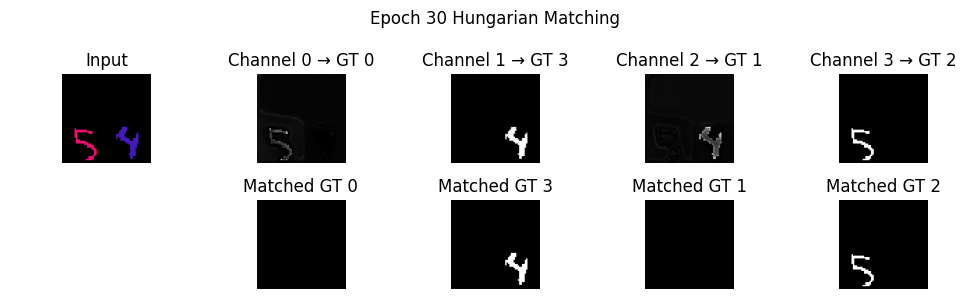

Epoch 30 | Train Loss: 0.0470 | Test Loss: 0.1229


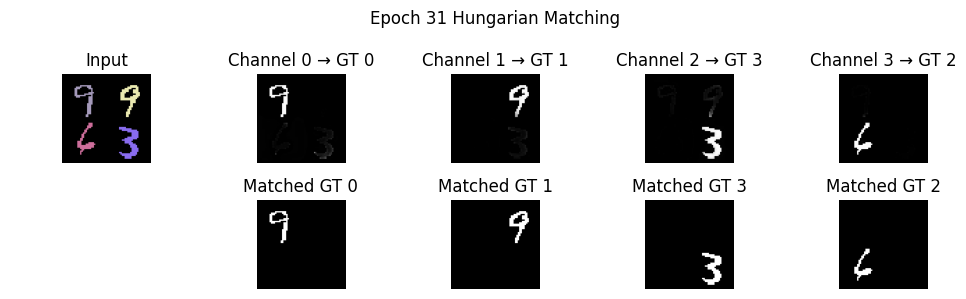

Model saved at epoch 31 with test loss: 0.0195
Epoch 31 | Train Loss: 0.0232 | Test Loss: 0.0195


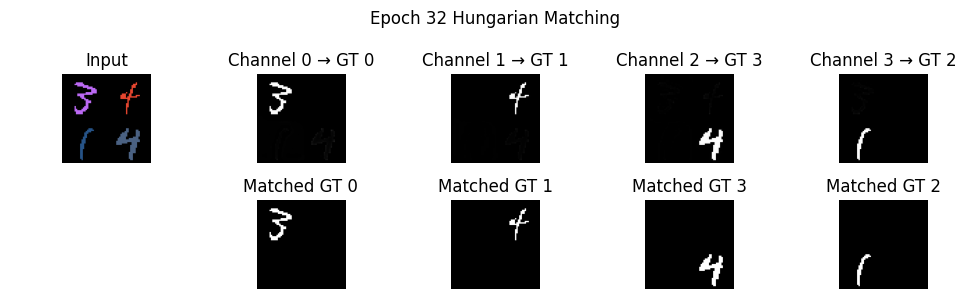

Model saved at epoch 32 with test loss: 0.0169
Epoch 32 | Train Loss: 0.0174 | Test Loss: 0.0169


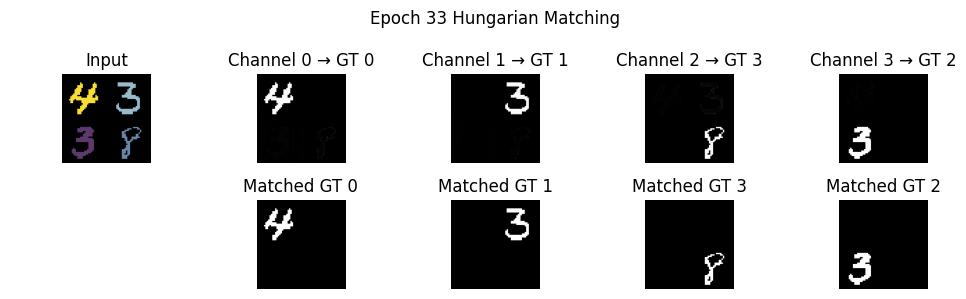

Model saved at epoch 33 with test loss: 0.0143
Epoch 33 | Train Loss: 0.0146 | Test Loss: 0.0143


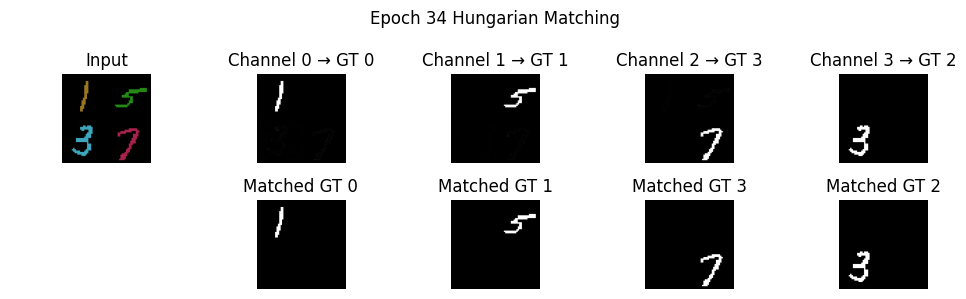

Model saved at epoch 34 with test loss: 0.0130
Epoch 34 | Train Loss: 0.0126 | Test Loss: 0.0130


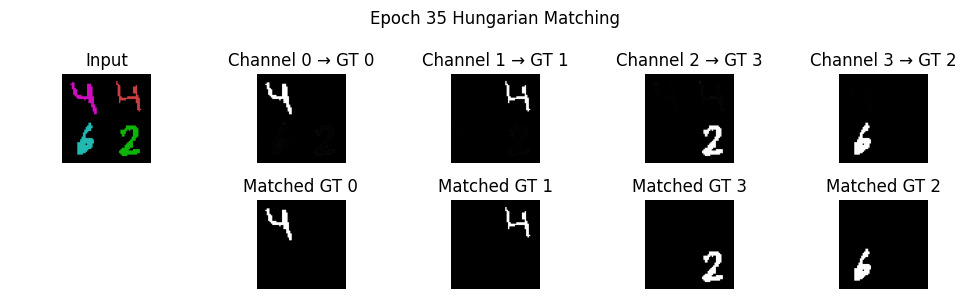

Model saved at epoch 35 with test loss: 0.0114
Epoch 35 | Train Loss: 0.0112 | Test Loss: 0.0114


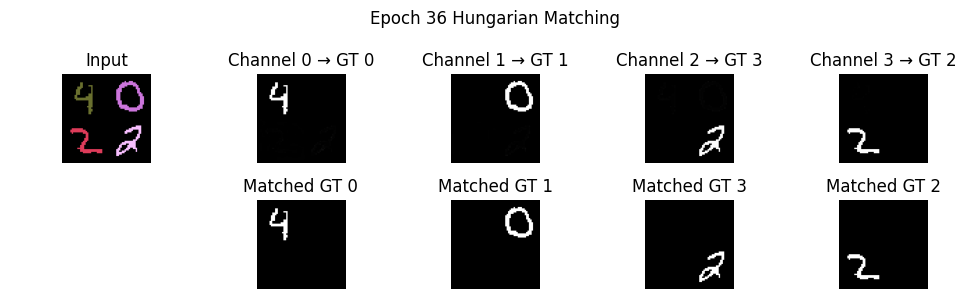

Model saved at epoch 36 with test loss: 0.0105
Epoch 36 | Train Loss: 0.0101 | Test Loss: 0.0105


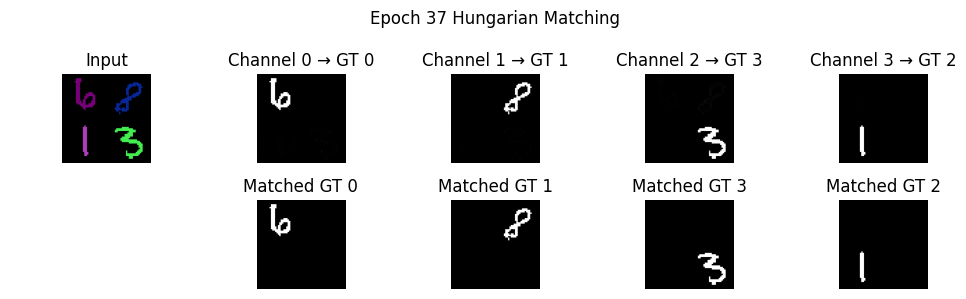

Model saved at epoch 37 with test loss: 0.0094
Epoch 37 | Train Loss: 0.0092 | Test Loss: 0.0094


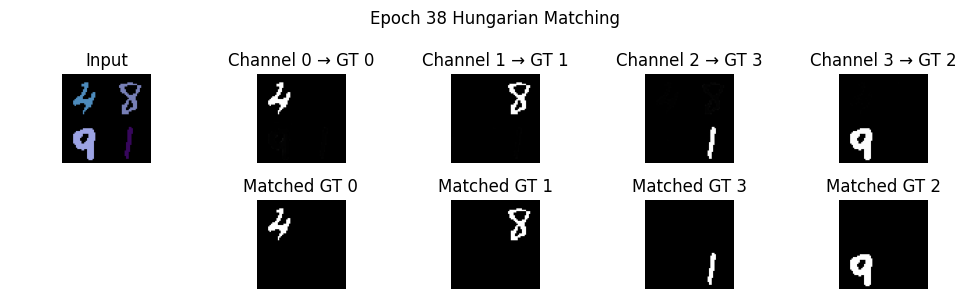

Model saved at epoch 38 with test loss: 0.0086
Epoch 38 | Train Loss: 0.0084 | Test Loss: 0.0086


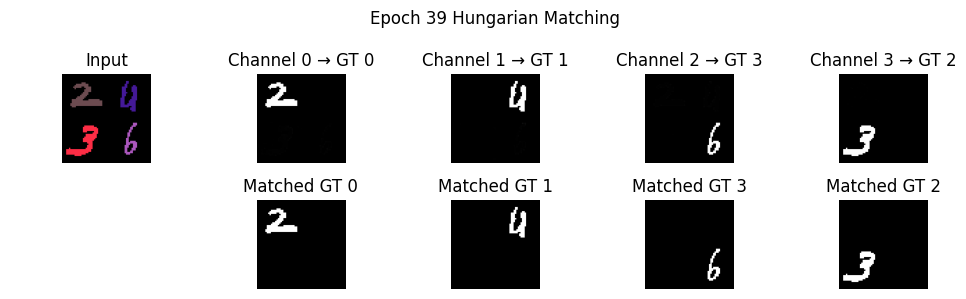

Model saved at epoch 39 with test loss: 0.0080
Epoch 39 | Train Loss: 0.0078 | Test Loss: 0.0080


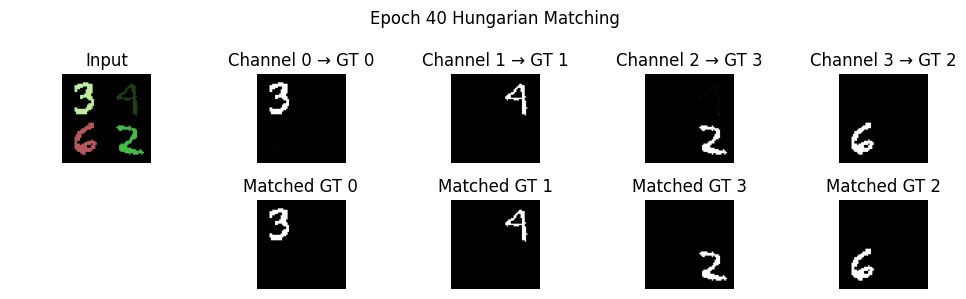

Model saved at epoch 40 with test loss: 0.0074
Epoch 40 | Train Loss: 0.0072 | Test Loss: 0.0074


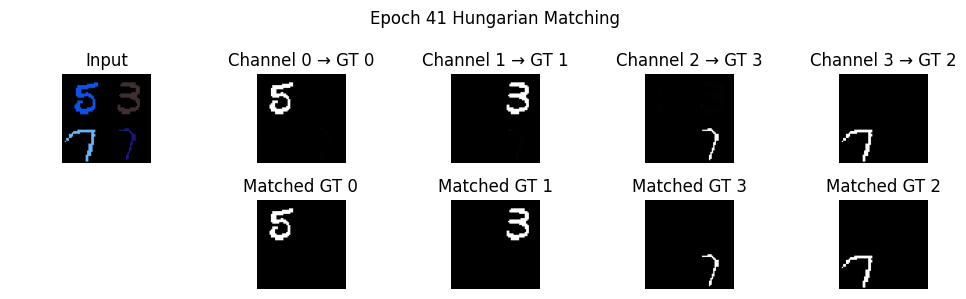

Model saved at epoch 41 with test loss: 0.0069
Epoch 41 | Train Loss: 0.0067 | Test Loss: 0.0069


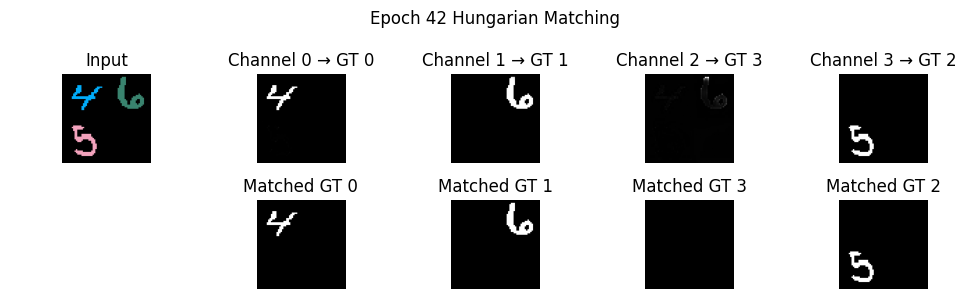

Model saved at epoch 42 with test loss: 0.0065
Epoch 42 | Train Loss: 0.0063 | Test Loss: 0.0065


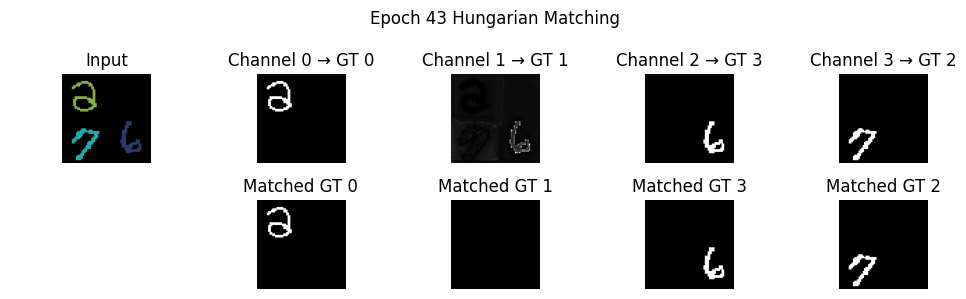

Model saved at epoch 43 with test loss: 0.0061
Epoch 43 | Train Loss: 0.0059 | Test Loss: 0.0061


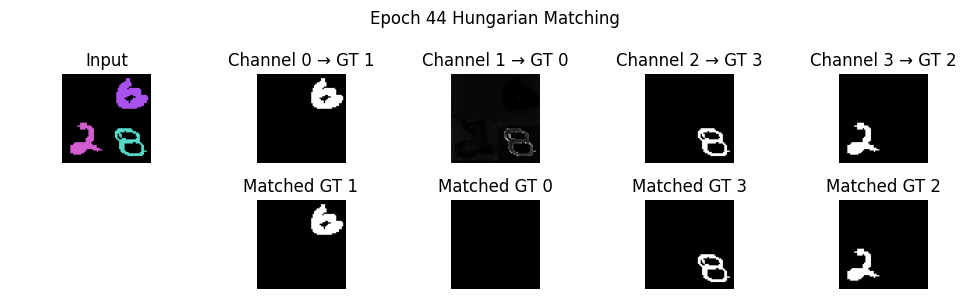

Model saved at epoch 44 with test loss: 0.0057
Epoch 44 | Train Loss: 0.0056 | Test Loss: 0.0057


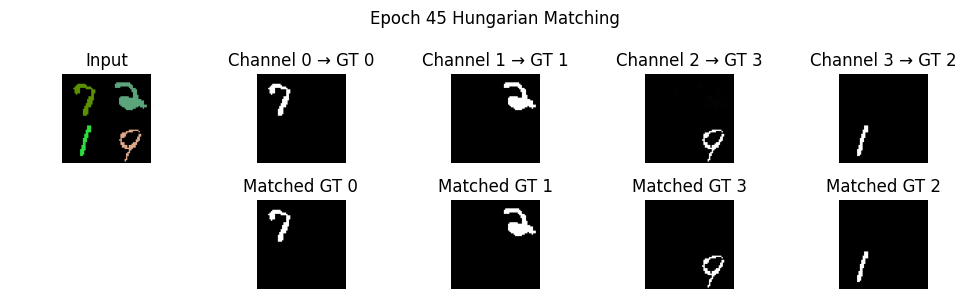

Model saved at epoch 45 with test loss: 0.0053
Epoch 45 | Train Loss: 0.0052 | Test Loss: 0.0053


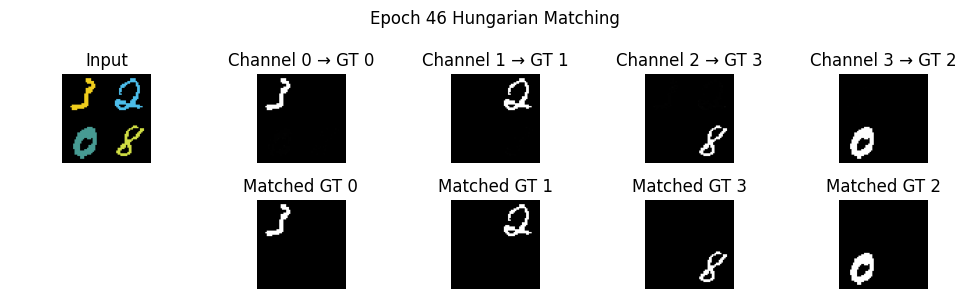

Model saved at epoch 46 with test loss: 0.0052
Epoch 46 | Train Loss: 0.0049 | Test Loss: 0.0052


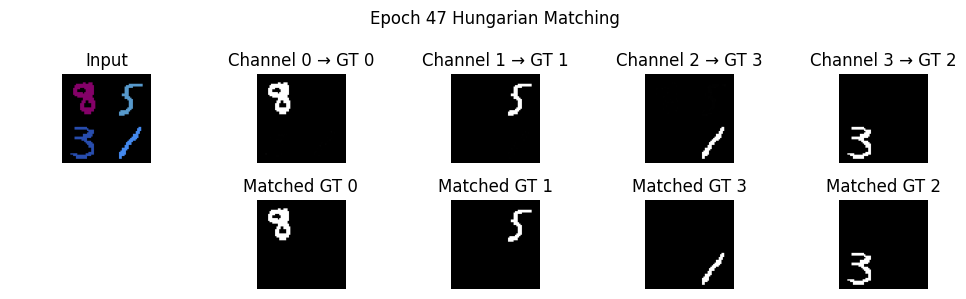

Model saved at epoch 47 with test loss: 0.0048
Epoch 47 | Train Loss: 0.0047 | Test Loss: 0.0048


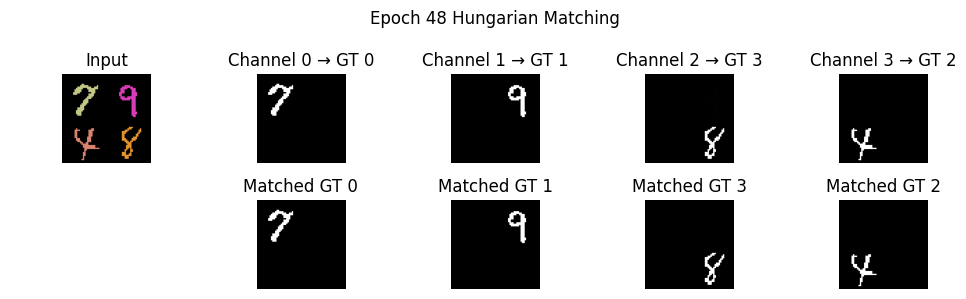

Model saved at epoch 48 with test loss: 0.0045
Epoch 48 | Train Loss: 0.0044 | Test Loss: 0.0045


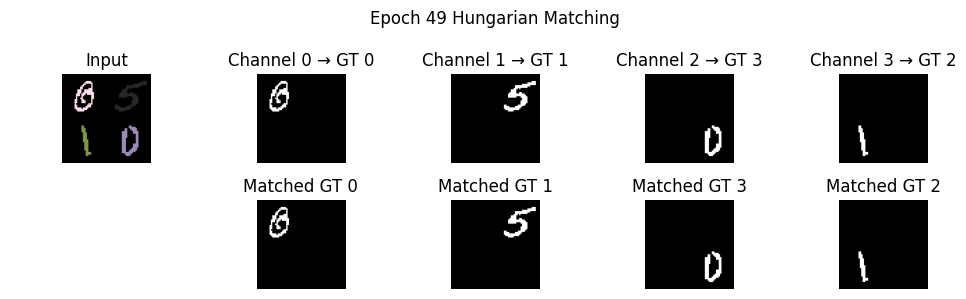

Model saved at epoch 49 with test loss: 0.0043
Epoch 49 | Train Loss: 0.0042 | Test Loss: 0.0043


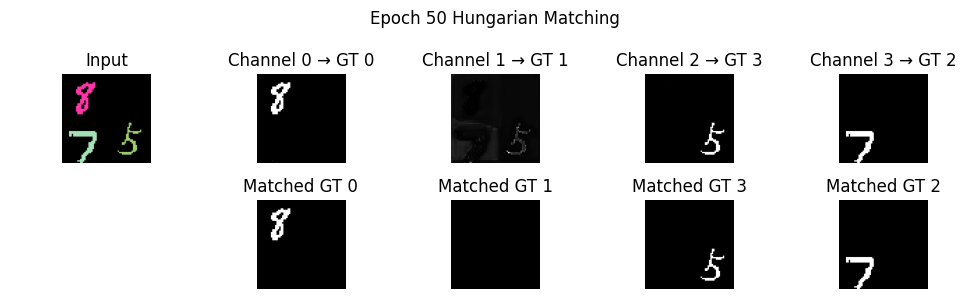

Model saved at epoch 50 with test loss: 0.0041
Epoch 50 | Train Loss: 0.0040 | Test Loss: 0.0041


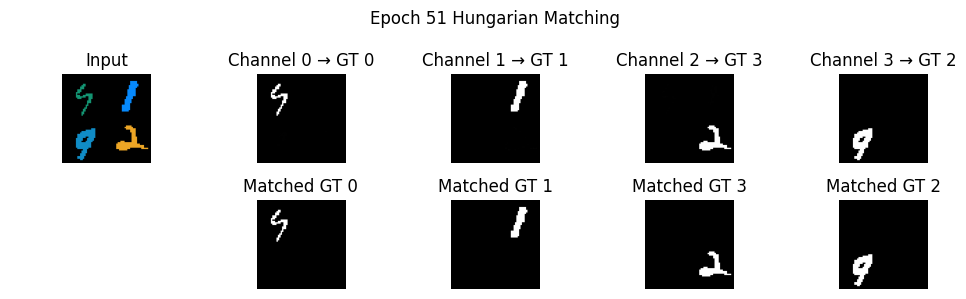

Model saved at epoch 51 with test loss: 0.0039
Epoch 51 | Train Loss: 0.0038 | Test Loss: 0.0039


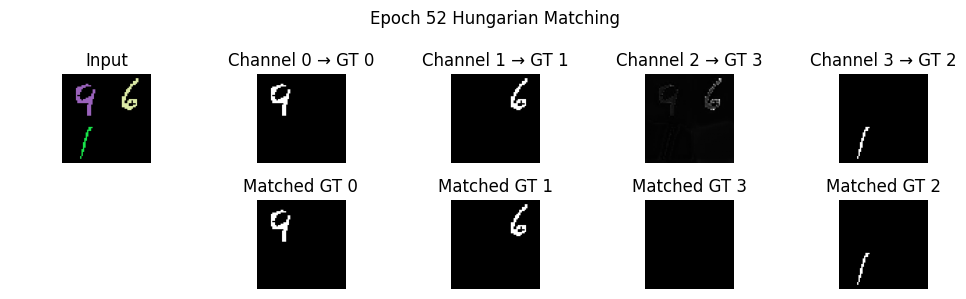

Model saved at epoch 52 with test loss: 0.0037
Epoch 52 | Train Loss: 0.0036 | Test Loss: 0.0037


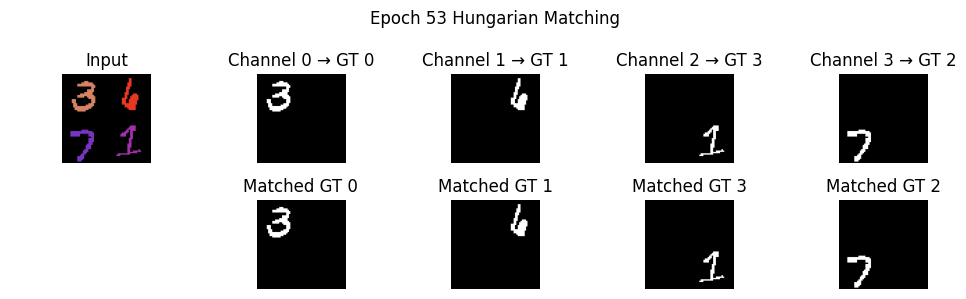

Model saved at epoch 53 with test loss: 0.0036
Epoch 53 | Train Loss: 0.0035 | Test Loss: 0.0036


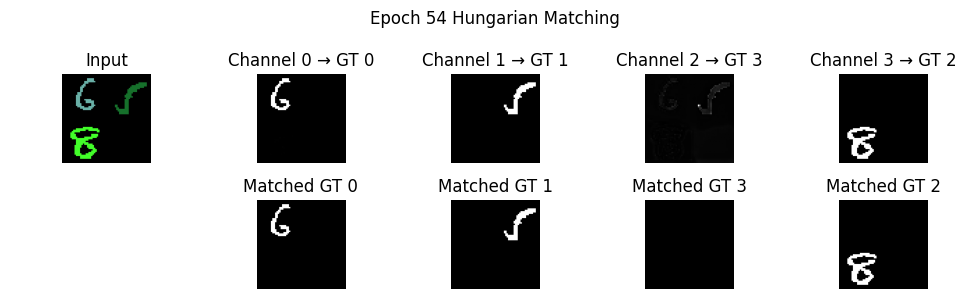

Model saved at epoch 54 with test loss: 0.0034
Epoch 54 | Train Loss: 0.0033 | Test Loss: 0.0034


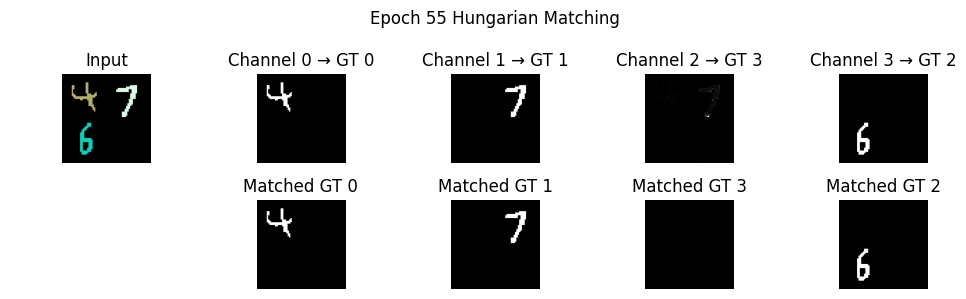

Model saved at epoch 55 with test loss: 0.0033
Epoch 55 | Train Loss: 0.0032 | Test Loss: 0.0033


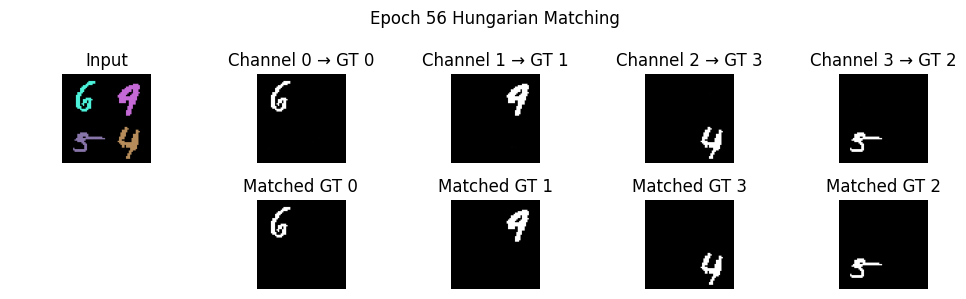

Model saved at epoch 56 with test loss: 0.0031
Epoch 56 | Train Loss: 0.0030 | Test Loss: 0.0031


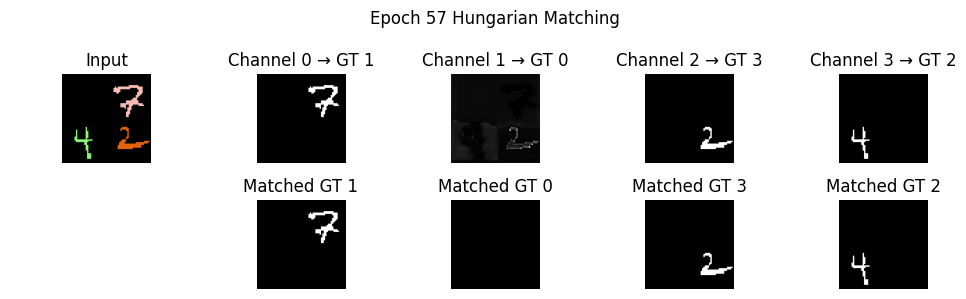

Model saved at epoch 57 with test loss: 0.0031
Epoch 57 | Train Loss: 0.0029 | Test Loss: 0.0031


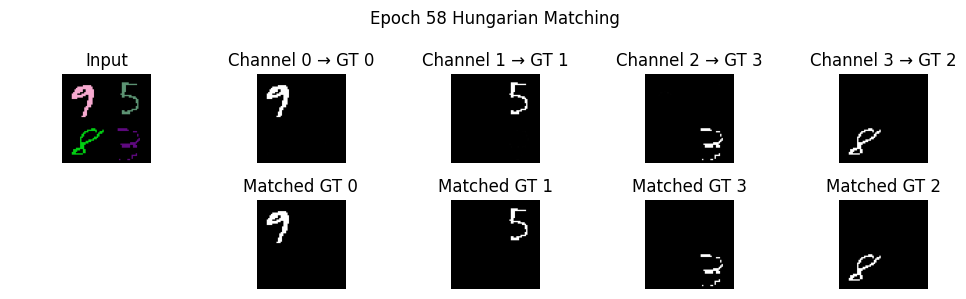

Model saved at epoch 58 with test loss: 0.0029
Epoch 58 | Train Loss: 0.0028 | Test Loss: 0.0029


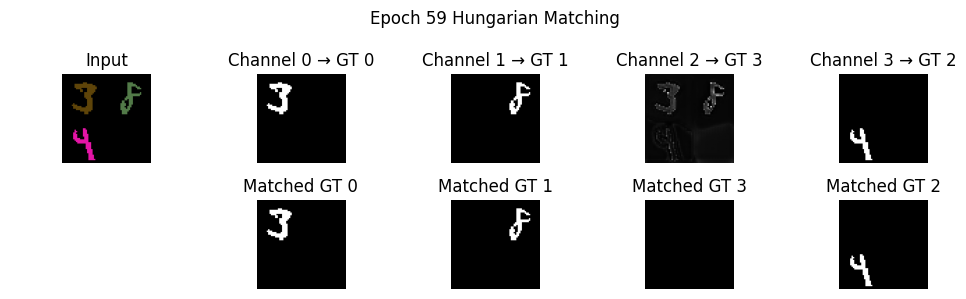

Model saved at epoch 59 with test loss: 0.0028
Epoch 59 | Train Loss: 0.0027 | Test Loss: 0.0028


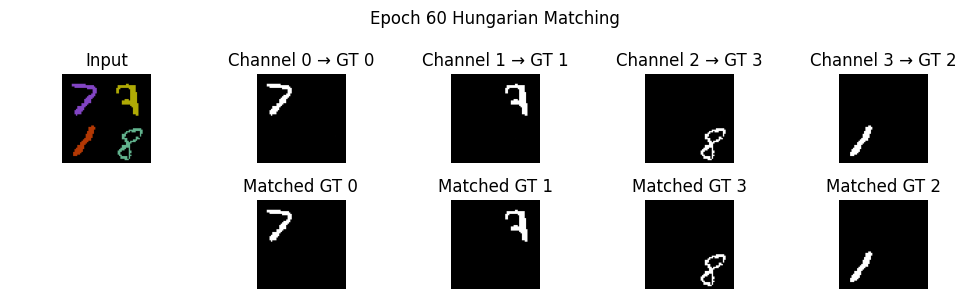

Model saved at epoch 60 with test loss: 0.0027
Epoch 60 | Train Loss: 0.0026 | Test Loss: 0.0027


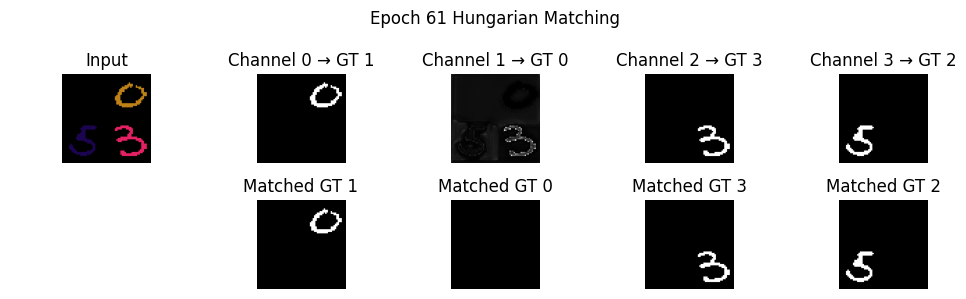

Model saved at epoch 61 with test loss: 0.0026
Epoch 61 | Train Loss: 0.0025 | Test Loss: 0.0026


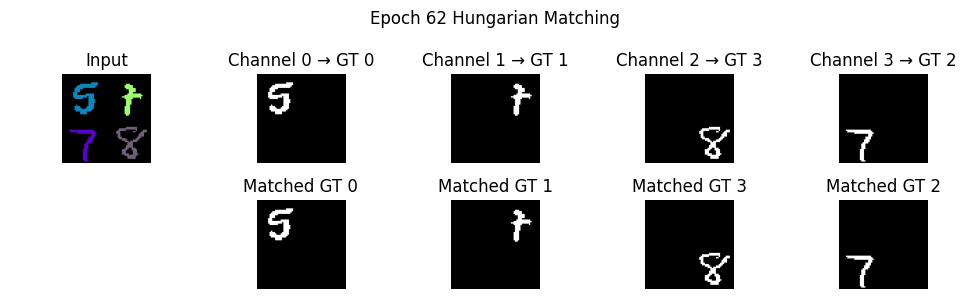

Model saved at epoch 62 with test loss: 0.0025
Epoch 62 | Train Loss: 0.0024 | Test Loss: 0.0025


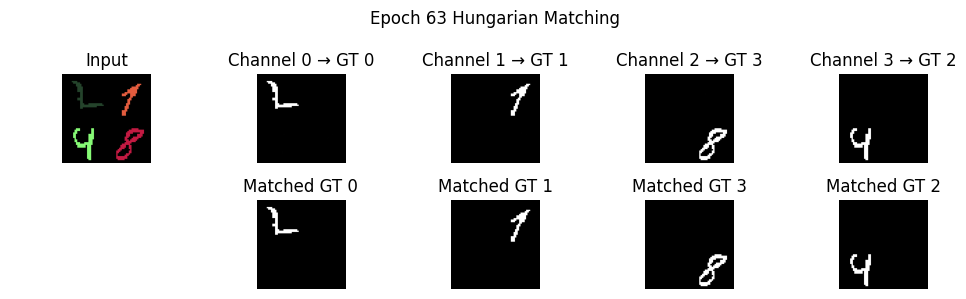

Model saved at epoch 63 with test loss: 0.0024
Epoch 63 | Train Loss: 0.0023 | Test Loss: 0.0024


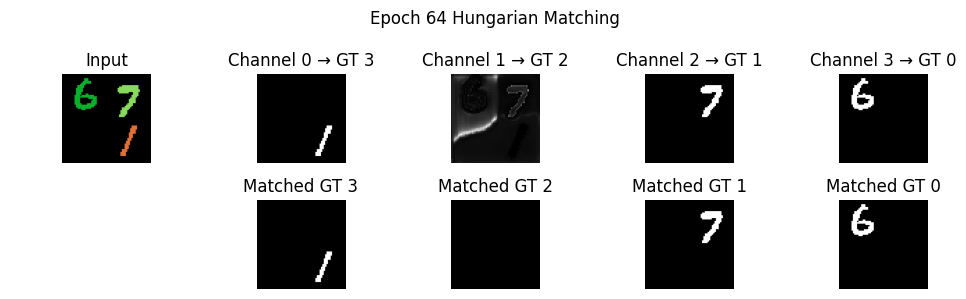

Model saved at epoch 64 with test loss: 0.0023
Epoch 64 | Train Loss: 0.0022 | Test Loss: 0.0023


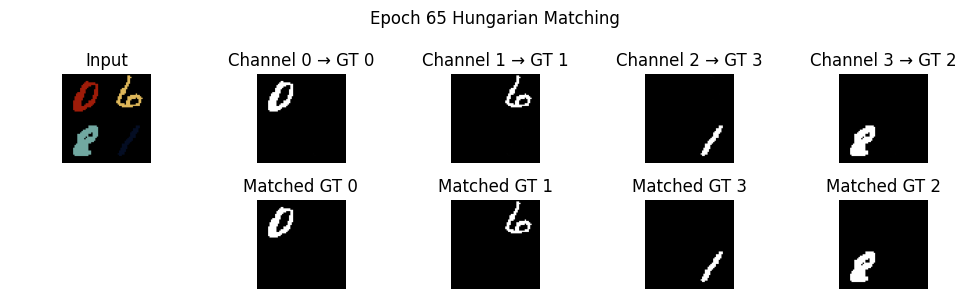

Model saved at epoch 65 with test loss: 0.0023
Epoch 65 | Train Loss: 0.0021 | Test Loss: 0.0023


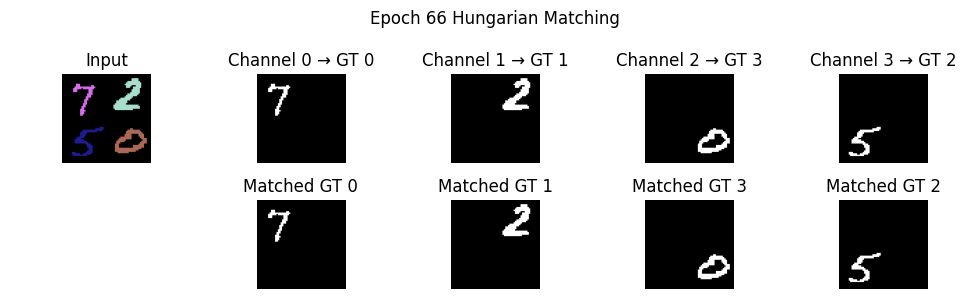

Model saved at epoch 66 with test loss: 0.0022
Epoch 66 | Train Loss: 0.0021 | Test Loss: 0.0022


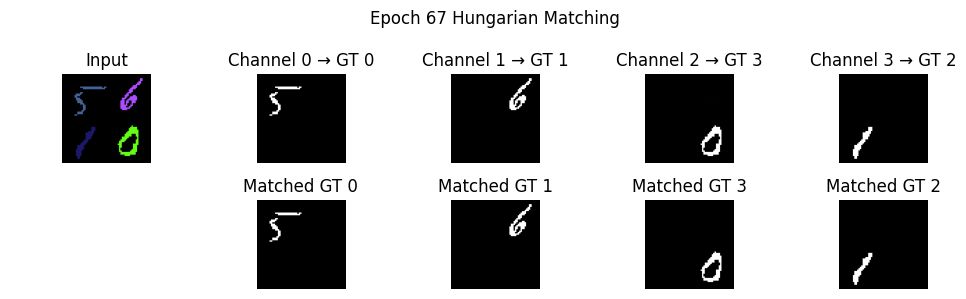

Model saved at epoch 67 with test loss: 0.0021
Epoch 67 | Train Loss: 0.0020 | Test Loss: 0.0021


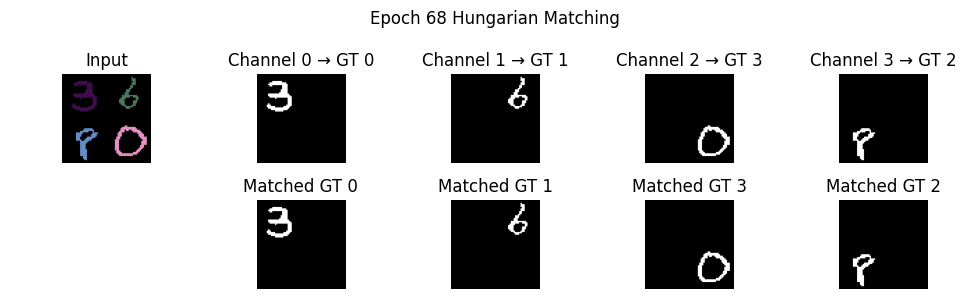

Model saved at epoch 68 with test loss: 0.0020
Epoch 68 | Train Loss: 0.0019 | Test Loss: 0.0020


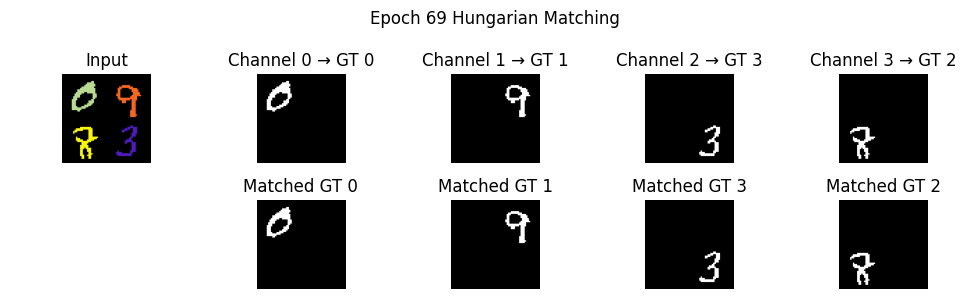

Model saved at epoch 69 with test loss: 0.0020
Epoch 69 | Train Loss: 0.0019 | Test Loss: 0.0020


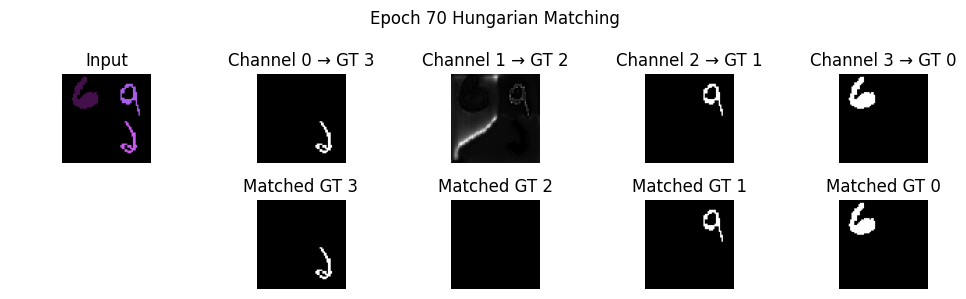

Model saved at epoch 70 with test loss: 0.0019
Epoch 70 | Train Loss: 0.0018 | Test Loss: 0.0019


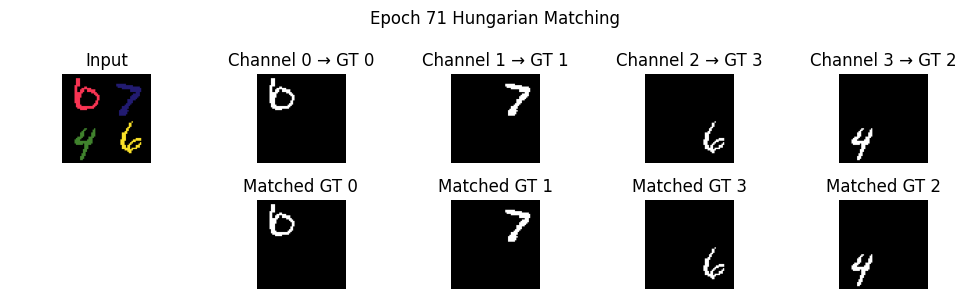

Model saved at epoch 71 with test loss: 0.0018
Epoch 71 | Train Loss: 0.0018 | Test Loss: 0.0018


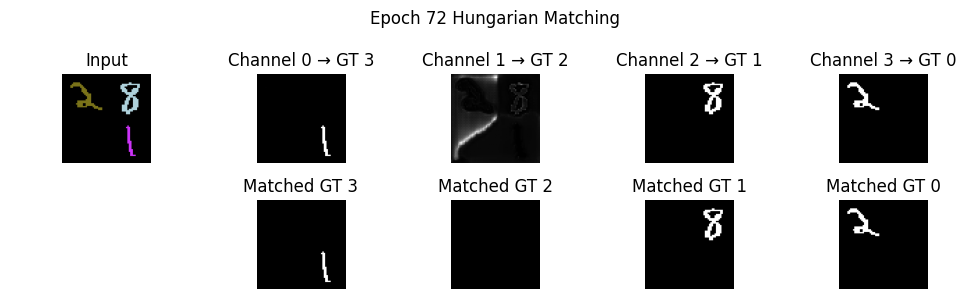

Model saved at epoch 72 with test loss: 0.0018
Epoch 72 | Train Loss: 0.0017 | Test Loss: 0.0018


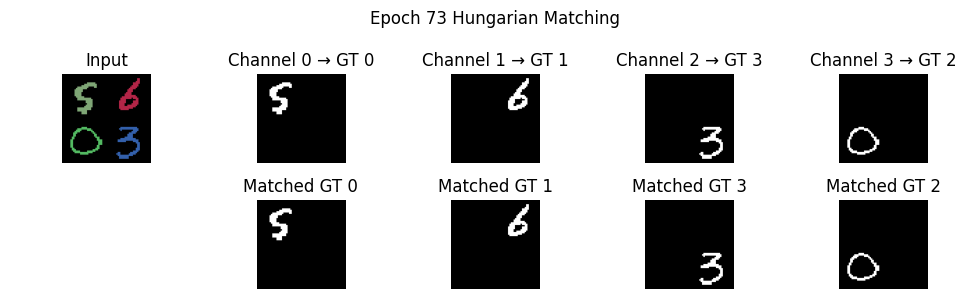

Model saved at epoch 73 with test loss: 0.0017
Epoch 73 | Train Loss: 0.0016 | Test Loss: 0.0017


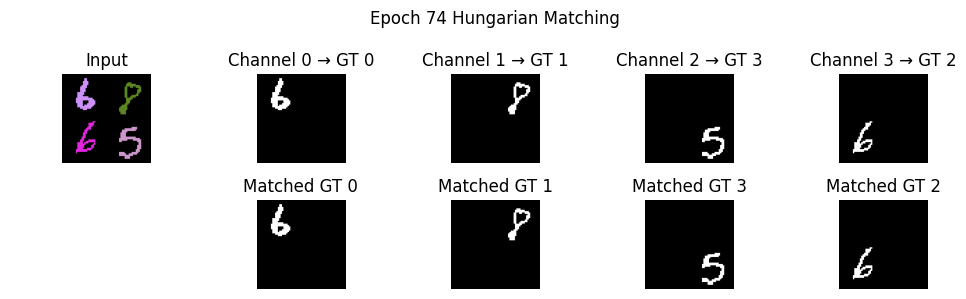

Model saved at epoch 74 with test loss: 0.0017
Epoch 74 | Train Loss: 0.0016 | Test Loss: 0.0017


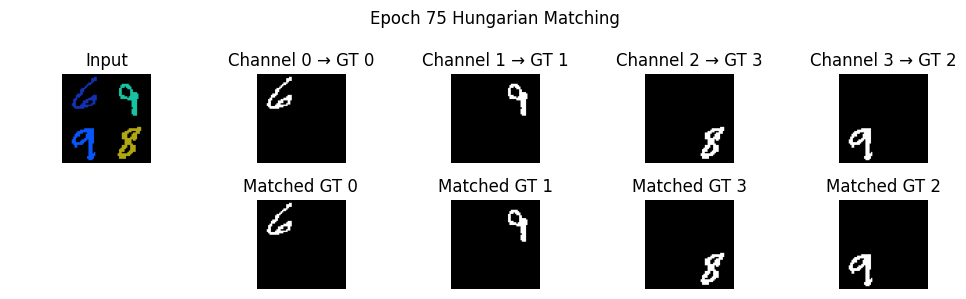

Model saved at epoch 75 with test loss: 0.0016
Epoch 75 | Train Loss: 0.0016 | Test Loss: 0.0016


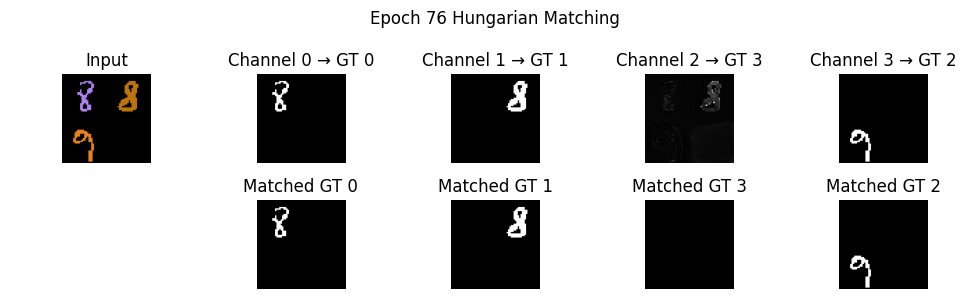

Model saved at epoch 76 with test loss: 0.0016
Epoch 76 | Train Loss: 0.0015 | Test Loss: 0.0016


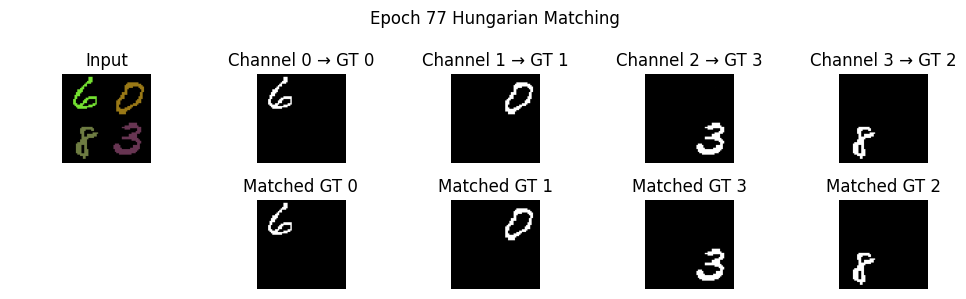

Model saved at epoch 77 with test loss: 0.0016
Epoch 77 | Train Loss: 0.0015 | Test Loss: 0.0016


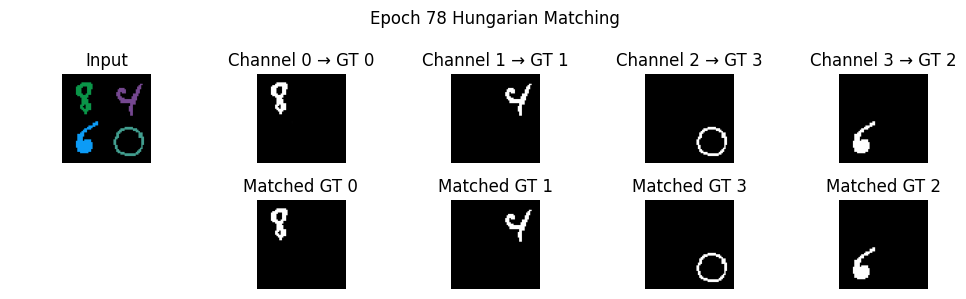

Model saved at epoch 78 with test loss: 0.0015
Epoch 78 | Train Loss: 0.0014 | Test Loss: 0.0015


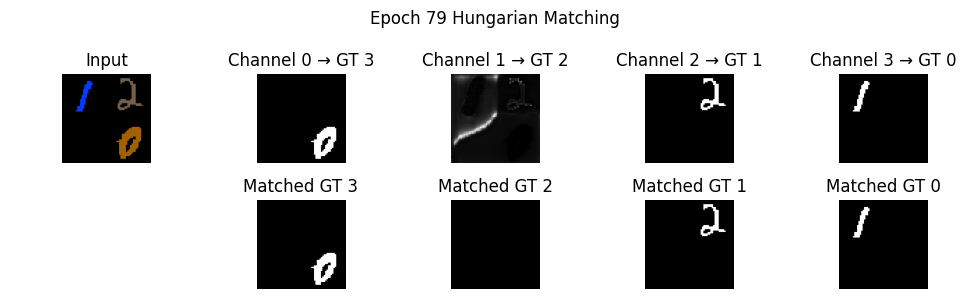

Model saved at epoch 79 with test loss: 0.0015
Epoch 79 | Train Loss: 0.0014 | Test Loss: 0.0015


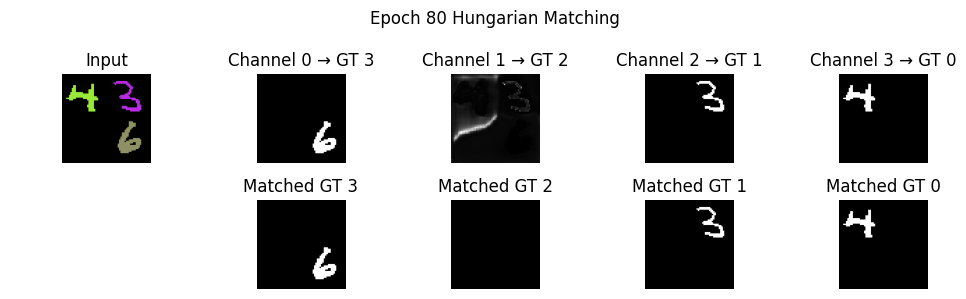

Model saved at epoch 80 with test loss: 0.0014
Epoch 80 | Train Loss: 0.0013 | Test Loss: 0.0014


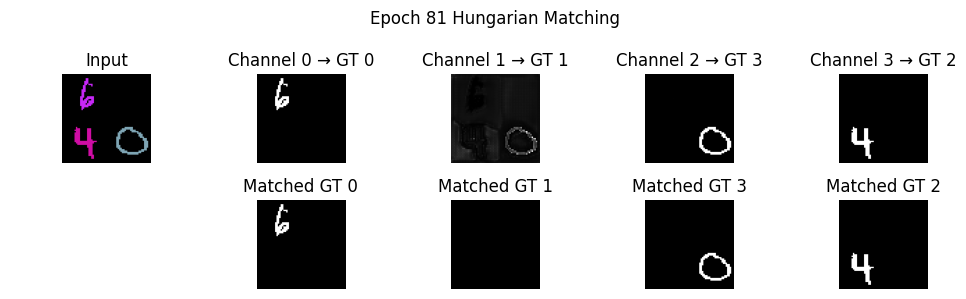

Model saved at epoch 81 with test loss: 0.0014
Epoch 81 | Train Loss: 0.0013 | Test Loss: 0.0014


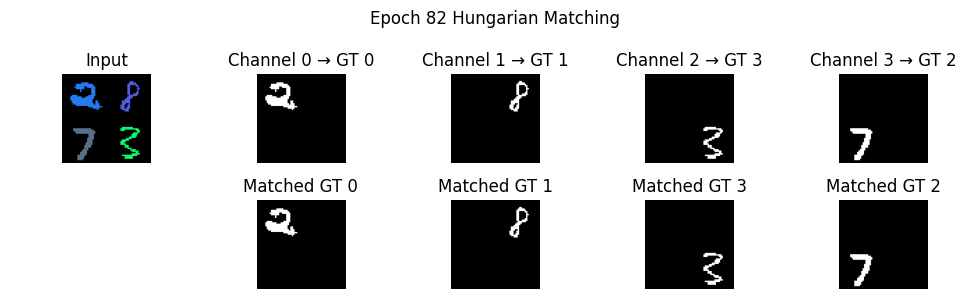

Model saved at epoch 82 with test loss: 0.0013
Epoch 82 | Train Loss: 0.0013 | Test Loss: 0.0013


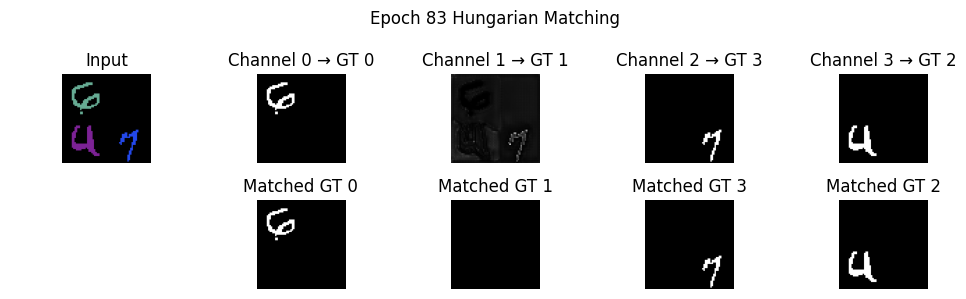

Model saved at epoch 83 with test loss: 0.0013
Epoch 83 | Train Loss: 0.0012 | Test Loss: 0.0013


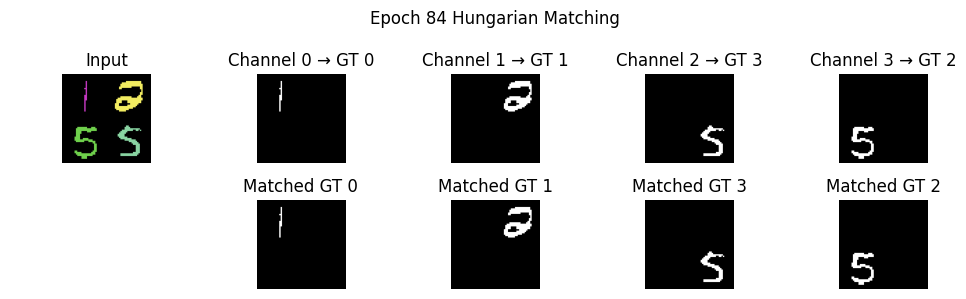

Model saved at epoch 84 with test loss: 0.0013
Epoch 84 | Train Loss: 0.0012 | Test Loss: 0.0013


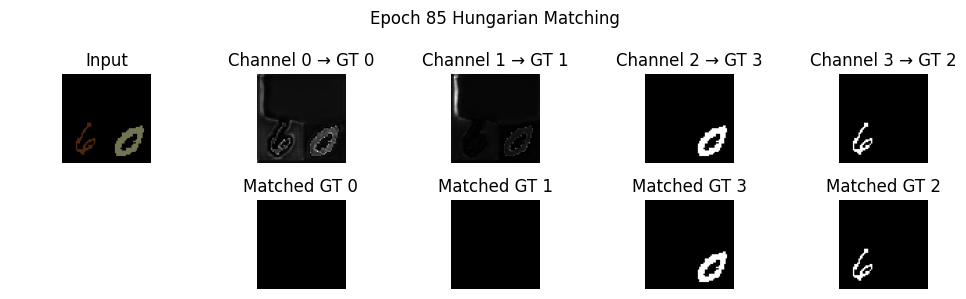

Model saved at epoch 85 with test loss: 0.0012
Epoch 85 | Train Loss: 0.0012 | Test Loss: 0.0012


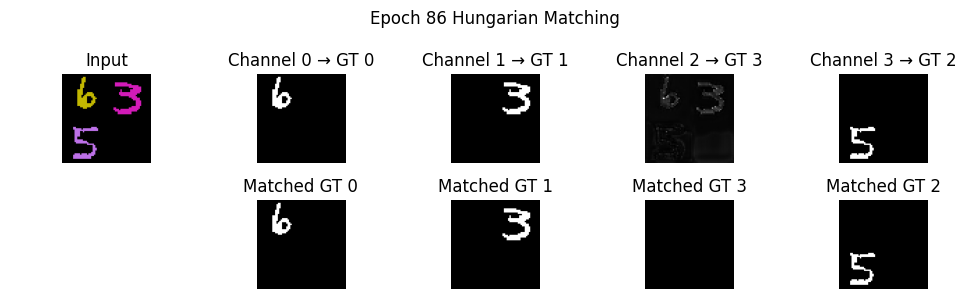

Epoch 86 | Train Loss: 0.0012 | Test Loss: 0.0013


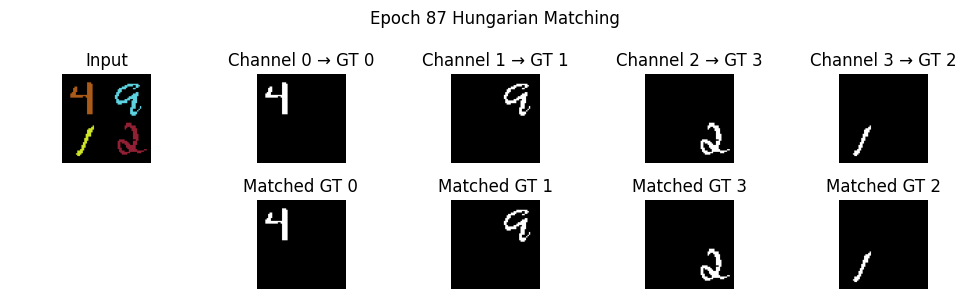

Model saved at epoch 87 with test loss: 0.0012
Epoch 87 | Train Loss: 0.0011 | Test Loss: 0.0012


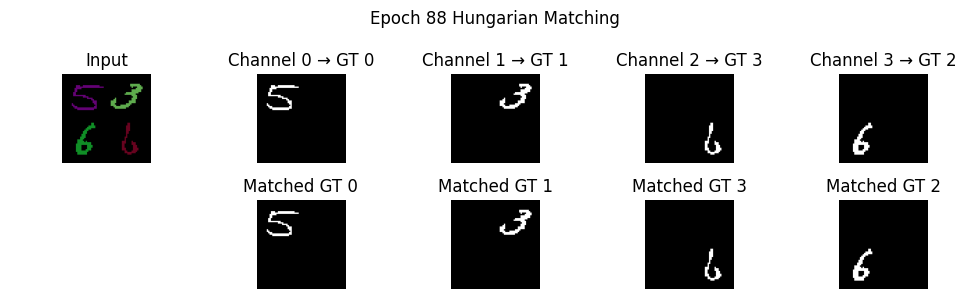

Epoch 88 | Train Loss: 0.0011 | Test Loss: 0.0012


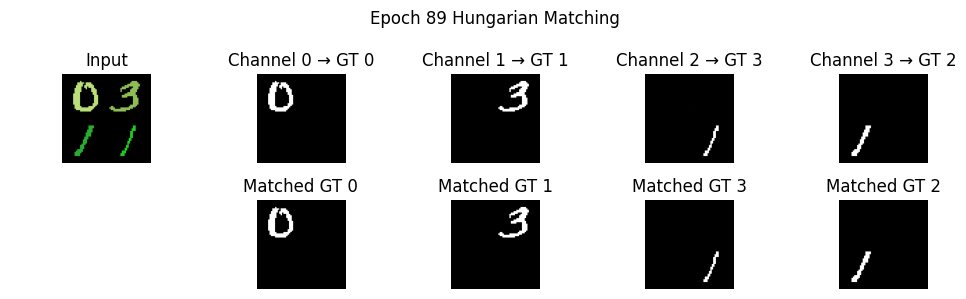

Model saved at epoch 89 with test loss: 0.0011
Epoch 89 | Train Loss: 0.0011 | Test Loss: 0.0011


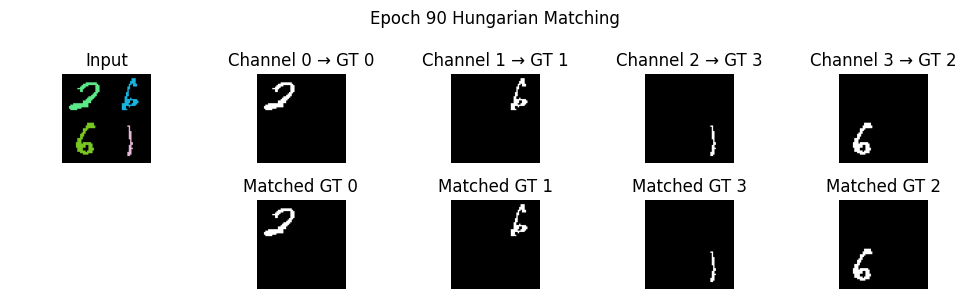

Model saved at epoch 90 with test loss: 0.0011
Epoch 90 | Train Loss: 0.0010 | Test Loss: 0.0011


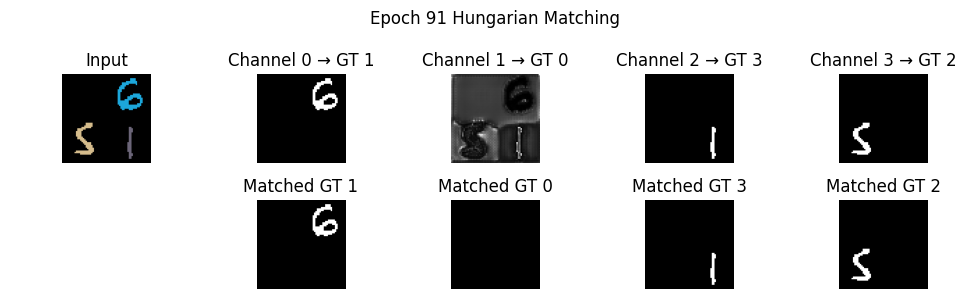

Model saved at epoch 91 with test loss: 0.0011
Epoch 91 | Train Loss: 0.0010 | Test Loss: 0.0011


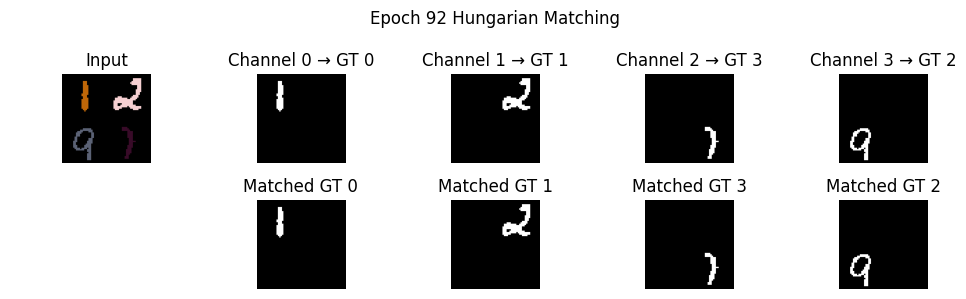

Model saved at epoch 92 with test loss: 0.0011
Epoch 92 | Train Loss: 0.0010 | Test Loss: 0.0011


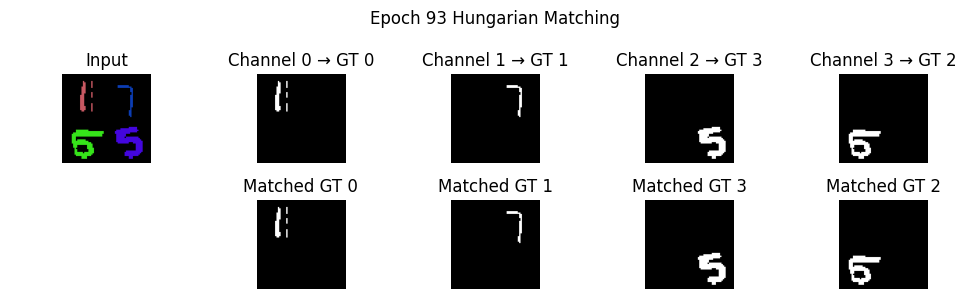

Model saved at epoch 93 with test loss: 0.0010
Epoch 93 | Train Loss: 0.0010 | Test Loss: 0.0010


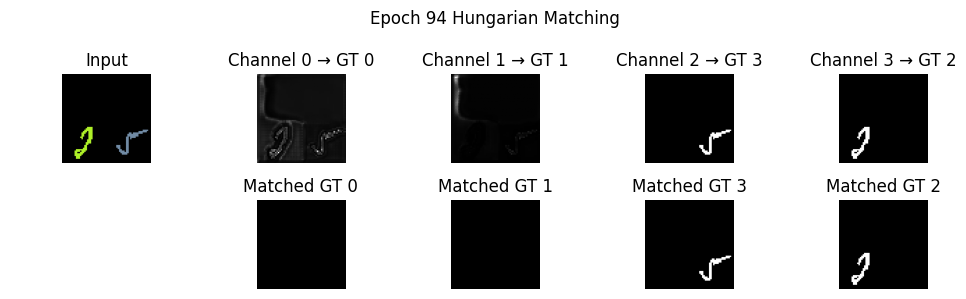

Model saved at epoch 94 with test loss: 0.0010
Epoch 94 | Train Loss: 0.0009 | Test Loss: 0.0010


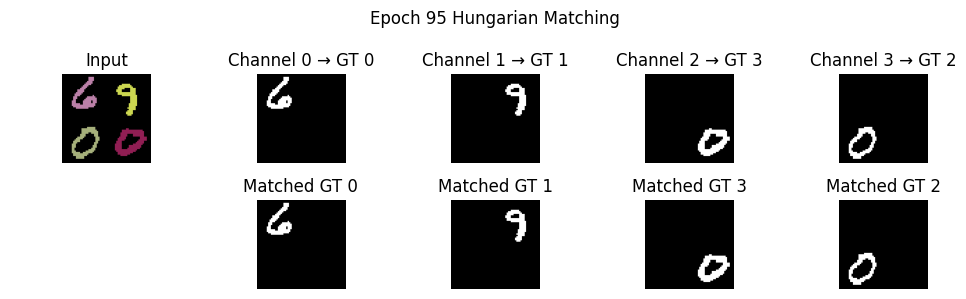

Model saved at epoch 95 with test loss: 0.0010
Epoch 95 | Train Loss: 0.0009 | Test Loss: 0.0010


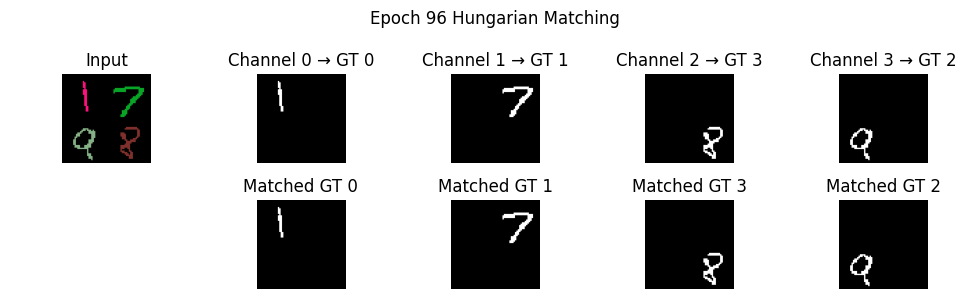

Model saved at epoch 96 with test loss: 0.0010
Epoch 96 | Train Loss: 0.0009 | Test Loss: 0.0010


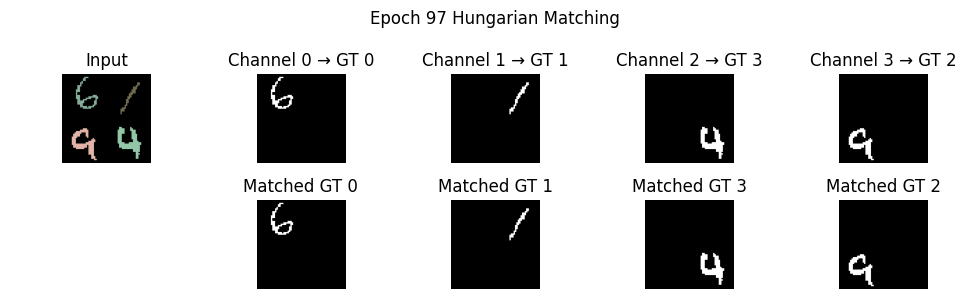

Model saved at epoch 97 with test loss: 0.0010
Epoch 97 | Train Loss: 0.0009 | Test Loss: 0.0010


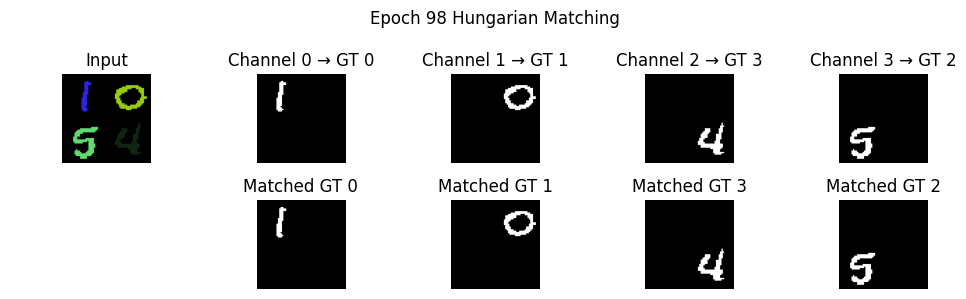

Model saved at epoch 98 with test loss: 0.0009
Epoch 98 | Train Loss: 0.0009 | Test Loss: 0.0009


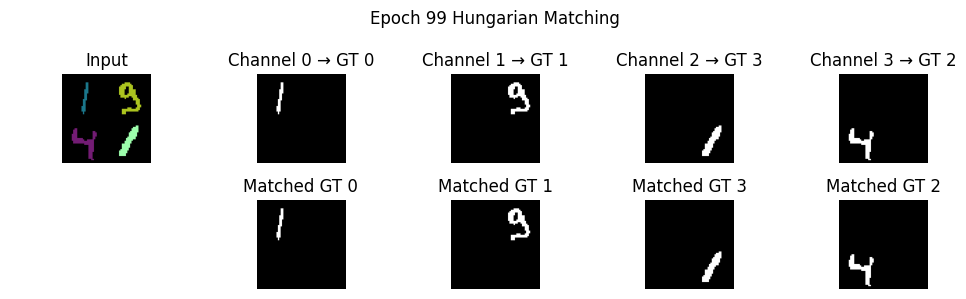

Epoch 99 | Train Loss: 0.0008 | Test Loss: 0.0009


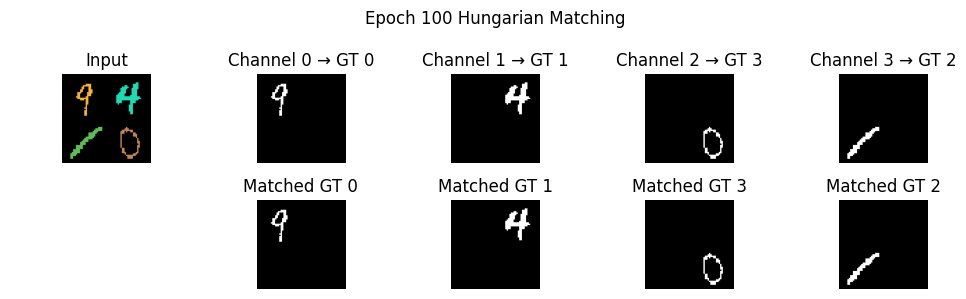

Model saved at epoch 100 with test loss: 0.0009
Epoch 100 | Train Loss: 0.0008 | Test Loss: 0.0009


In [151]:
'''
    TODO : 학습 루프 정의
'''
batch_size = 64
epochs = 100
lr = 0.003
device = 'mps'

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

seg_model = UNetLight(in_channels=3, out_channels=4).to(device)
optimizer = torch.optim.Adam(seg_model.parameters(), lr=lr)
criterion = nn.BCELoss()
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

train_loss_list = []
test_loss_list = []
best_test_loss = float('inf')  # 초기값을 매우 큰 값으로 설정

for epoch in range(epochs):
    seg_model.train()
    total_train_loss = 0

    for batch_idx, (img, masks, labels) in enumerate(train_loader):
        img, masks, labels = img.to(device), masks.to(device), labels.to(device)
        pred = seg_model(img)  # (B, 4, 1, 64, 64)

        loss = 0
        for b in range(img.size(0)):
            cost_matrix = torch.zeros(4, 4)
            for i in range(4):
                for j in range(4):
                    if labels[b, j] == -1:
                        cost_matrix[i, j] = 1.0  # worst IoU
                    else:
                        iou = compute_iou(pred[b, i], masks[b, j])
                        cost_matrix[i, j] = 1 - iou  # IoU를 최소화 비용으로

            row_idx, col_idx = linear_sum_assignment(cost_matrix.detach().cpu().numpy())
            for i, j in zip(row_idx, col_idx):
                if labels[b, j] != -1:
                    loss += criterion(pred[b, i], masks[b, j])
        
        loss = loss / img.size(0)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

        if batch_idx == 0:
            seg_model.eval()
            with torch.no_grad():
                visualize_decoder_outputs_with_matching(img[0], pred[0], masks[0], labels[0], epoch+1)
            seg_model.train()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_list.append(avg_train_loss)

    # ====== 테스트 ======
    seg_model.eval()
    total_test_loss = 0

    with torch.no_grad():
        for img, masks, labels in test_loader:
            img, masks, labels = img.to(device), masks.to(device), labels.to(device)
            pred = seg_model(img)

            loss = 0
            for b in range(img.size(0)):
                cost_matrix = torch.zeros(4, 4)
                for i in range(4):
                    for j in range(4):
                        if labels[b, j] == -1:
                            cost_matrix[i, j] = 1.0
                        else:
                            iou = compute_iou(pred[b, i], masks[b, j])
                            cost_matrix[i, j] = 1 - iou

                row_idx, col_idx = linear_sum_assignment(cost_matrix.detach().cpu().numpy())
                for i, j in zip(row_idx, col_idx):
                    if labels[b, j] != -1:
                        loss += criterion(pred[b, i], masks[b, j])

            loss = loss / img.size(0)
            total_test_loss += loss.item()

    avg_test_loss = total_test_loss / len(test_loader)
    test_loss_list.append(avg_test_loss)
    if avg_test_loss < best_test_loss:
        best_test_loss = avg_test_loss
        torch.save(seg_model.state_dict(), 'best_Unet_seg_model.pth')
        print(f"Model saved at epoch {epoch+1} with test loss: {avg_test_loss:.4f}")
        
    scheduler.step(avg_test_loss)

    print(f"Epoch {epoch+1} | Train Loss: {avg_train_loss:.4f} | Test Loss: {avg_test_loss:.4f}")

Min Train Loss: 0.0008 at epoch 99
Min Test Loss: 0.0009 at epoch 99


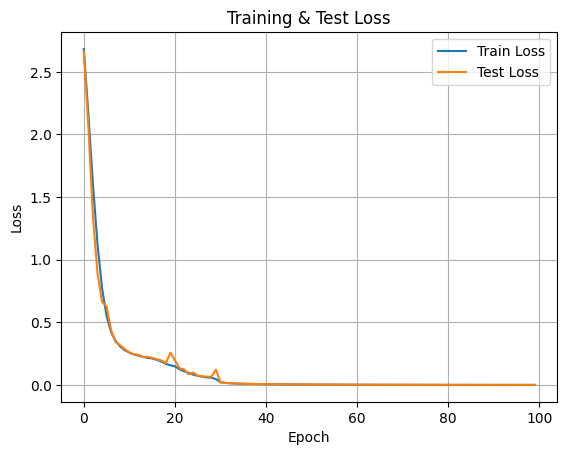

In [152]:
'''
    TODO : loss 시각화
'''
min_train_loss = min(train_loss_list)
min_train_epoch = train_loss_list.index(min_train_loss)

min_test_loss = min(test_loss_list)
min_test_epoch = test_loss_list.index(min_test_loss)

print(f"Min Train Loss: {min_train_loss:.4f} at epoch {min_train_epoch}")
print(f"Min Test Loss: {min_test_loss:.4f} at epoch {min_test_epoch}")

visualize_loss_curves(train_loss_list, test_loss_list) 

### 분류

### Classification

In [109]:
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.heads = nn.ModuleList([
            nn.Sequential(
                # --- Convolutional Feature Extractor ---
                nn.Conv2d(1, 16, kernel_size=3, padding=1),   # (1,64,64) → (16,64,64)
                nn.BatchNorm2d(16),
                nn.ReLU(),
                nn.MaxPool2d(2),                              # (16,32,32)

                nn.Conv2d(16, 32, kernel_size=3, padding=1),
                nn.BatchNorm2d(32),
                nn.ReLU(),
                nn.MaxPool2d(2),                              # (32,16,16)

                nn.Conv2d(32, 64, kernel_size=3, padding=1),
                nn.BatchNorm2d(64),
                nn.ReLU(),
                nn.AdaptiveAvgPool2d((4, 4)),                 # (64,4,4)

                nn.Flatten(),  # → 64×4×4 = 1024

                # --- MLP Classifier ---
                nn.Linear(1024, 256),
                nn.BatchNorm1d(256),
                nn.ReLU(),
                nn.Dropout(0.1),

                nn.Linear(256, 64),
                nn.BatchNorm1d(64),
                nn.ReLU(),
                nn.Dropout(0.1),

                nn.Linear(64, 11)  # 0~9 + N
            )
            for _ in range(4)
        ])

    def forward(self, masks):  # (B, 4, 64, 64)
        outputs = []
        for i in range(4):
            x = masks[:, i].unsqueeze(1)  # (B, 1, 64, 64)
            out = self.heads[i](x)
            outputs.append(out)
        return torch.stack(outputs, dim=1)  # (B, 4, 11)


In [110]:
'''
    TODO : 시각화 및 Hungarian Matching 함수 정의
'''
def visualize_matching(img, pred_masks, gt_masks, orig_labels, reordered_labels, mapping, epoch, idx):
    _, axs = plt.subplots(2, 5, figsize=(10, 3))
    axs[0, 0].imshow(img.permute(1, 2, 0).cpu())
    axs[0, 0].set_title("Original Image")
    axs[0, 0].axis('off')
    for i in range(4):
        axs[0, i+1].imshow(pred_masks[i].cpu(), cmap='gray')
        gt_j = mapping.get(i, None)
        axs[0, i+1].set_title(f"Decoder {i} → GT {gt_j}")
        axs[0, i+1].axis('off')
    for j in range(4):
        axs[1, j+1].imshow(gt_masks[j].cpu(), cmap='gray')
        axs[1, j+1].set_title(f"GT {j}: Label {orig_labels[j].item()}")
        axs[1, j+1].axis('off')
    axs[1, 0].text(0.1, 0.5, f"Reordered labels:\n{[reordered_labels[i].item() for i in range(4)]}",
                  fontsize=12)
    axs[1, 0].axis('off')
    plt.suptitle(f"[Epoch {epoch}] Sample {idx} - Decoder ↔ GT Matching")
    plt.tight_layout()
    plt.show()
    
# ----- Hungarian Matching -----
def get_reordered_labels(pred_masks, gt_masks, labels, device, verbose=False, img=None, epoch=None, img_idx=None, shown_flag=None):
    B = pred_masks.size(0) # batch_size
    reordered_labels = torch.full_like(labels, 10) # reordered_labels: (B, 4)짜리 텐서 생성, 초기값은 모두 10(None)
    for b in range(B):
        cost_matrix = torch.zeros(4, 4, device=device)
        for i in range(4):
            for j in range(4):
                if labels[b, j] == -1:
                    cost_matrix[i, j] = 1.0
                else:
                    iou = compute_iou(pred_masks[b, i], gt_masks[b, j])
                    cost_matrix[i, j] = 1 - iou # cost가 낮을수록 좋은 매칭
        row_ind, col_ind = linear_sum_assignment(cost_matrix.detach().cpu().numpy()) # Hungarian 알고리즘을 구현한 함수
        for i, j in zip(row_ind, col_ind):
            if labels[b, j] != -1:
                reordered_labels[b, i] = labels[b, j]
                
        # 시각화: 에폭 당 1번만 출력
        if verbose and not shown_flag["shown"]:
            orig = labels[b]
            reordered = reordered_labels[b]
            if not torch.equal(orig, reordered):
                shown_flag["shown"] = True
                # print(f"[Epoch {epoch}] Sample {img_idx + b}")
                # print(f"  Original labels  : {orig.tolist()}")
                # print(f"  Reordered labels : {reordered.tolist()}")
                # print(f"  Decoder → GT map : {dict(zip(row_ind, col_ind))}")
                # visualize_matching(
                #     img[b], pred_masks[b], gt_masks[b],
                #     orig, reordered, dict(zip(row_ind, col_ind)),
                #     epoch, img_idx + b
                # )
    return reordered_labels

# ----- 틀린 경우 시각화 -----
def visualize_misclassified(img, pred_masks, predicted, true, epoch, idx):
    _, axs = plt.subplots(1, 5, figsize=(15, 3))
    axs[0].imshow(img.permute(1, 2, 0).cpu())
    axs[0].set_title('Original Image')
    for i in range(4):
        axs[i+1].imshow(pred_masks[i].cpu(), cmap='gray')
        axs[i+1].set_title(f'Dec#{i}: pred={predicted[i].item()}, true={true[i].item()}')
    plt.suptitle(f'Misclassified Sample (Epoch {epoch}, Index {idx})')
    plt.tight_layout()
    plt.show()

### AutoEncoder 기반 분류

[Epoch 1] Train Loss: 1.7842 | Test Loss: 1.3166 | Test Acc: 52.05%
[Epoch 2] Train Loss: 1.1474 | Test Loss: 0.7724 | Test Acc: 78.63%
[Epoch 3] Train Loss: 0.9210 | Test Loss: 0.5846 | Test Acc: 79.45%
[Epoch 4] Train Loss: 0.7825 | Test Loss: 0.9253 | Test Acc: 69.86%
[Epoch 5] Train Loss: 0.7231 | Test Loss: 1.5143 | Test Acc: 69.59%
[Epoch 6] Train Loss: 0.6315 | Test Loss: 0.3358 | Test Acc: 90.14%
[Epoch 7] Train Loss: 0.5711 | Test Loss: 0.4336 | Test Acc: 85.21%
[Epoch 8] Train Loss: 0.5924 | Test Loss: 0.4570 | Test Acc: 84.38%
[Epoch 9] Train Loss: 0.5705 | Test Loss: 0.4780 | Test Acc: 83.01%
[Epoch 10] Train Loss: 0.5140 | Test Loss: 0.3037 | Test Acc: 89.32%
[Epoch 11] Train Loss: 0.4899 | Test Loss: 0.2993 | Test Acc: 90.14%
[Epoch 12] Train Loss: 0.4678 | Test Loss: 0.3028 | Test Acc: 88.22%
[Epoch 13] Train Loss: 0.4038 | Test Loss: 0.2647 | Test Acc: 90.96%
[Epoch 14] Train Loss: 0.4119 | Test Loss: 0.3459 | Test Acc: 88.77%
[Epoch 15] Train Loss: 0.3973 | Test Loss: 

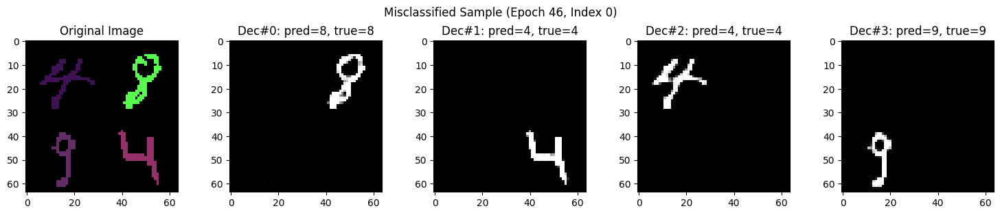

Right !!!!!!


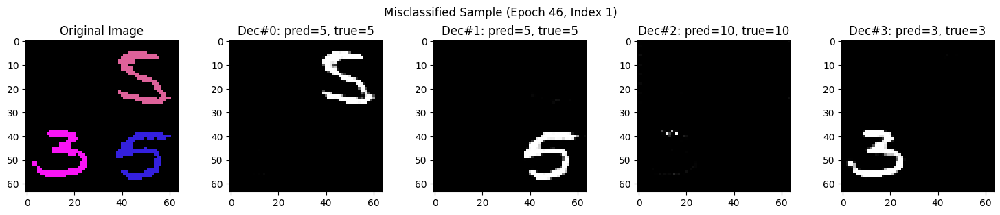

Right !!!!!!


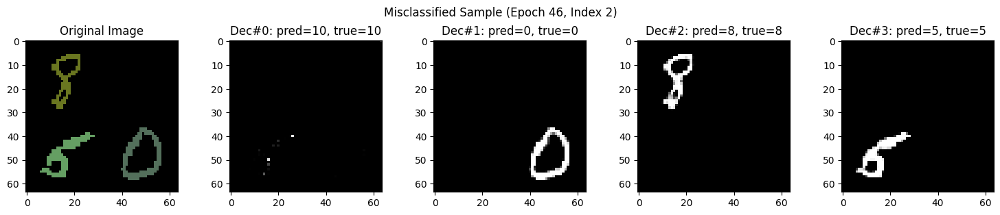

Right !!!!!!


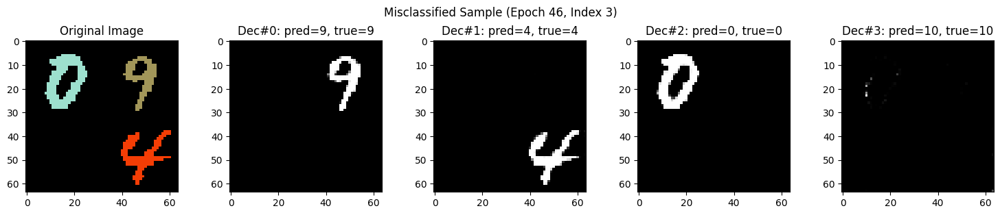

Right !!!!!!


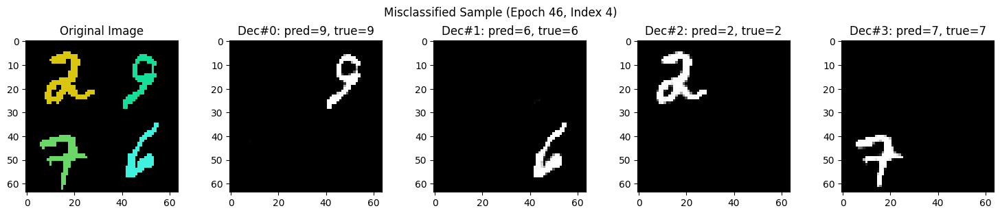

Right !!!!!!


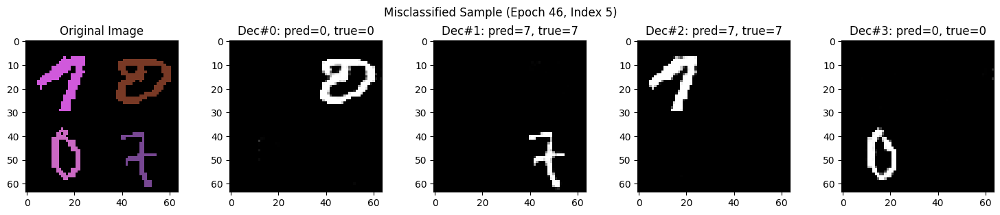

Right !!!!!!


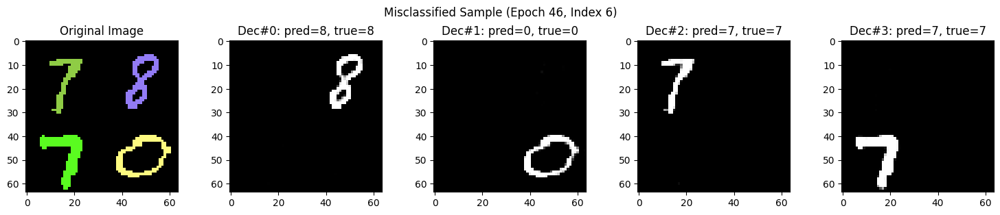

Right !!!!!!


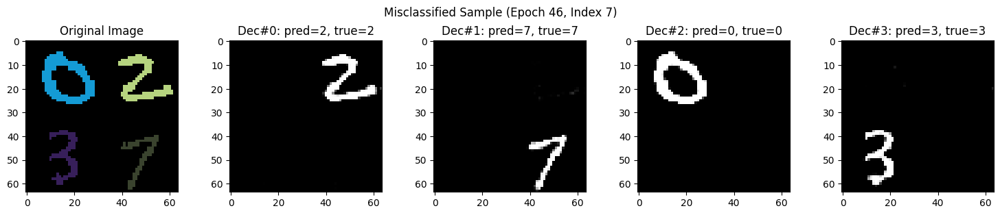

Right !!!!!!


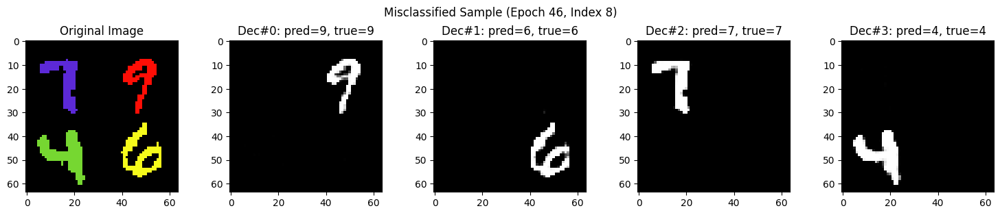

Right !!!!!!


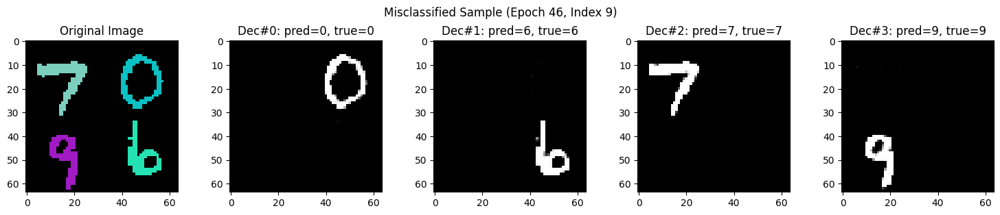

Right !!!!!!


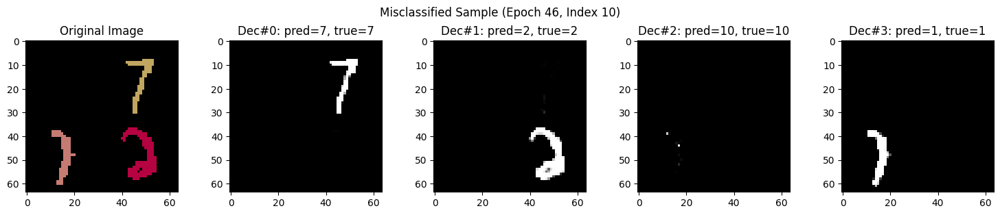

Right !!!!!!


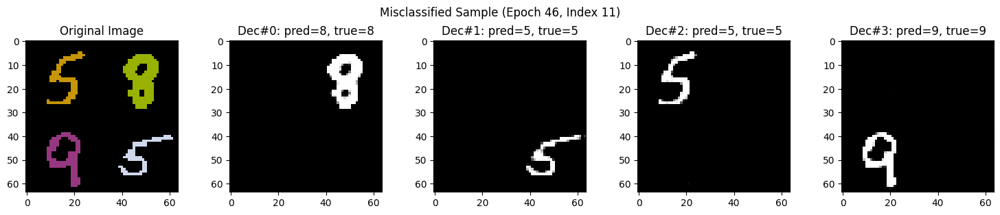

Right !!!!!!


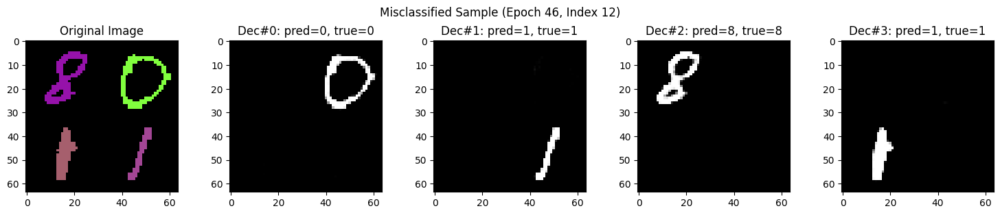

Right !!!!!!


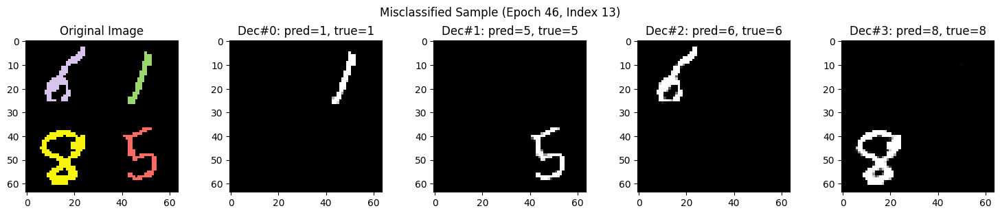

Right !!!!!!


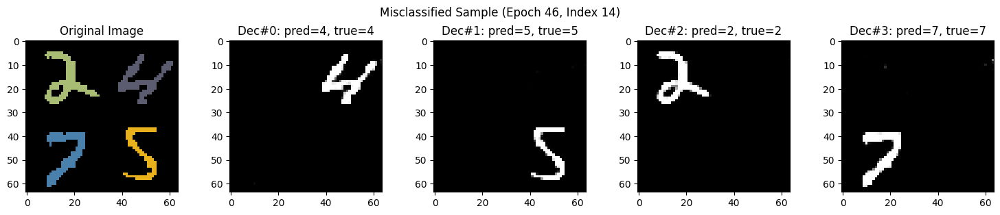

Right !!!!!!


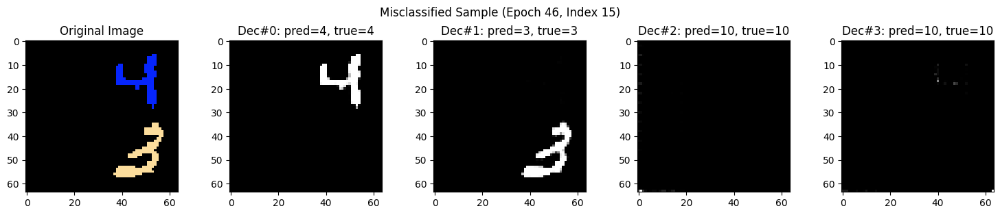

Right !!!!!!


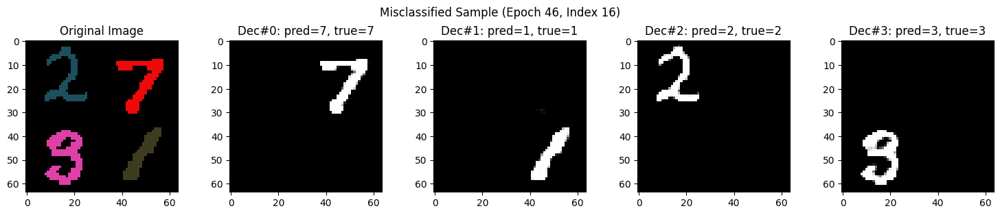

Right !!!!!!


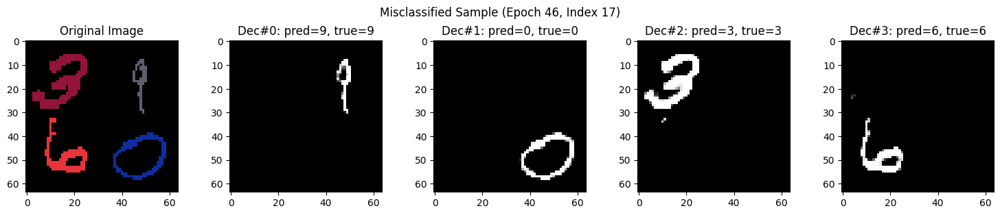

Right !!!!!!


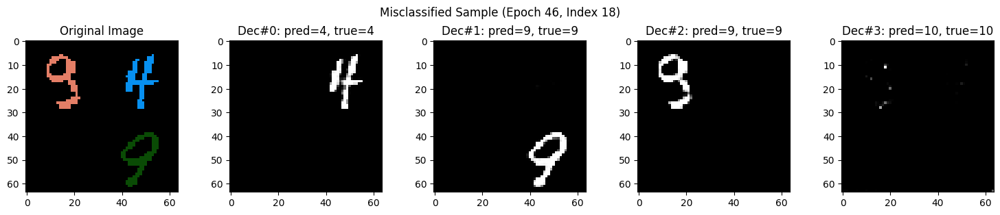

Right !!!!!!


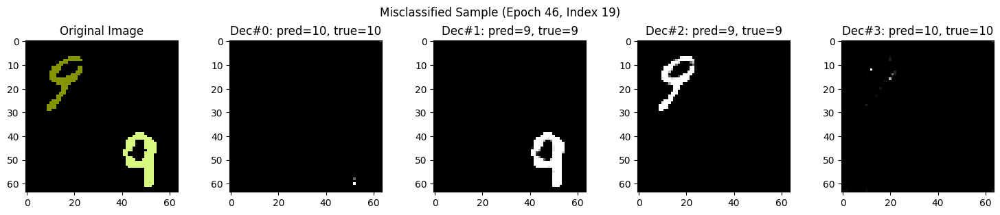

Right !!!!!!


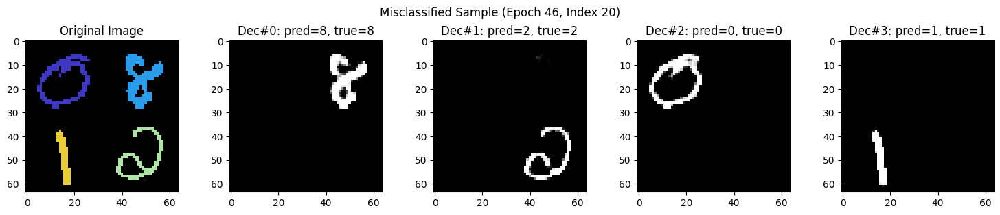

Right !!!!!!


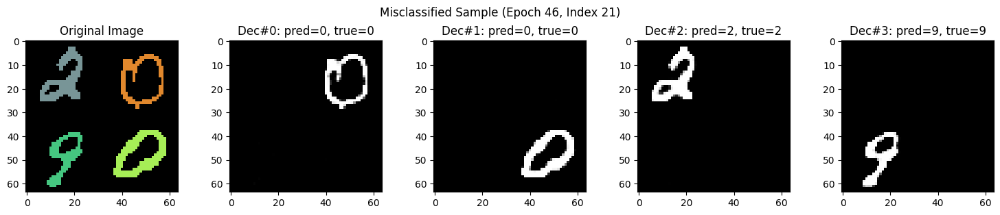

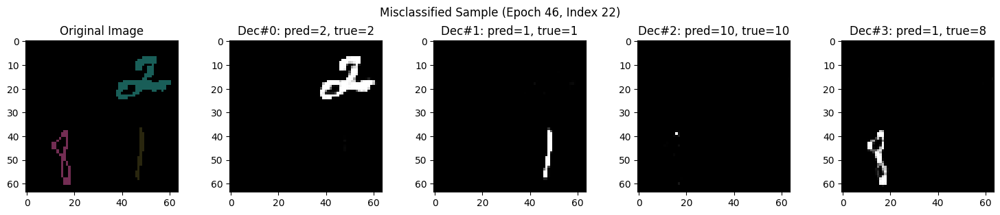

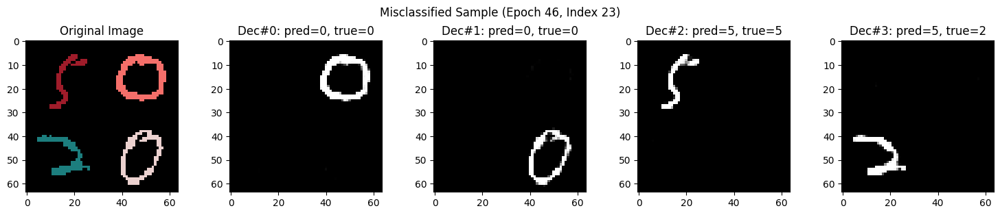

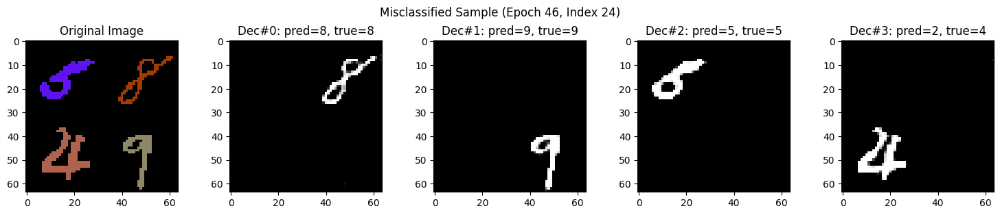

Right !!!!!!


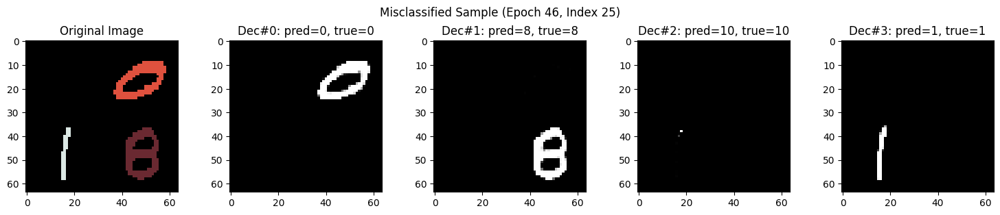

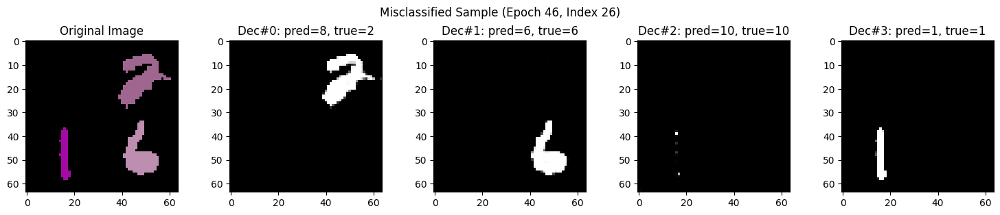

Right !!!!!!


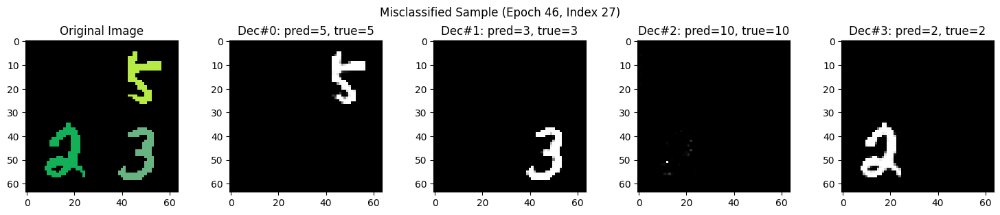

Right !!!!!!


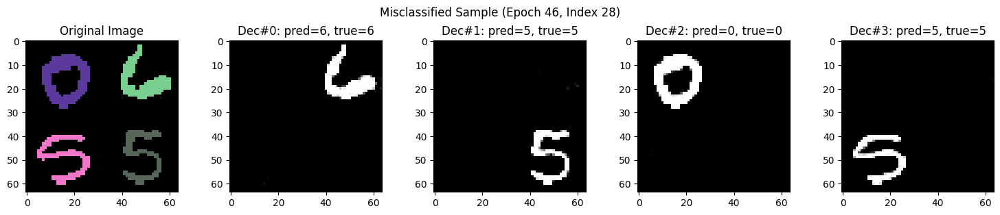

Right !!!!!!


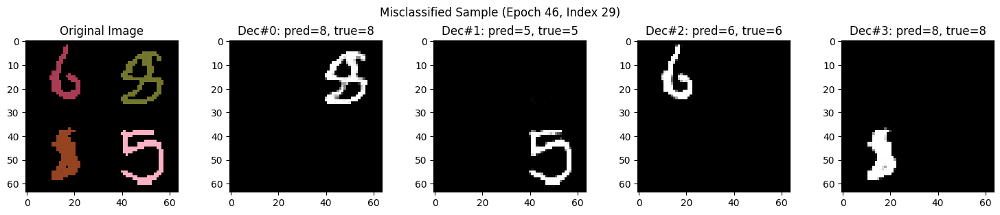

Right !!!!!!


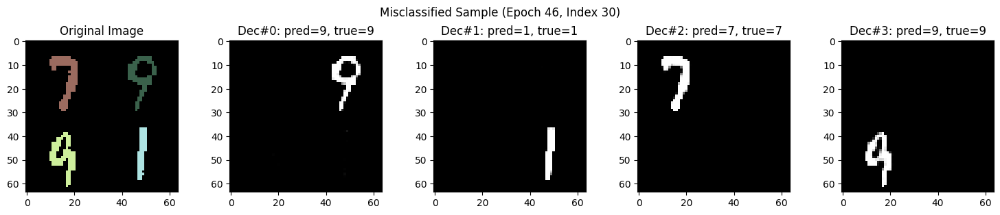

Right !!!!!!


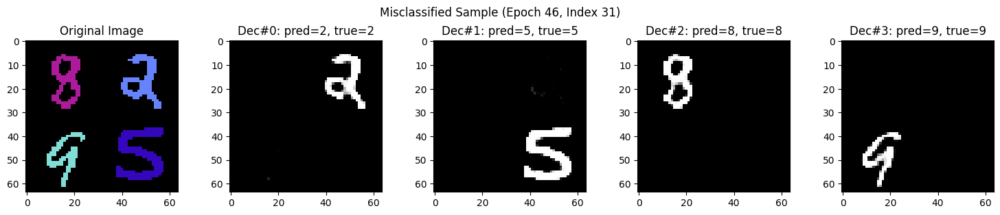

Right !!!!!!


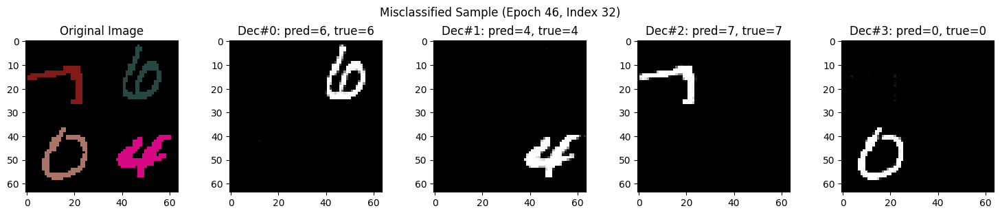

Right !!!!!!


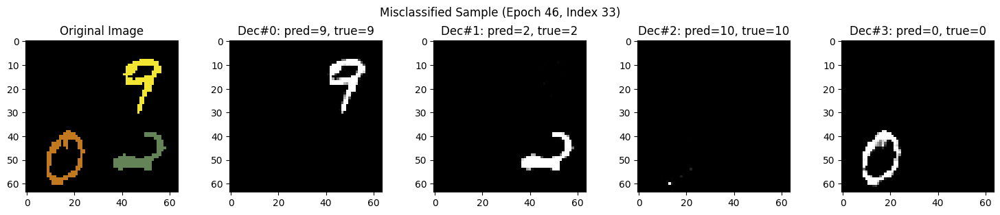

Right !!!!!!


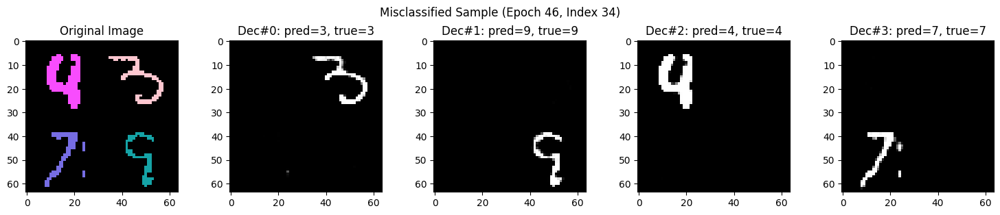

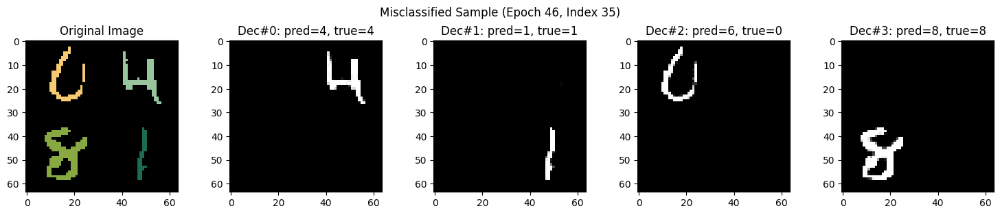

Right !!!!!!


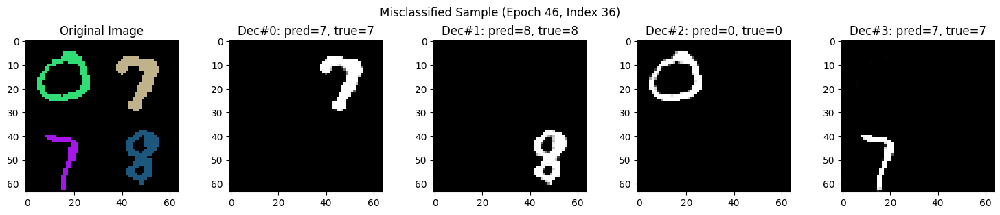

Right !!!!!!


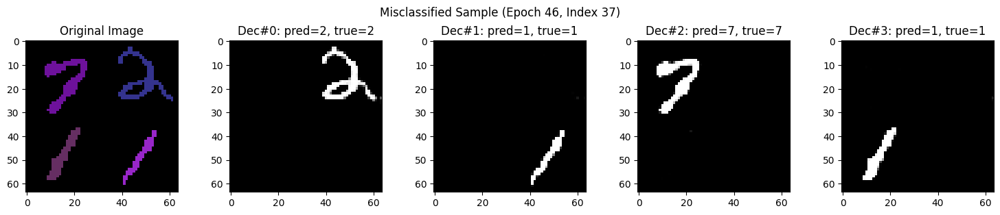

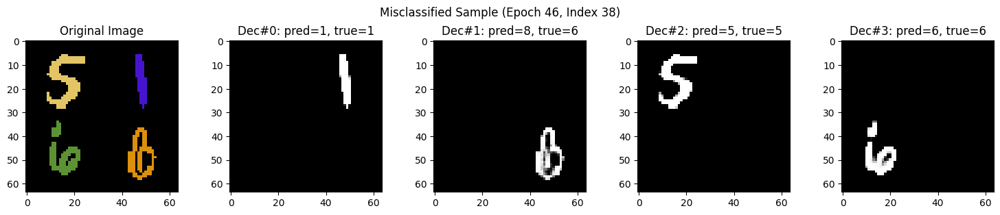

Right !!!!!!


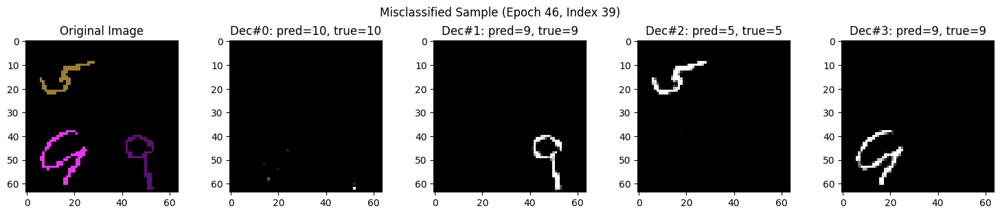

Right !!!!!!


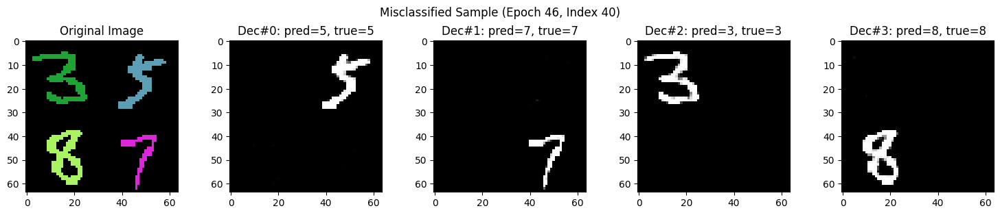

Right !!!!!!


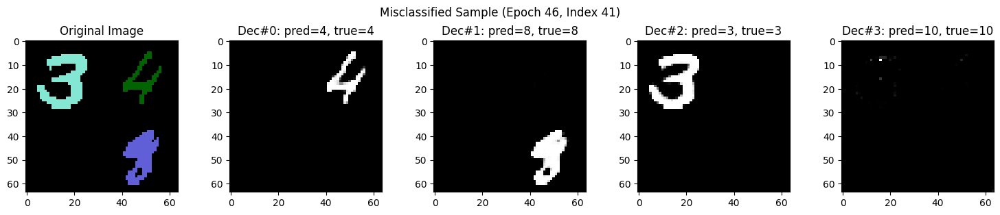

Right !!!!!!


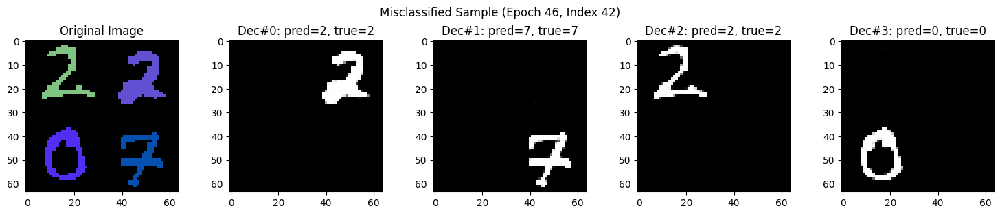

Right !!!!!!


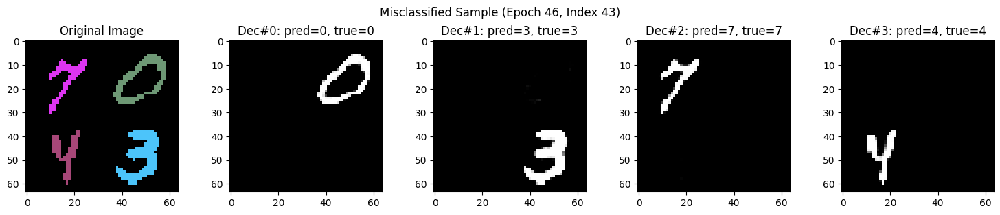

Right !!!!!!


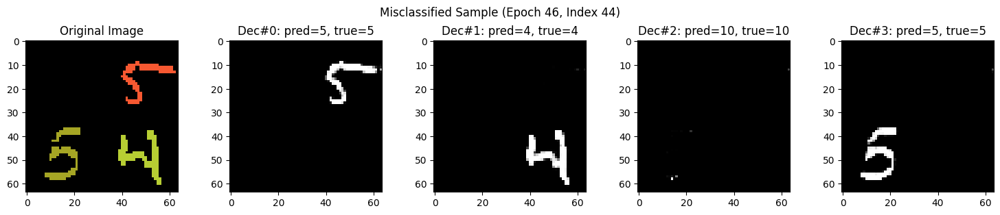

Right !!!!!!


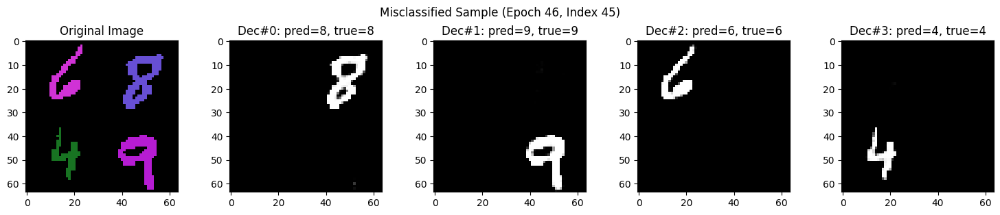

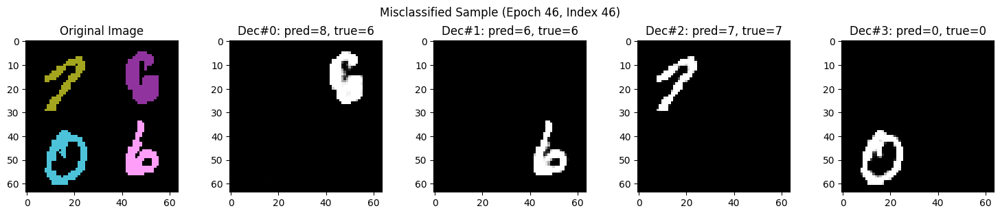

Right !!!!!!


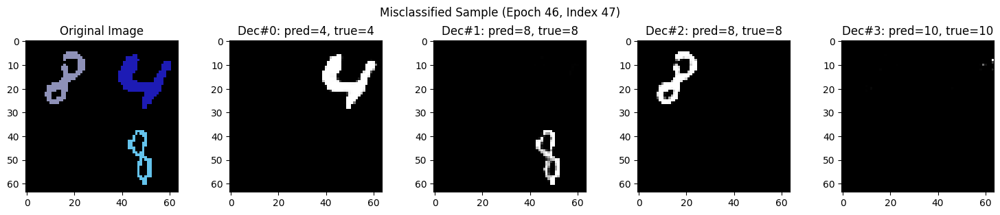

Right !!!!!!


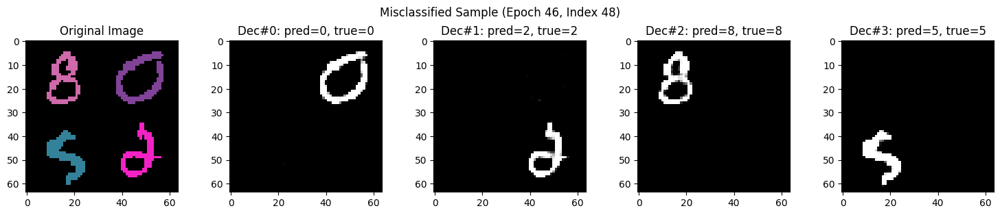

Right !!!!!!


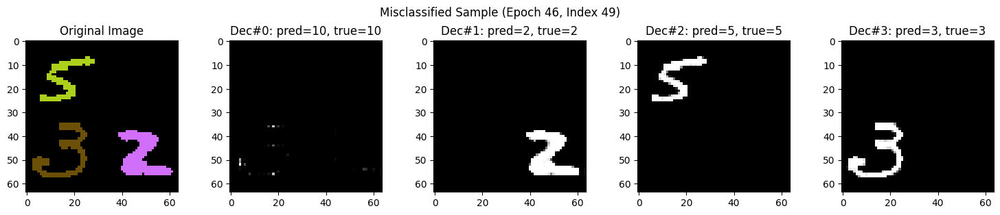

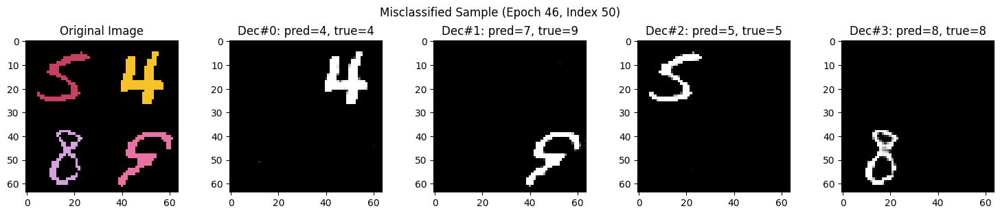

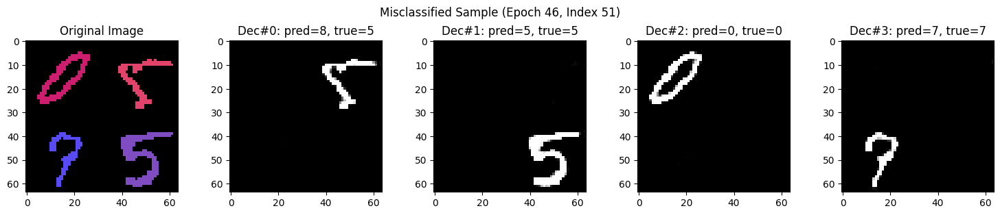

Right !!!!!!


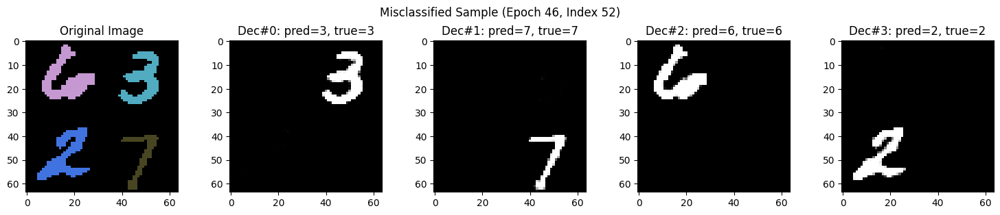

Right !!!!!!


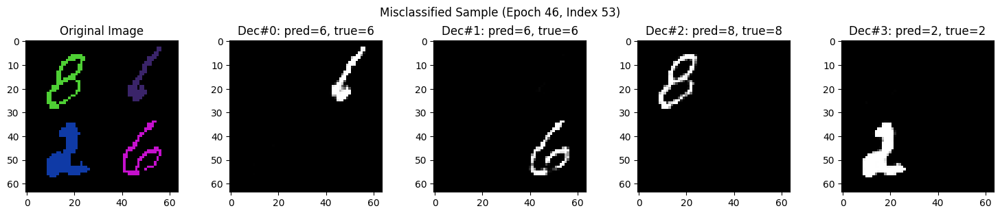

Right !!!!!!


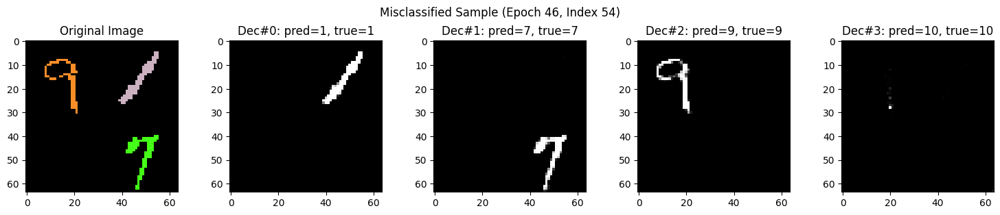

Right !!!!!!


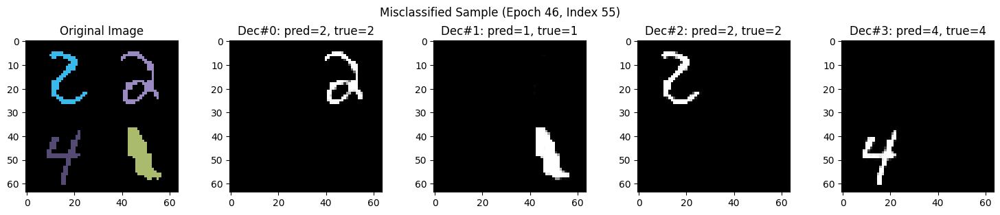

Right !!!!!!


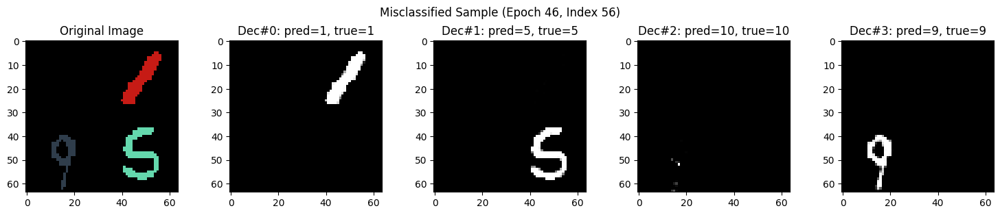

Right !!!!!!


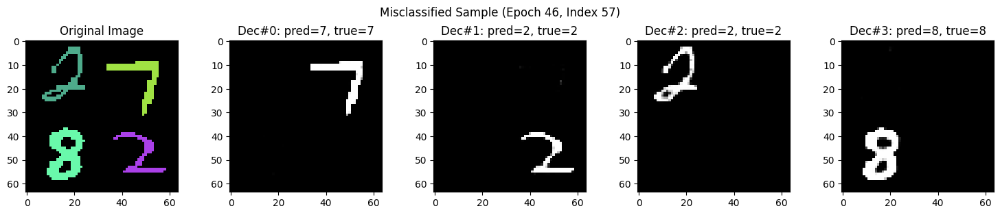

Right !!!!!!


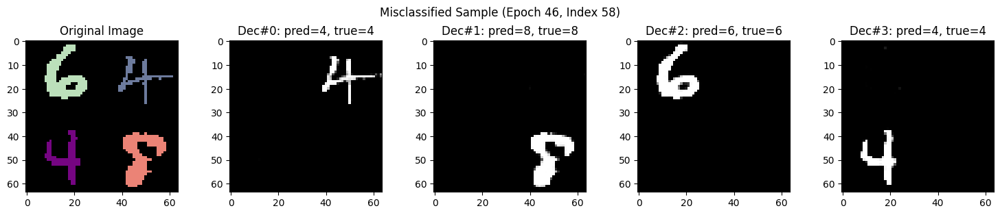

Right !!!!!!


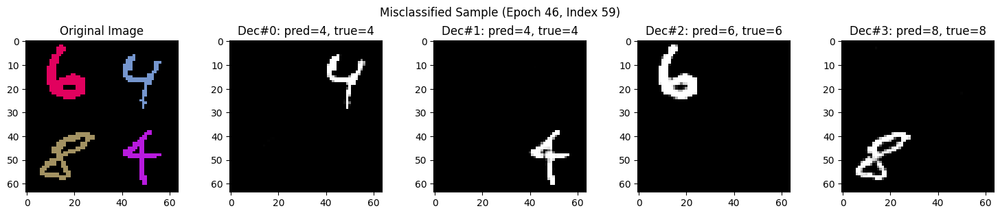

Right !!!!!!


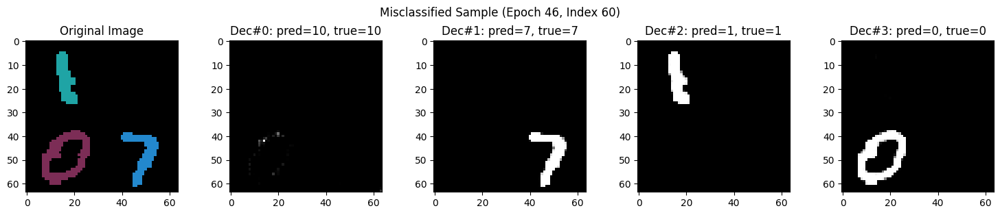

Right !!!!!!


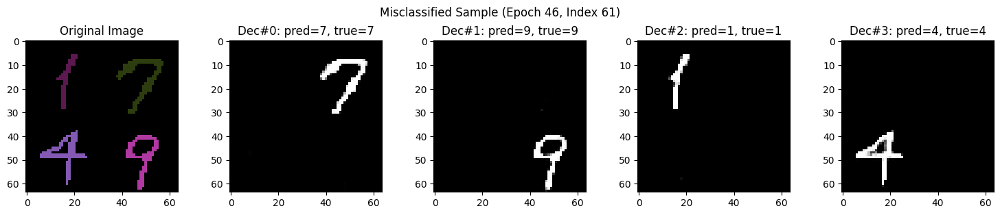

Right !!!!!!


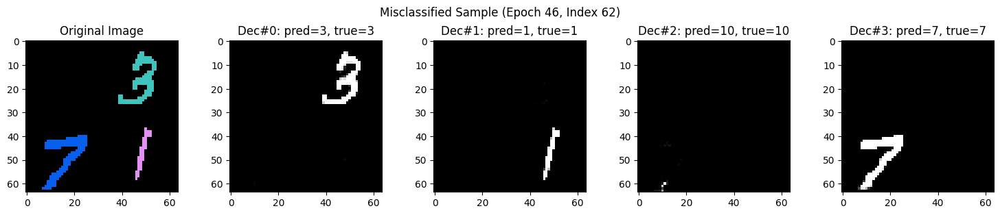

Right !!!!!!


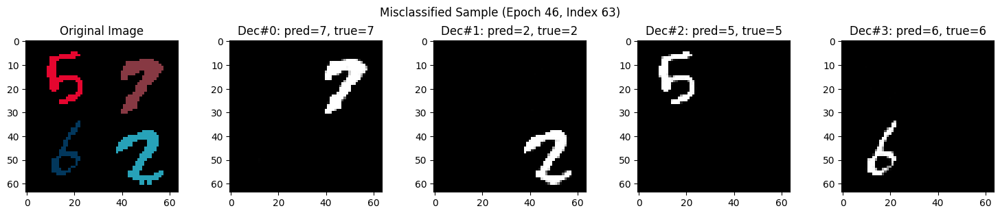

Right !!!!!!


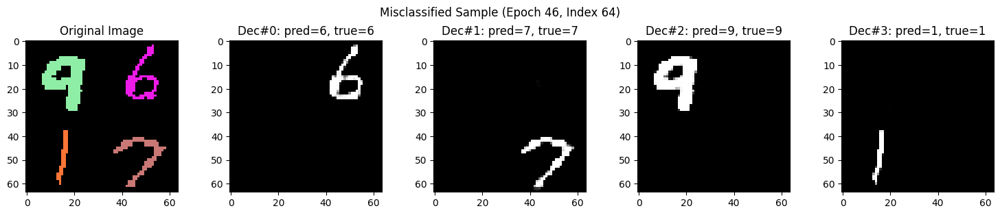

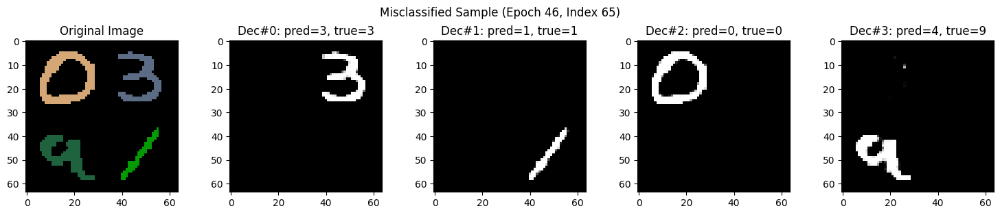

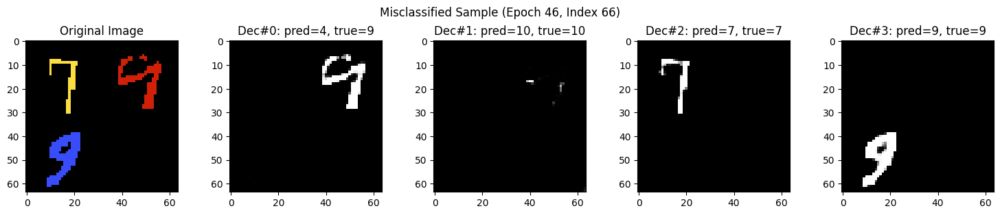

Right !!!!!!


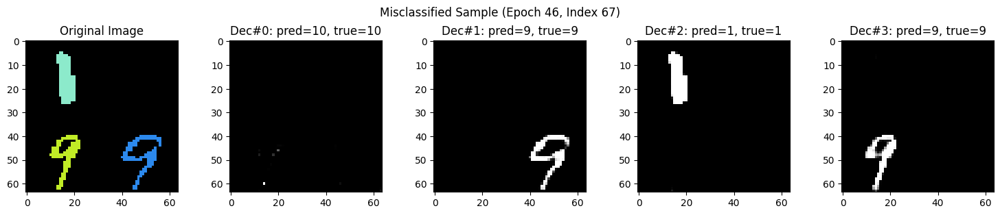

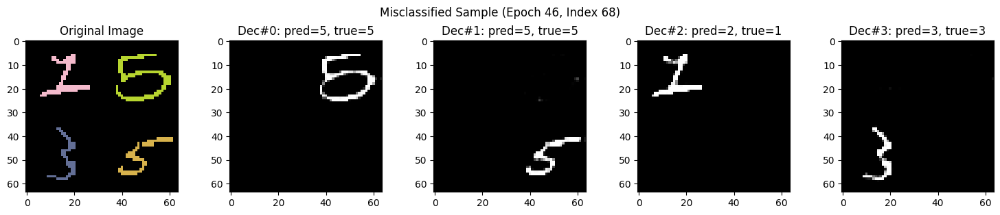

Right !!!!!!


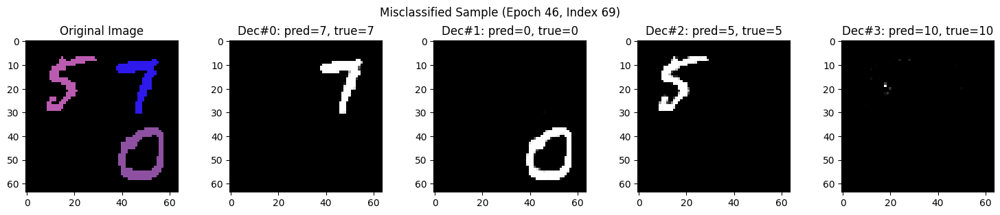

Right !!!!!!


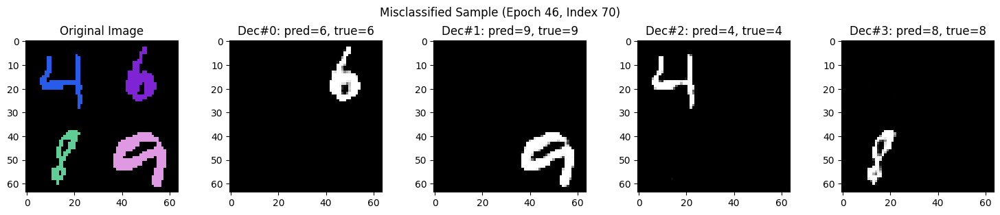

Right !!!!!!


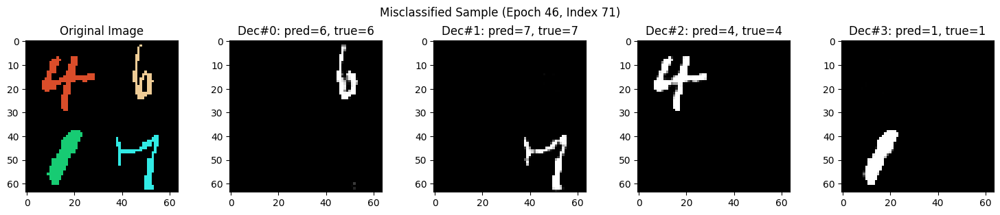

Right !!!!!!


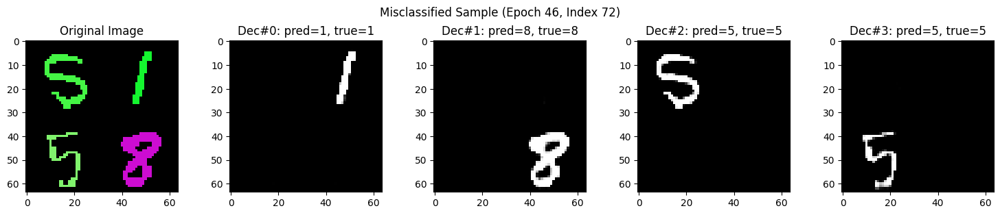

Right !!!!!!


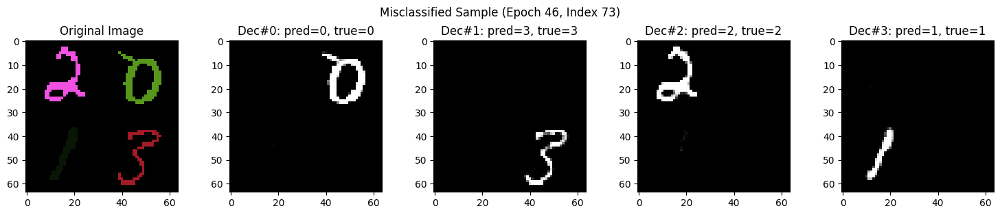

Right !!!!!!


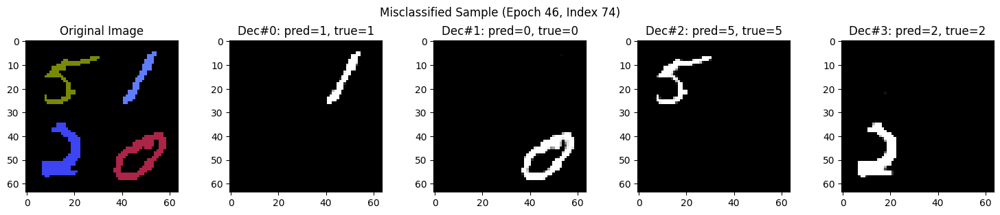

Right !!!!!!


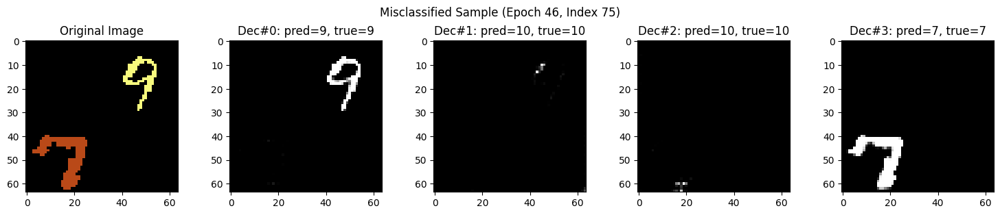

Right !!!!!!


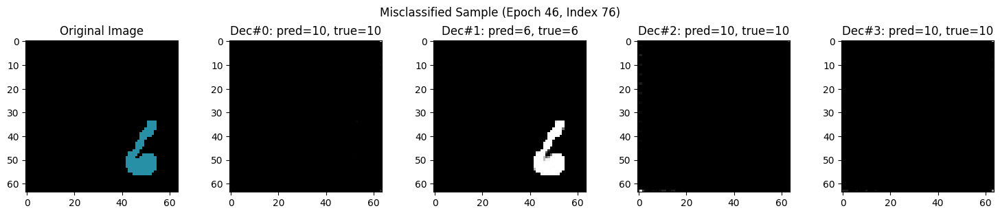

Right !!!!!!


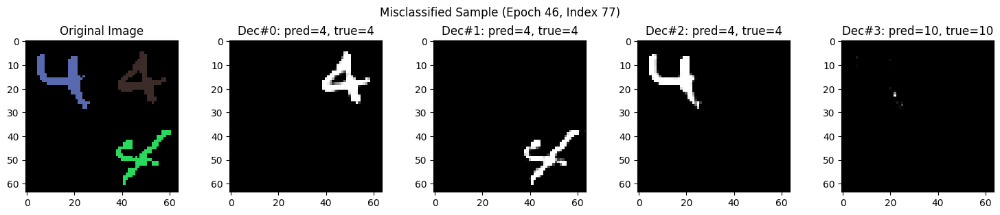

Right !!!!!!


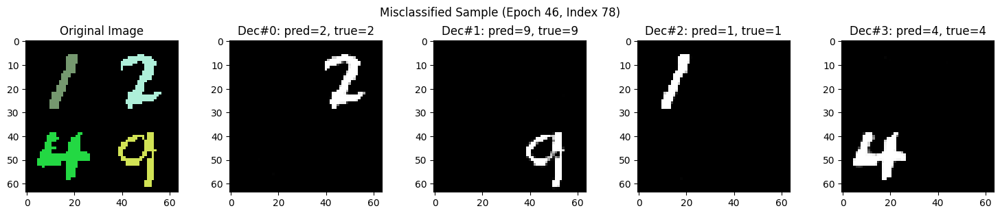

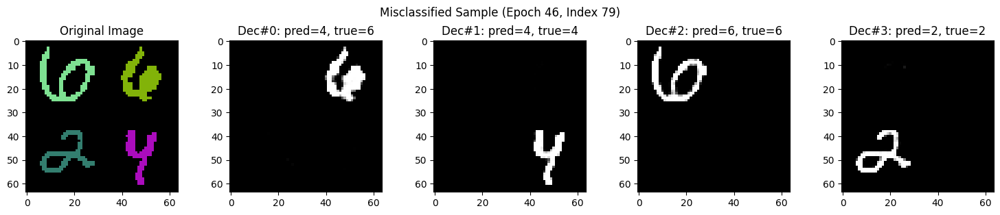

Right !!!!!!


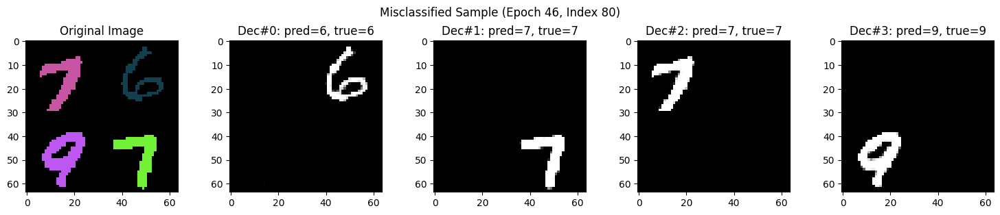

Right !!!!!!


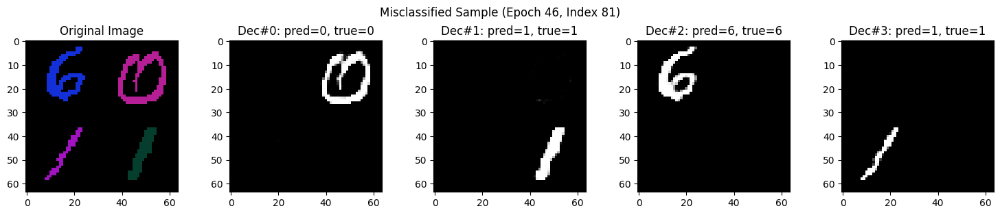

Right !!!!!!


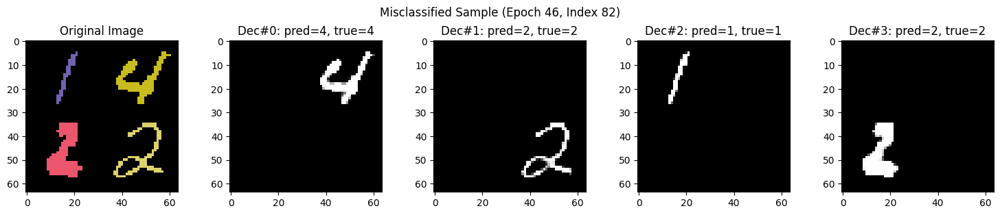

Right !!!!!!


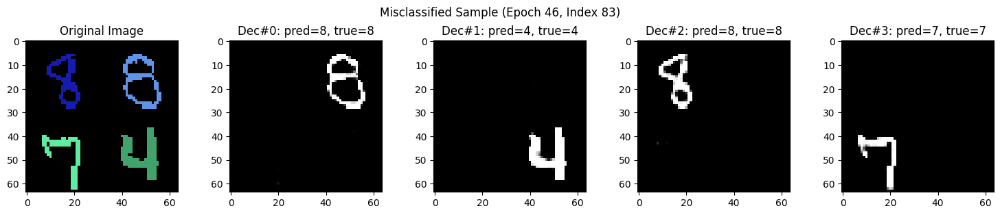

Right !!!!!!


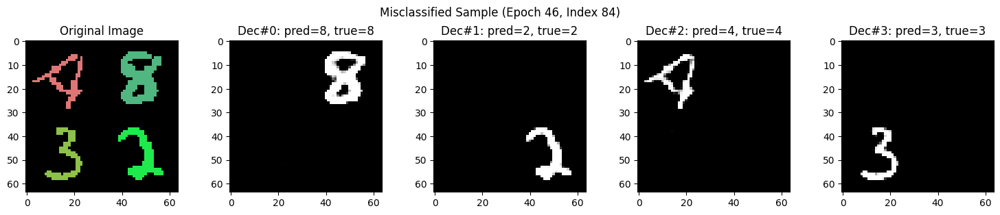

Right !!!!!!


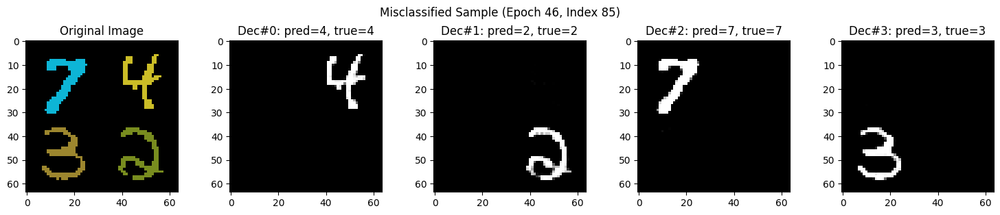

Right !!!!!!


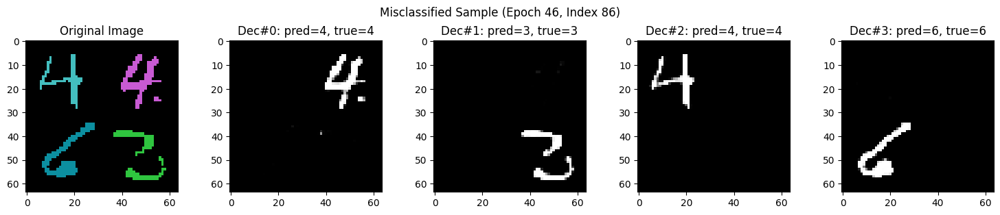

Right !!!!!!


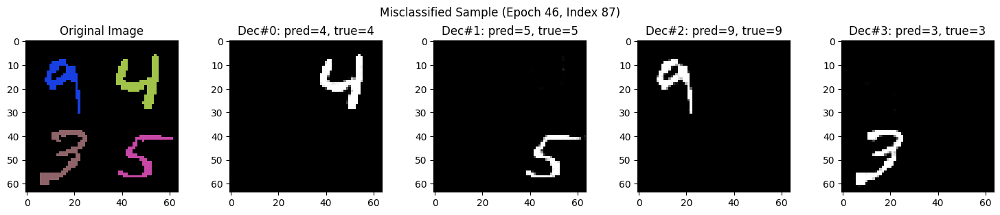

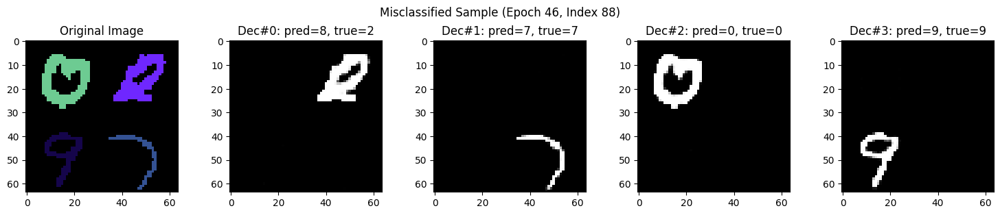

Right !!!!!!


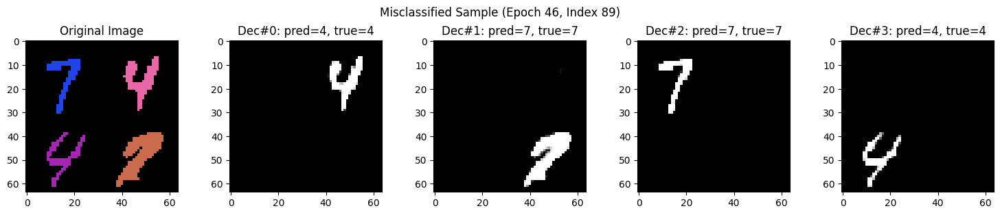

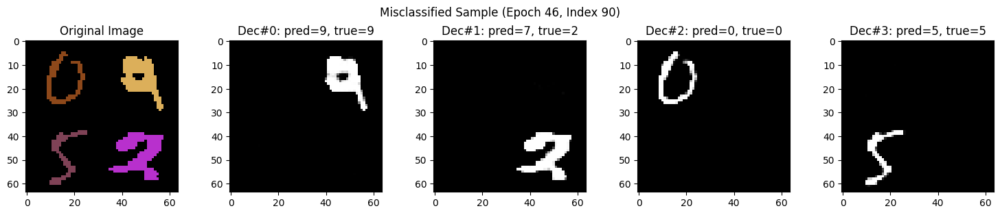

Right !!!!!!


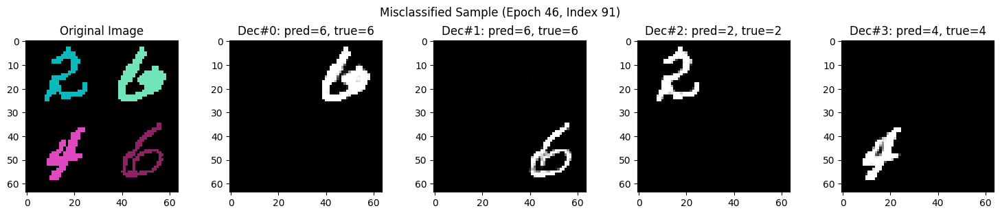

Right !!!!!!


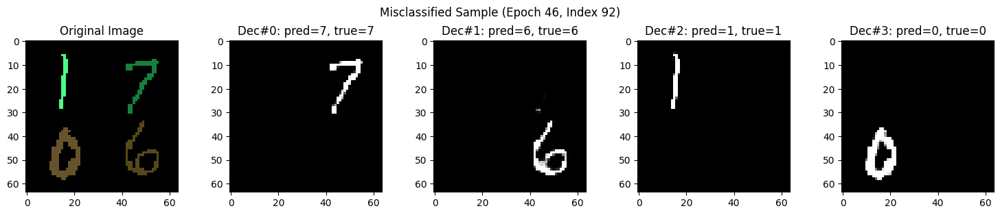

Right !!!!!!


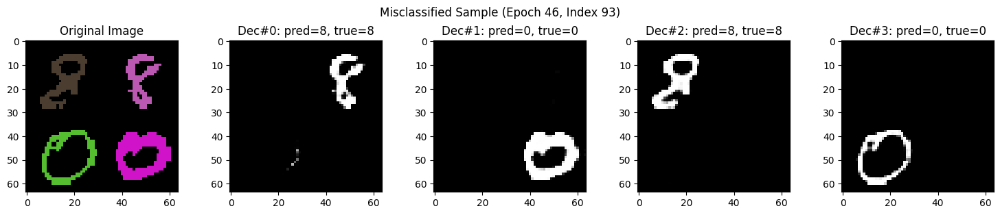

Right !!!!!!


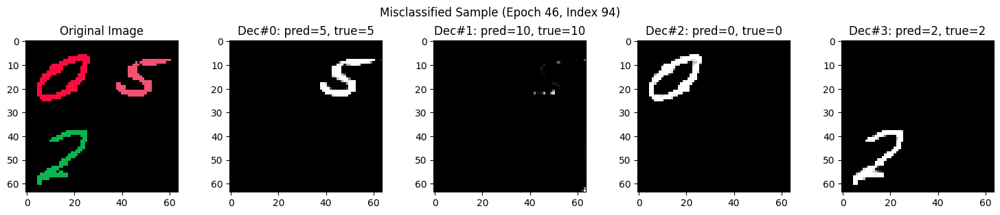

Right !!!!!!


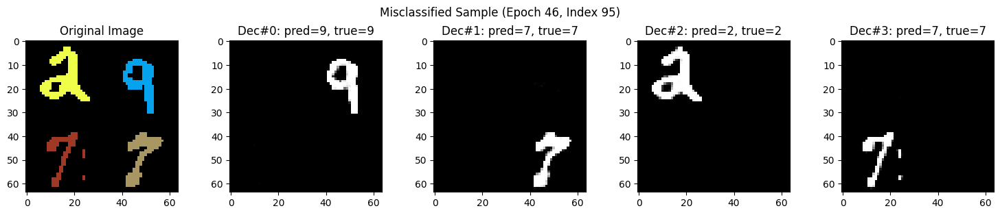

Right !!!!!!


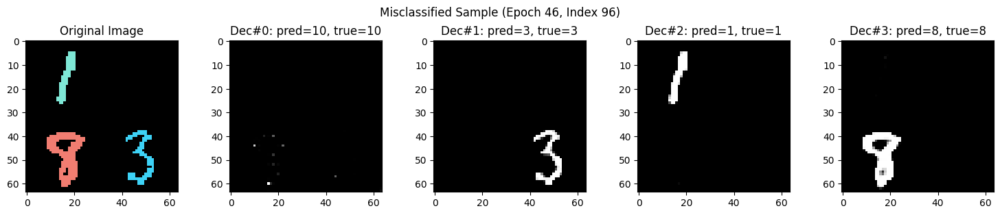

Right !!!!!!


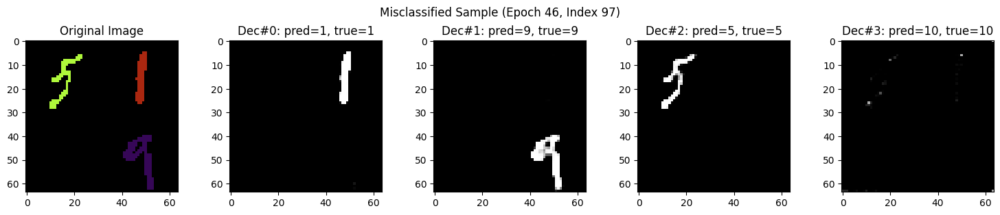

Right !!!!!!


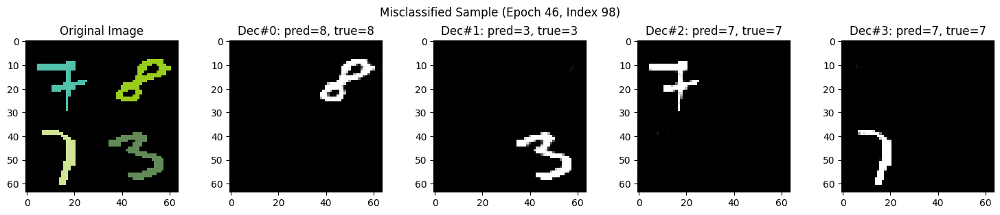

Right !!!!!!


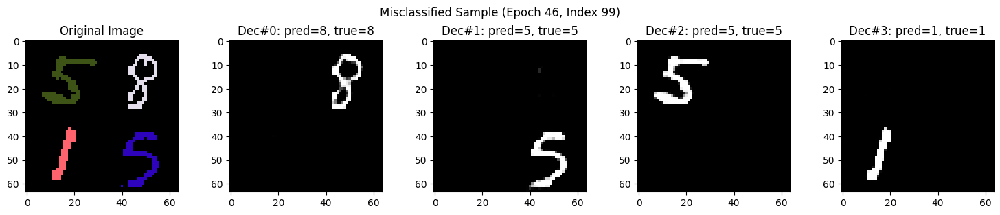

[Epoch 46] Train Loss: 0.0963 | Test Loss: 0.1164 | Test Acc: 95.89%
[Epoch 47] Train Loss: 0.1038 | Test Loss: 0.1243 | Test Acc: 94.79%
[Epoch 48] Train Loss: 0.1293 | Test Loss: 0.1032 | Test Acc: 96.44%
[Epoch 49] Train Loss: 0.1014 | Test Loss: 0.1048 | Test Acc: 95.89%
[Epoch 50] Train Loss: 0.1034 | Test Loss: 0.0998 | Test Acc: 96.44%


In [168]:
'''
    TODO : 학습 및 평가_multimodel
'''
batch_size = 4
epochs = 50
lr = 0.003
device = 'mps' 

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# segmentation model freeze & load
seg_model = MultiSegNet().to(device)
seg_model.load_state_dict(torch.load('best_multi_seg_model.pth'))
seg_model.eval()
for param in seg_model.parameters():
    param.requires_grad = False

classifier = Classifier().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(classifier.parameters(), lr=lr)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)


train_loss_list = []
test_loss_list = []
best_acc = 0

# ----- 학습 루프 -----
for epoch in range(epochs):
    classifier.train()
    total_train_loss = 0
    correct = 0
    total = 0
    shown_flag = {"shown": False}  # 🔸 에폭당 1회 시각화 제한

    for batch_idx, (img, masks, labels) in enumerate(train_loader):
        img, masks, labels = img.to(device), masks.to(device), labels.to(device)
        with torch.no_grad():
            pred_masks = seg_model(img).squeeze(2)  # (B, 4, 64, 64)

        reordered_labels = get_reordered_labels(pred_masks, masks, labels, device, verbose=True,
            img=img,
            epoch=epoch + 1,
            img_idx=batch_idx * batch_size,
            shown_flag=shown_flag)
        
        outputs = classifier(pred_masks)  # (B, 4, 11)

        loss = sum(criterion(outputs[:, i, :], reordered_labels[:, i]) for i in range(4)) / 4

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

        preds = torch.argmax(outputs, dim=2)
        valid_mask = (reordered_labels != 10)
        correct += ((preds == reordered_labels) & valid_mask).sum().item()
        total += valid_mask.sum().item()

    acc = 100 * correct / total
    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_list.append(avg_train_loss)

    # ----- 평가 -----
    classifier.eval()
    total_test_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for batch_idx, (img, masks, labels) in enumerate(test_loader):
            img, masks, labels = img.to(device), masks.to(device), labels.to(device)
            pred_masks = seg_model(img).squeeze(2)
            reordered_labels = get_reordered_labels(pred_masks, masks, labels, device)
            outputs = classifier(pred_masks)

            loss = sum(criterion(outputs[:, i, :], reordered_labels[:, i]) for i in range(4)) / 4
            total_test_loss += loss.item()

            preds = torch.argmax(outputs, dim=2)
            valid_mask = (reordered_labels != 10)
            correct += ((preds == reordered_labels) & valid_mask).sum().item()
            total += valid_mask.sum().item()

            if epoch == 45:
            # 틀린 예시 시각화
                for b in range(img.size(0)):    
                    wrong = ((preds[b] != reordered_labels[b]) & valid_mask[b]).any()
                    if wrong:
                        visualize_misclassified(img[b], pred_masks[b], preds[b], reordered_labels[b], epoch+1, batch_idx * batch_size + b)
                    else:
                        print("Right !!!!!!")
                        visualize_misclassified(img[b], pred_masks[b], preds[b], reordered_labels[b], epoch+1, batch_idx * batch_size + b)


    test_acc = 100 * correct / total
    avg_test_loss = total_test_loss / len(test_loader)
    test_loss_list.append(avg_test_loss)
    scheduler.step(avg_test_loss)


    print(f"[Epoch {epoch+1}] Train Loss: {avg_train_loss:.4f} | Test Loss: {avg_test_loss:.4f} | Test Acc: {test_acc:.2f}%")


Min Train Loss: 0.0963 at epoch 45
Min Test Loss: 0.0964 at epoch 38


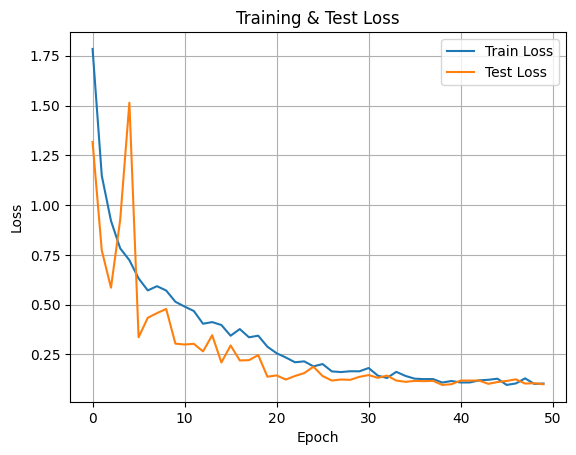

In [169]:
'''
    TODO : loss 시각화
'''
min_train_loss = min(train_loss_list)
min_train_epoch = train_loss_list.index(min_train_loss)

min_test_loss = min(test_loss_list)
min_test_epoch = test_loss_list.index(min_test_loss)

print(f"Min Train Loss: {min_train_loss:.4f} at epoch {min_train_epoch}")
print(f"Min Test Loss: {min_test_loss:.4f} at epoch {min_test_epoch}")

visualize_loss_curves(train_loss_list, test_loss_list) 

### AutoEncoder layer 기반의 Unet 분류

[Epoch 1] Train Loss: 1.8925 | Test Loss: 1.5439 | Test Acc: 49.04%
[Epoch 2] Train Loss: 1.3595 | Test Loss: 1.1153 | Test Acc: 62.47%
[Epoch 3] Train Loss: 1.1508 | Test Loss: 0.9972 | Test Acc: 68.22%
[Epoch 4] Train Loss: 1.0253 | Test Loss: 0.7558 | Test Acc: 76.44%
[Epoch 5] Train Loss: 0.8860 | Test Loss: 0.6876 | Test Acc: 76.71%
[Epoch 6] Train Loss: 0.7807 | Test Loss: 0.5029 | Test Acc: 83.56%
[Epoch 7] Train Loss: 0.7692 | Test Loss: 0.6411 | Test Acc: 79.18%
[Epoch 8] Train Loss: 0.7257 | Test Loss: 0.5066 | Test Acc: 84.38%
[Epoch 9] Train Loss: 0.7039 | Test Loss: 0.5080 | Test Acc: 82.19%
[Epoch 10] Train Loss: 0.6762 | Test Loss: 0.5141 | Test Acc: 84.38%
[Epoch 11] Train Loss: 0.5787 | Test Loss: 0.3196 | Test Acc: 91.51%
[Epoch 12] Train Loss: 0.5286 | Test Loss: 0.2934 | Test Acc: 91.78%
[Epoch 13] Train Loss: 0.4609 | Test Loss: 0.2961 | Test Acc: 91.78%
[Epoch 14] Train Loss: 0.4161 | Test Loss: 0.2542 | Test Acc: 91.78%
[Epoch 15] Train Loss: 0.4362 | Test Loss: 

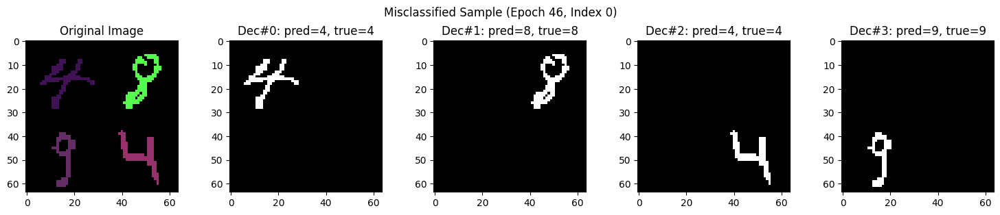

Right !!!!!!


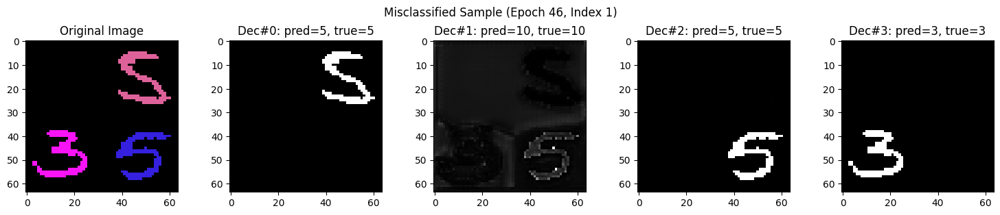

Right !!!!!!


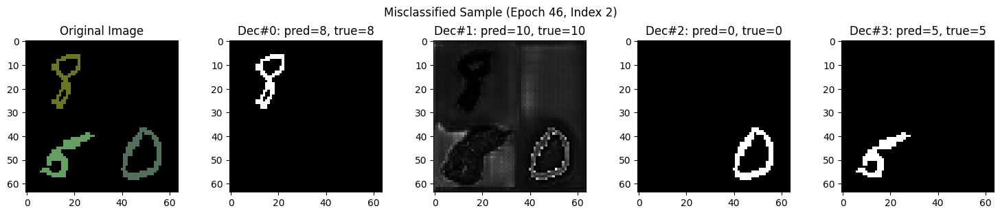

Right !!!!!!


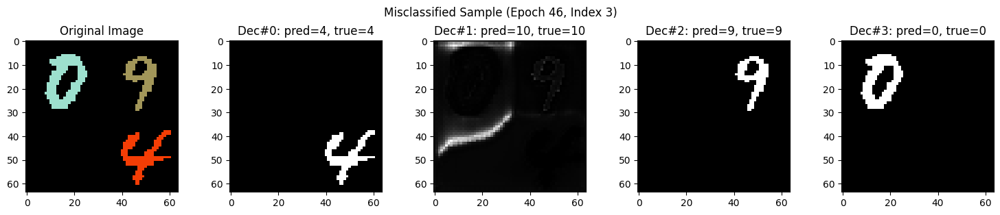

Right !!!!!!


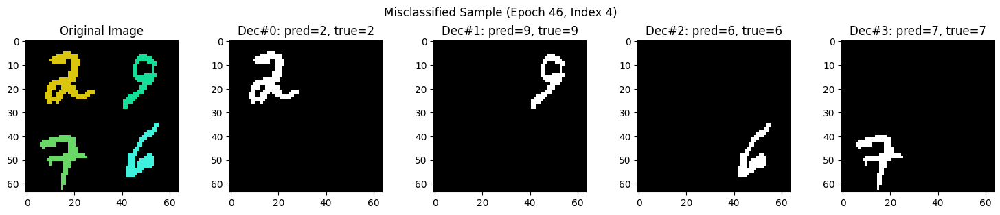

Right !!!!!!


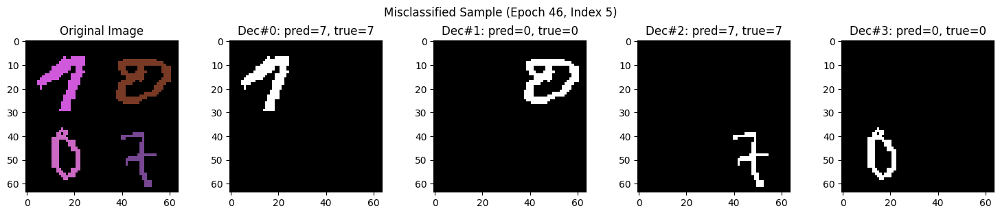

Right !!!!!!


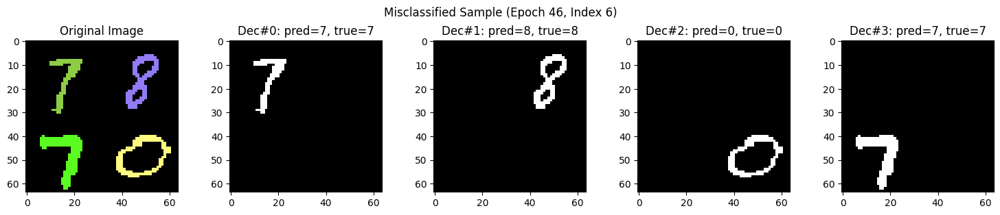

Right !!!!!!


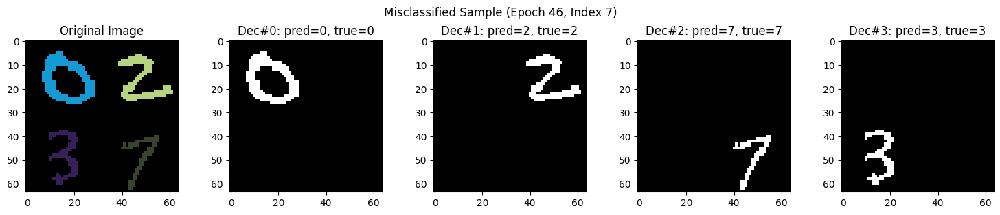

Right !!!!!!


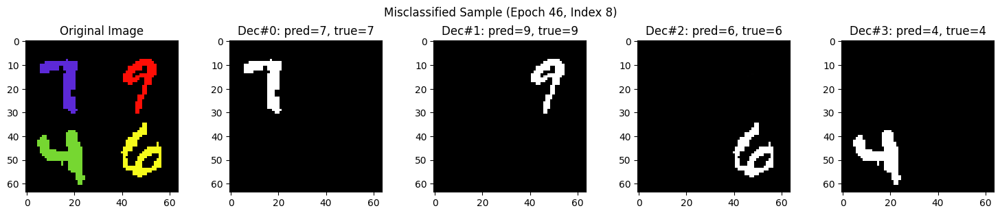

Right !!!!!!


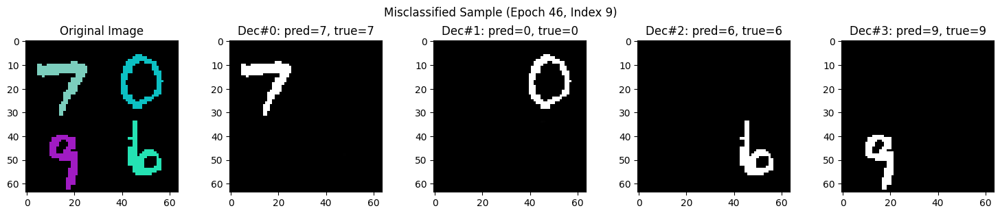

Right !!!!!!


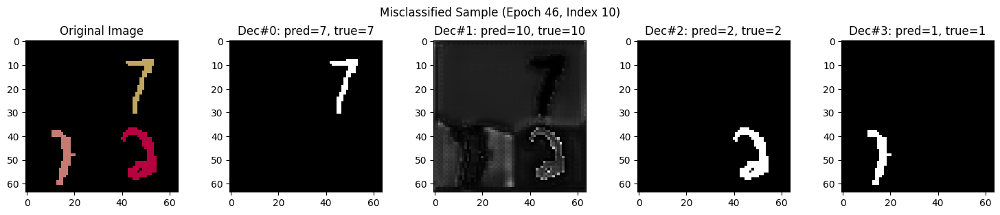

Right !!!!!!


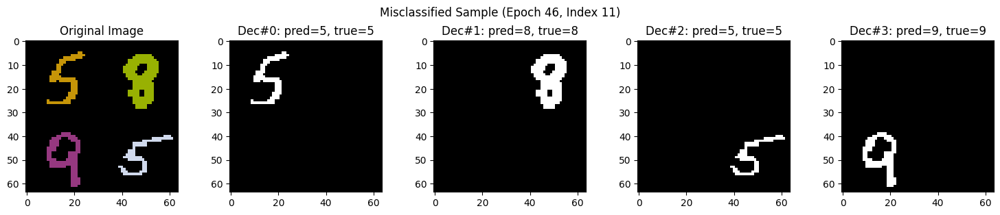

Right !!!!!!


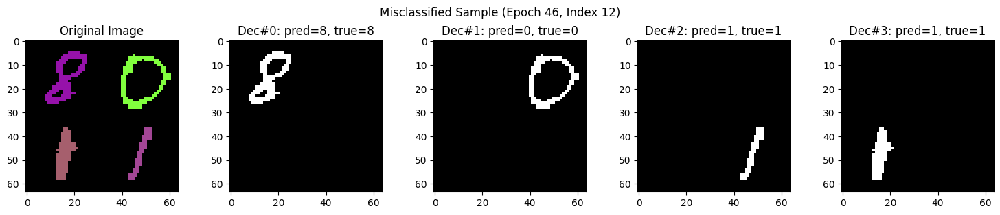

Right !!!!!!


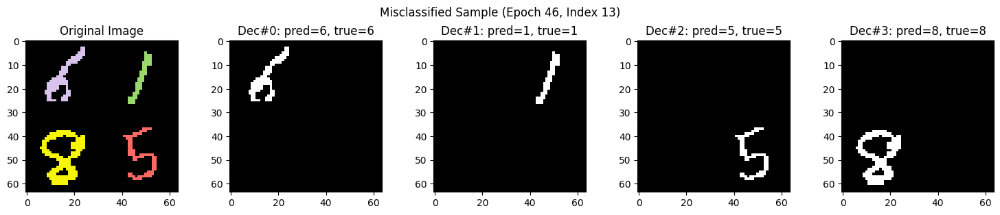

Right !!!!!!


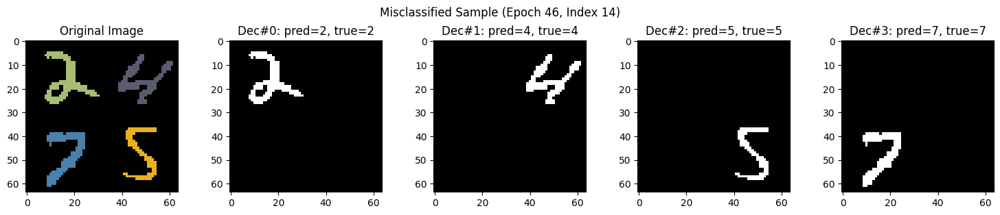

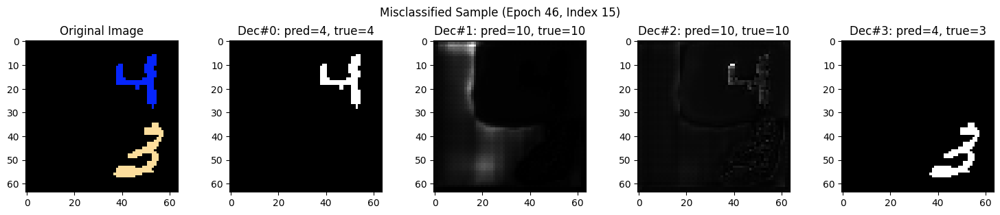

Right !!!!!!


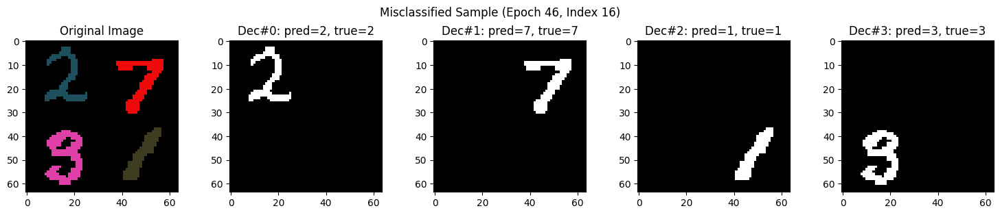

Right !!!!!!


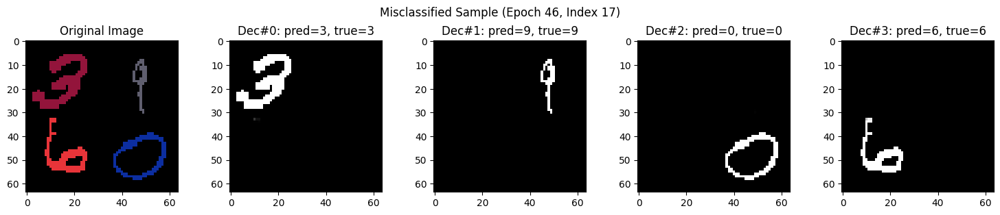

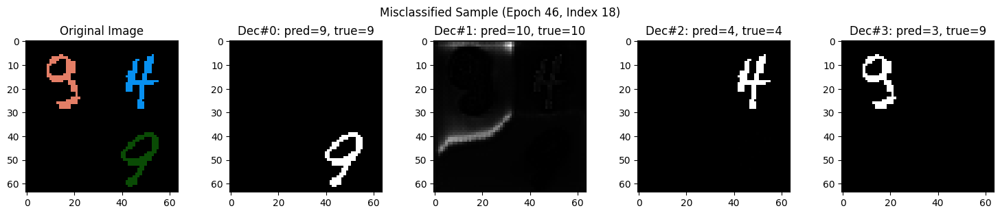

Right !!!!!!


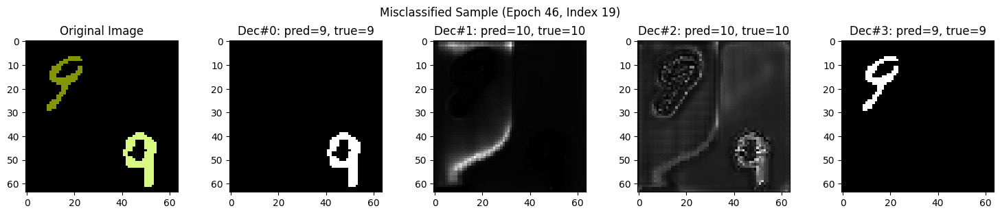

Right !!!!!!


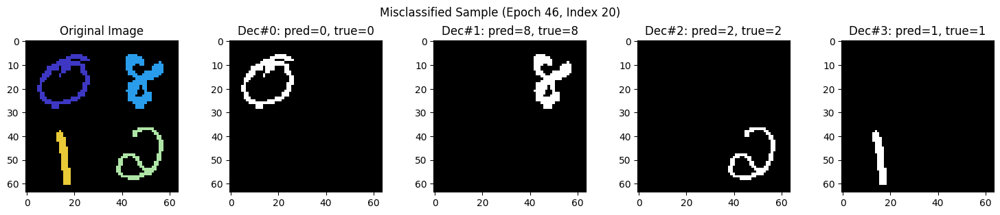

Right !!!!!!


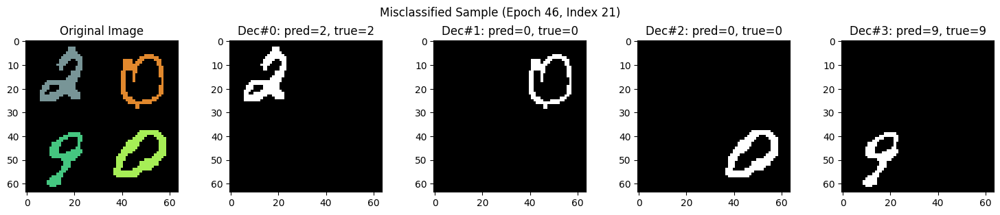

Right !!!!!!


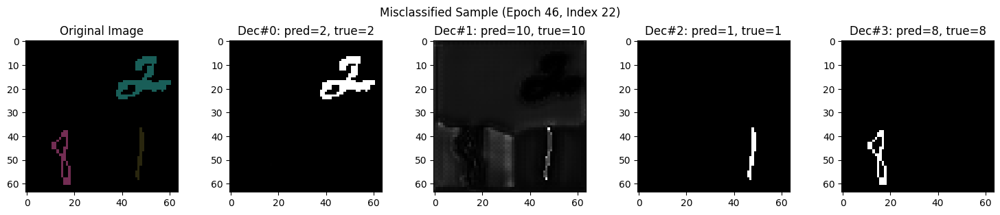

Right !!!!!!


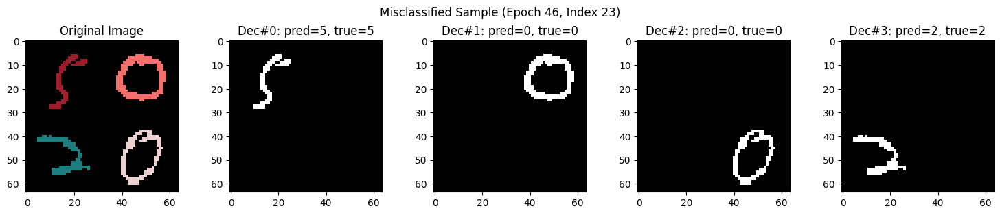

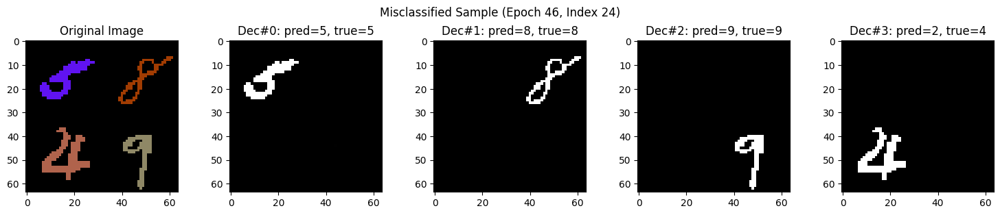

Right !!!!!!


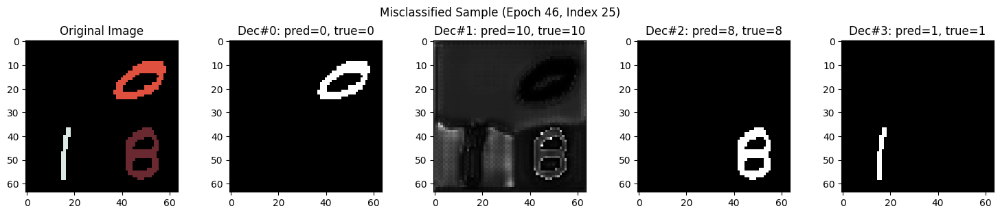

Right !!!!!!


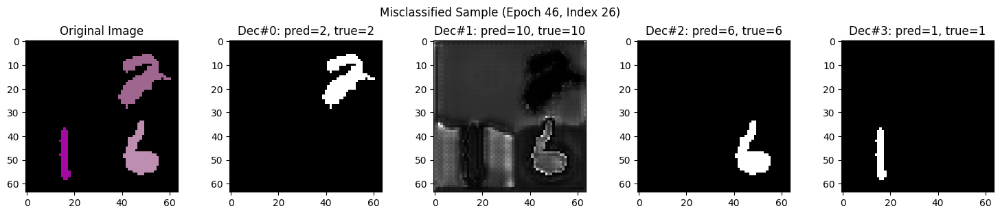

Right !!!!!!


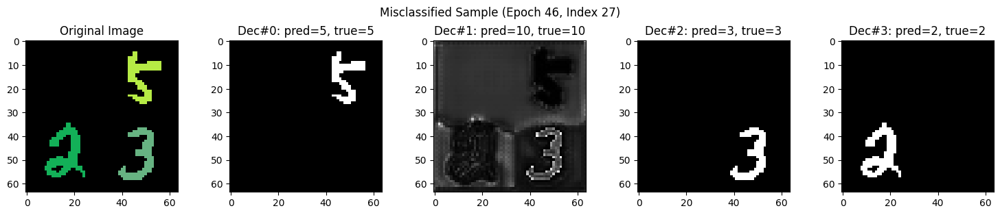

Right !!!!!!


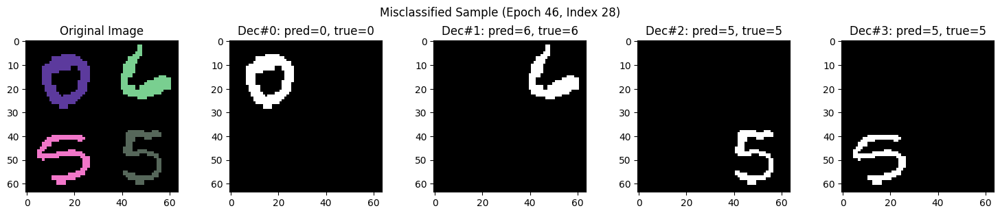

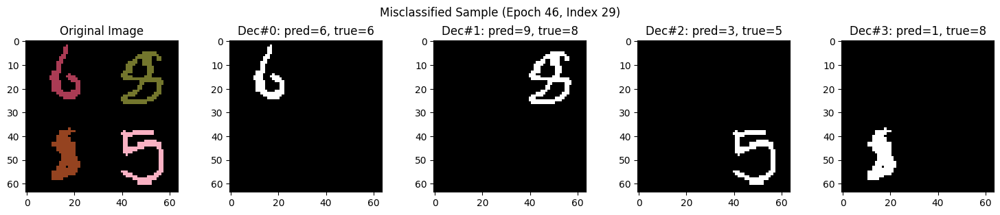

Right !!!!!!


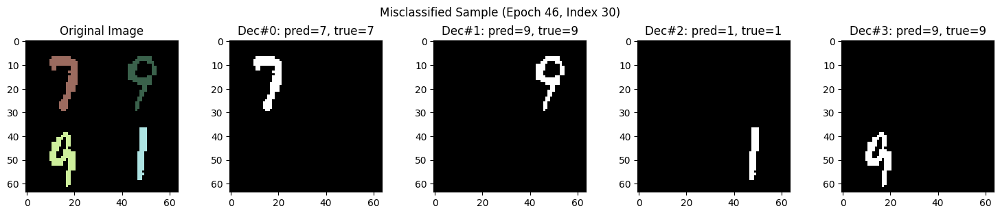

Right !!!!!!


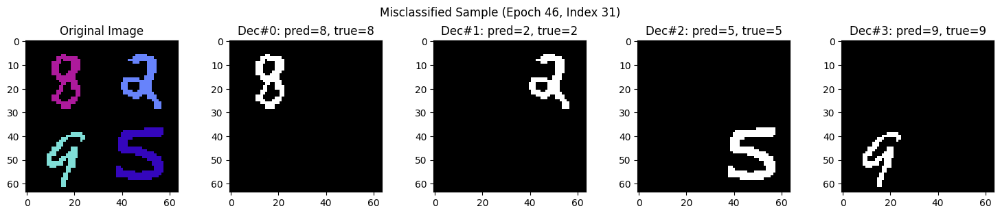

Right !!!!!!


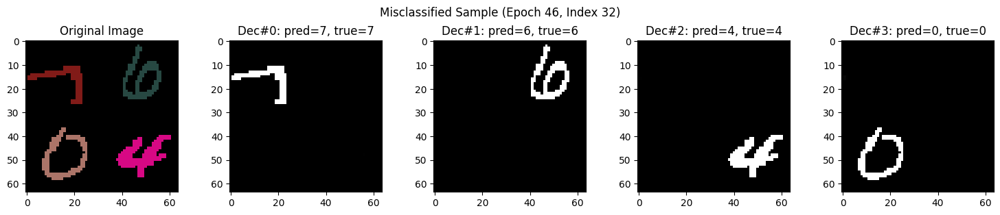

Right !!!!!!


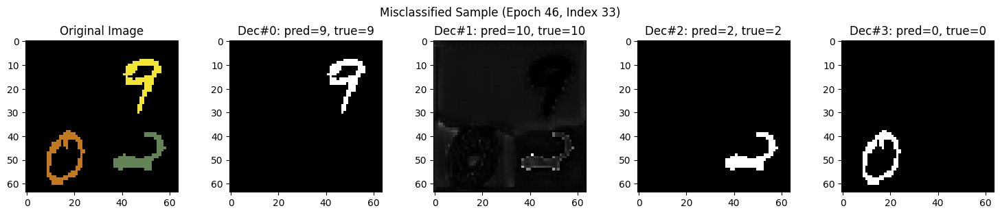

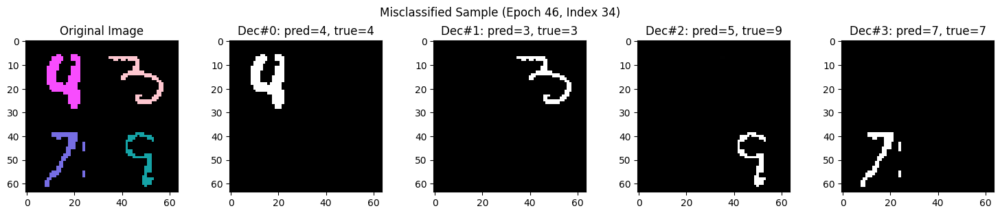

Right !!!!!!


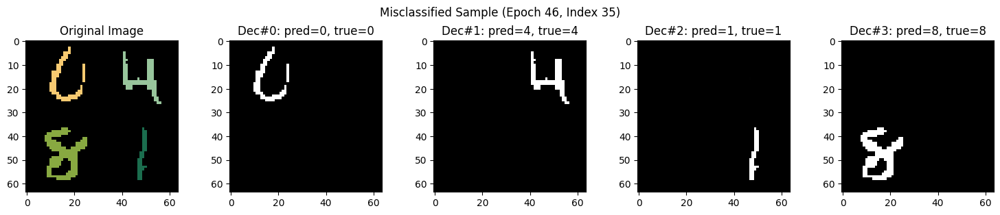

Right !!!!!!


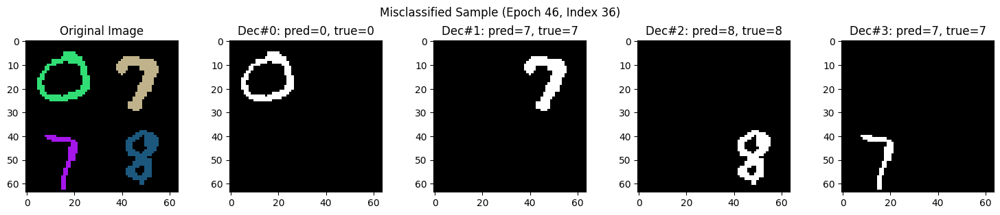

Right !!!!!!


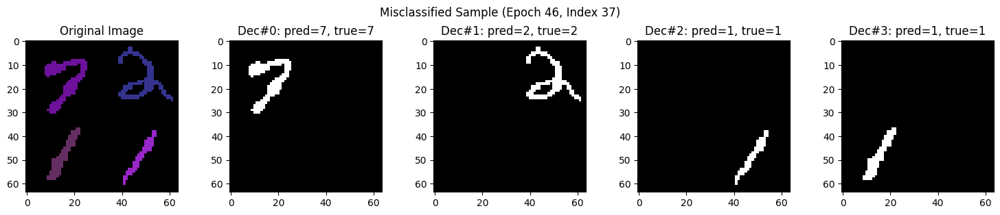

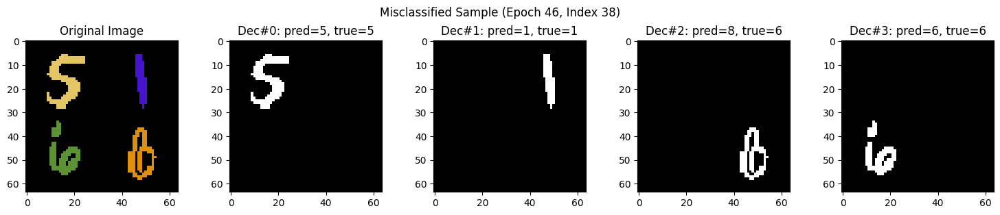

Right !!!!!!


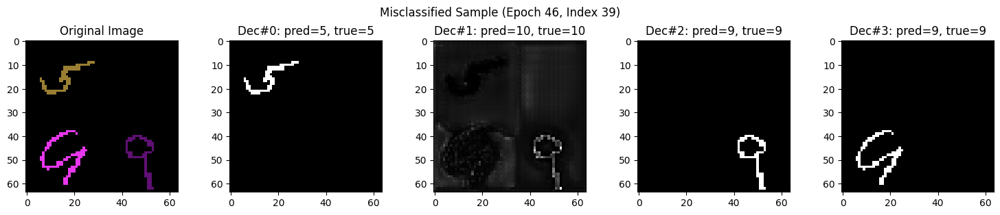

Right !!!!!!


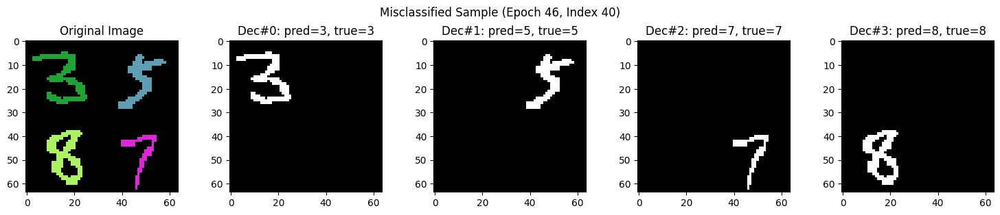

Right !!!!!!


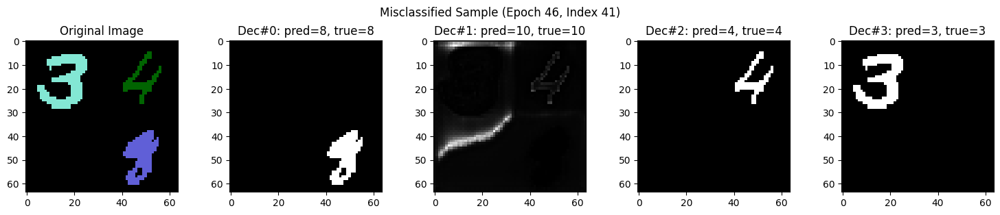

Right !!!!!!


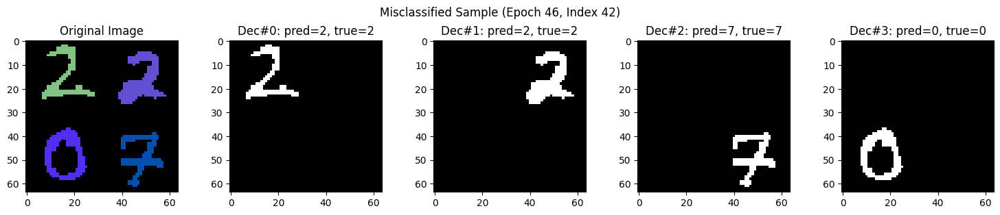

Right !!!!!!


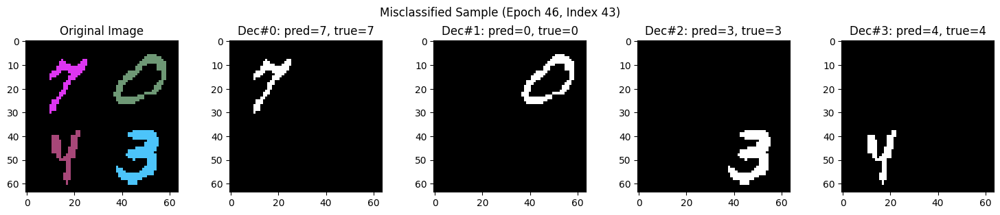

Right !!!!!!


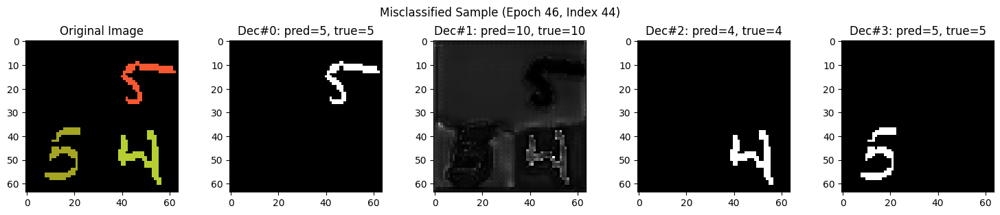

Right !!!!!!


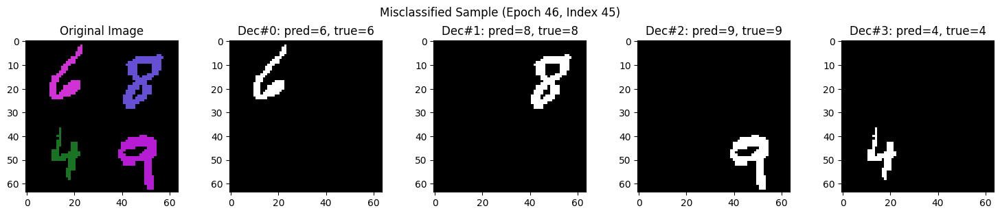

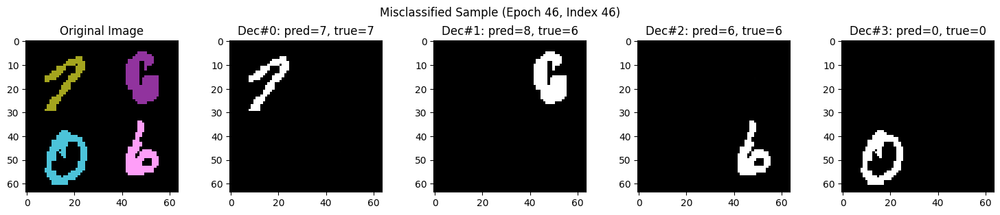

Right !!!!!!


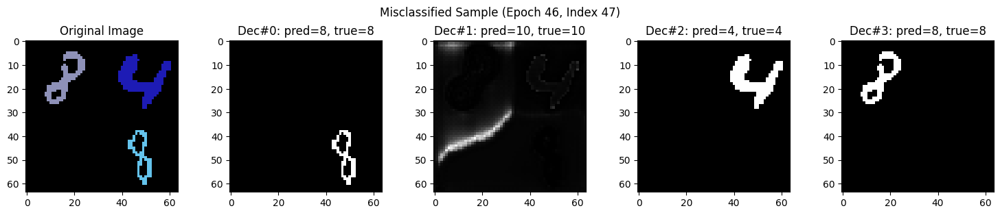

Right !!!!!!


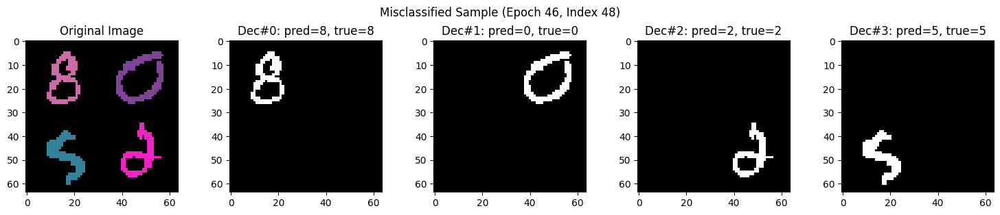

Right !!!!!!


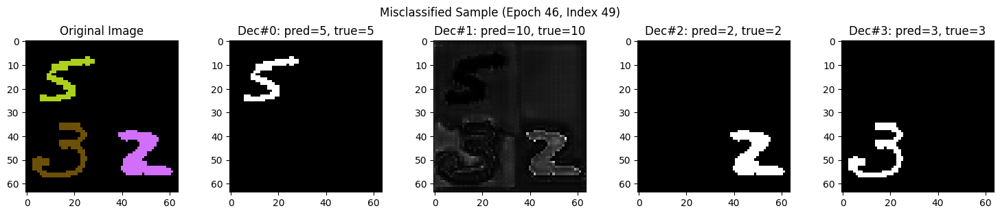

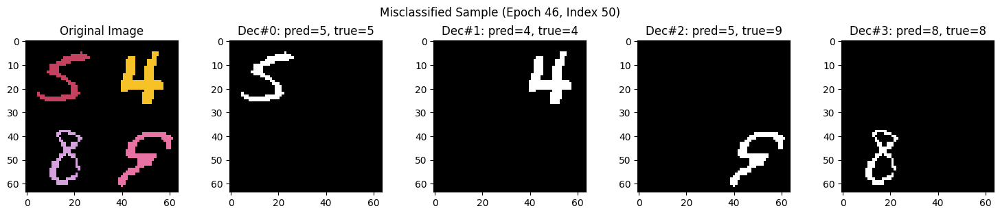

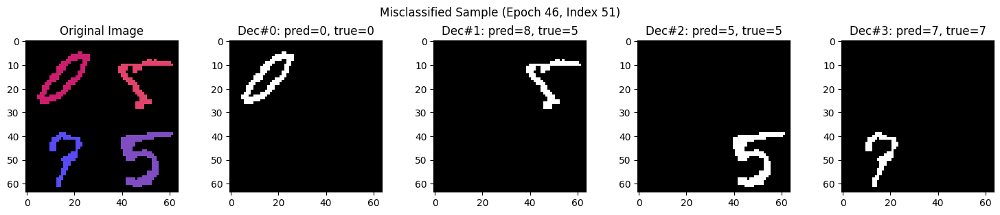

Right !!!!!!


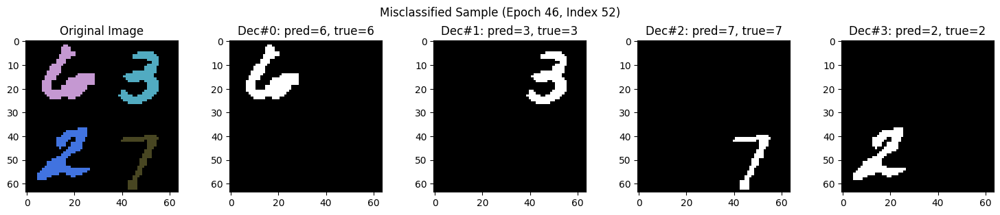

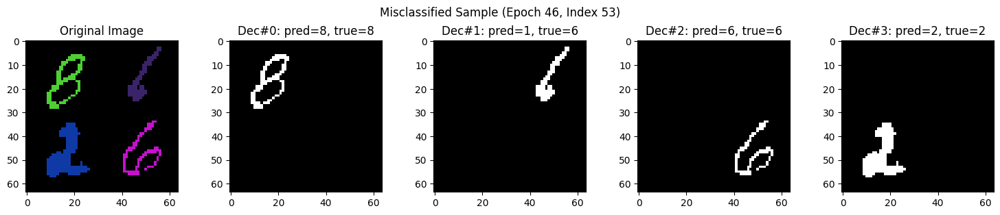

Right !!!!!!


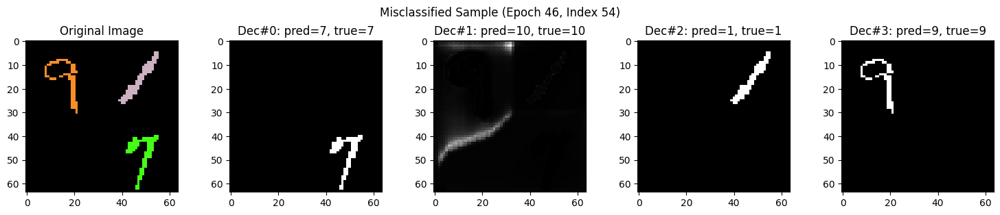

Right !!!!!!


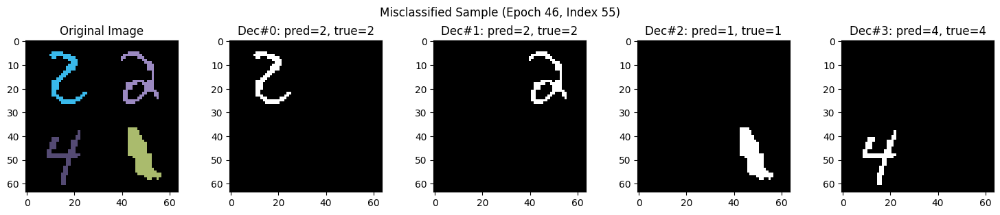

Right !!!!!!


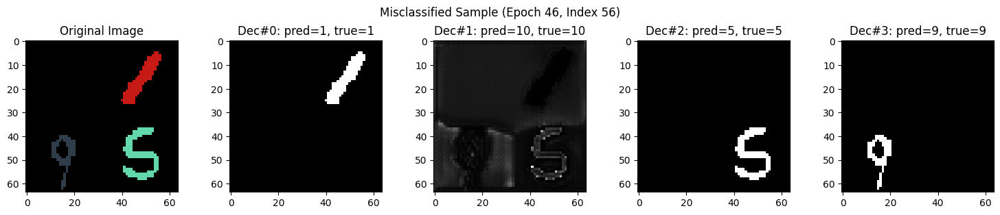

Right !!!!!!


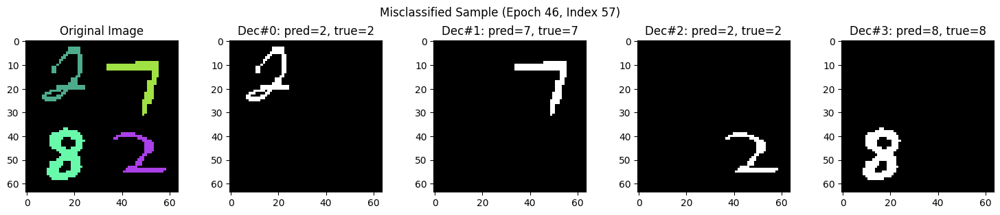

Right !!!!!!


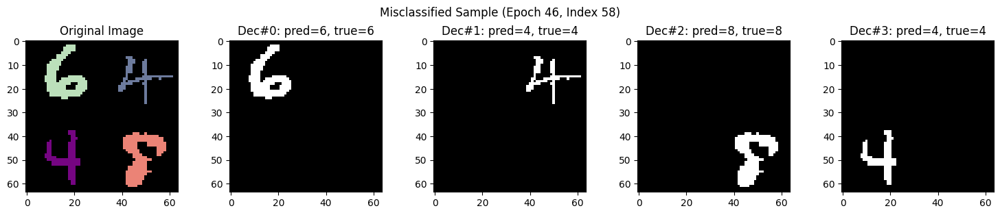

Right !!!!!!


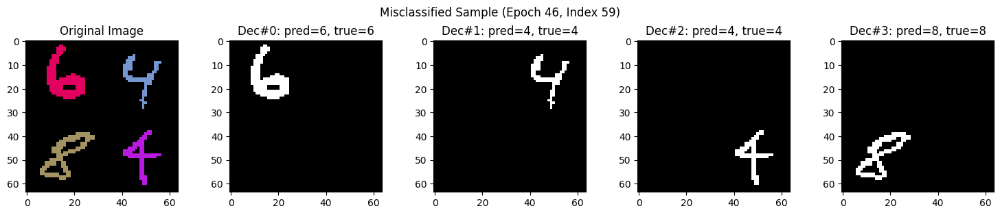

Right !!!!!!


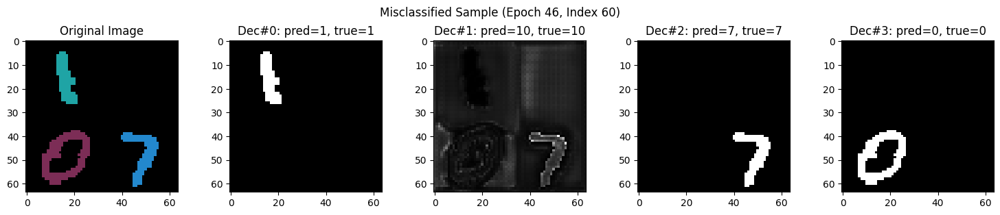

Right !!!!!!


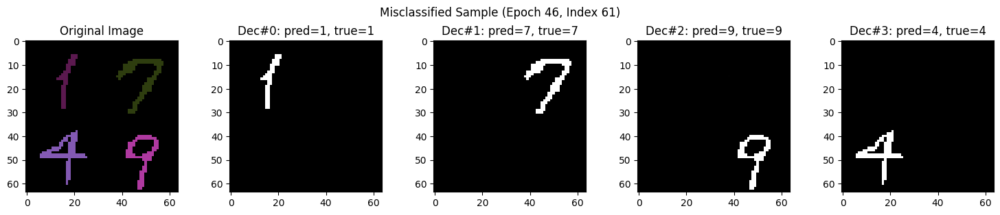

Right !!!!!!


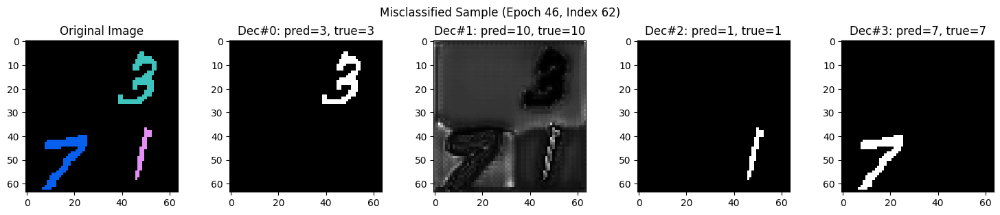

Right !!!!!!


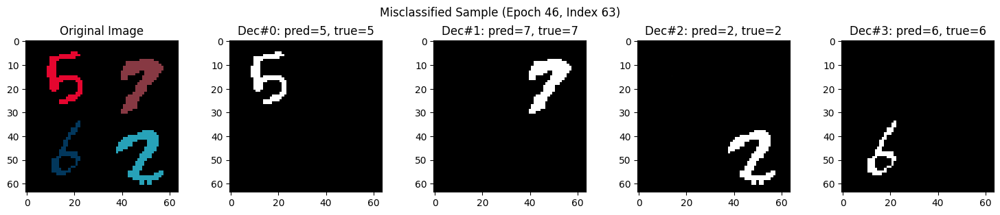

Right !!!!!!


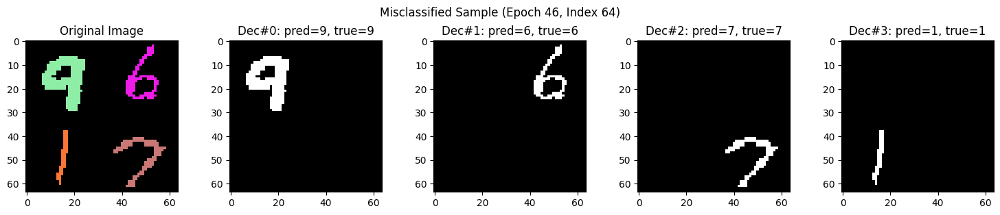

Right !!!!!!


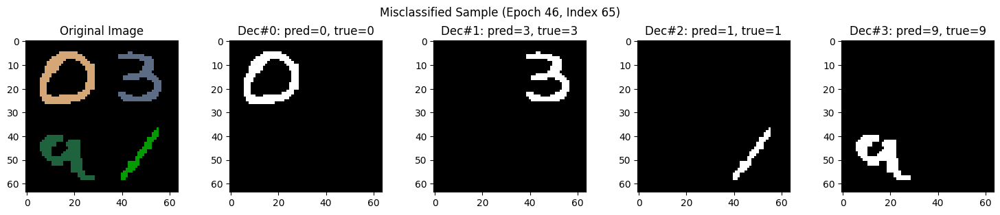

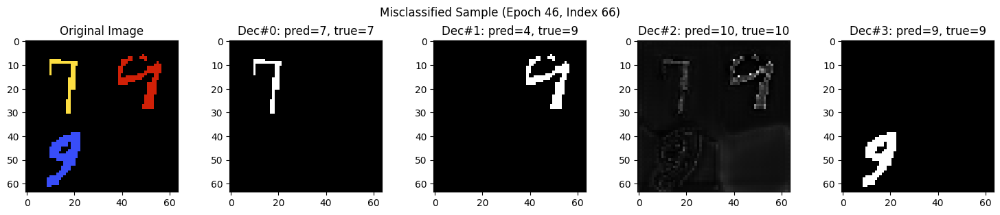

Right !!!!!!


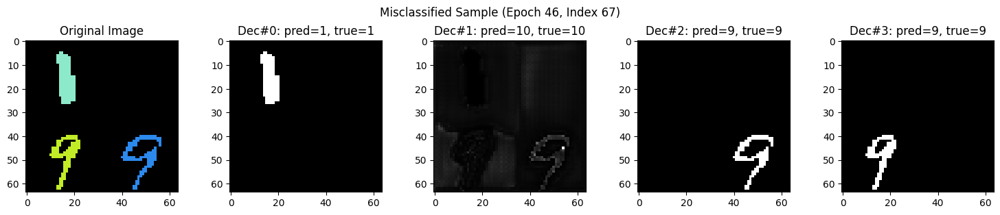

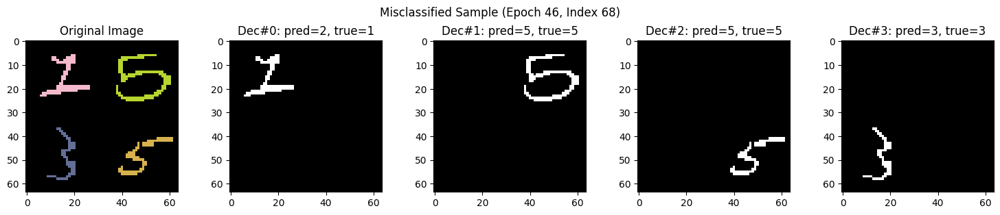

Right !!!!!!


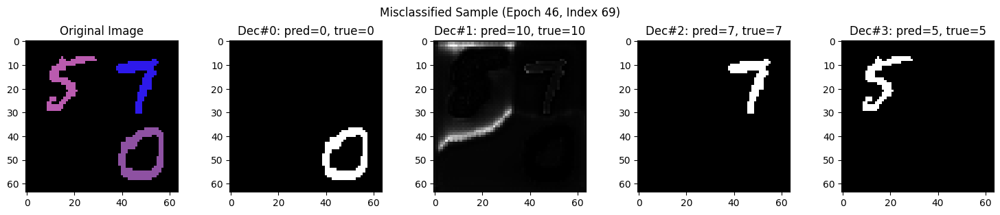

Right !!!!!!


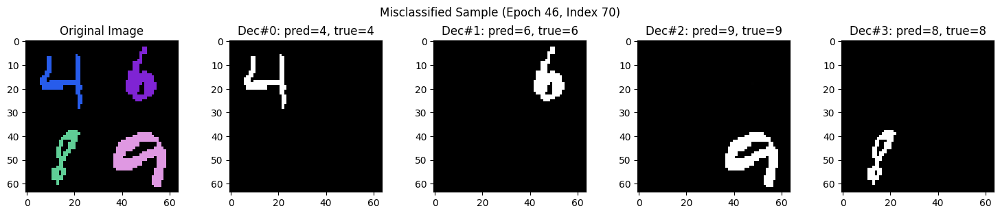

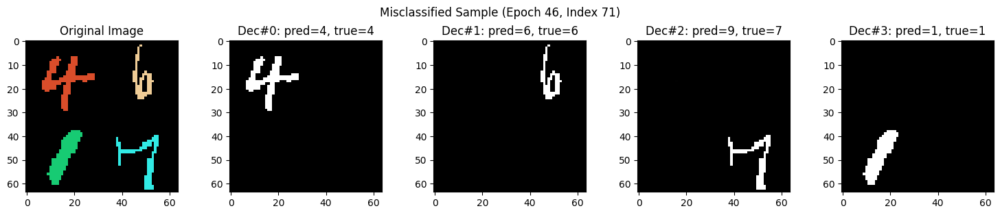

Right !!!!!!


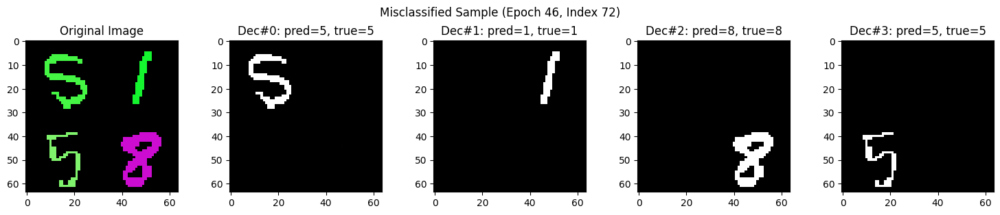

Right !!!!!!


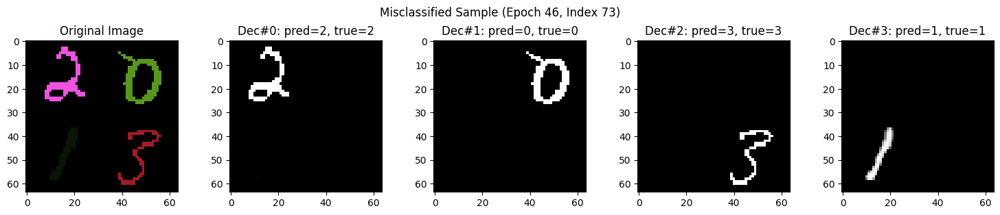

Right !!!!!!


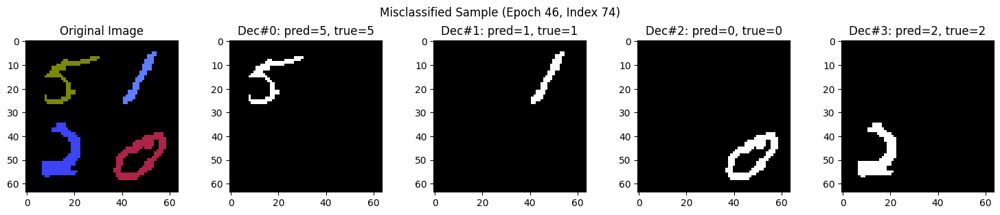

Right !!!!!!


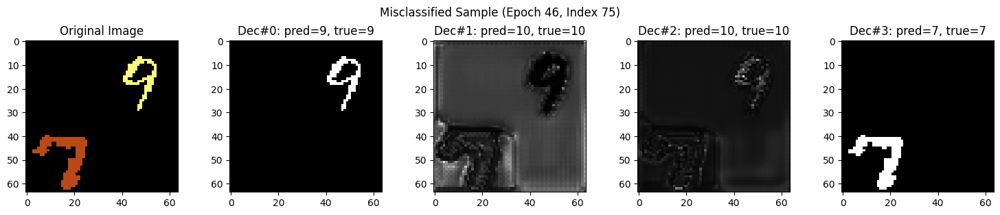

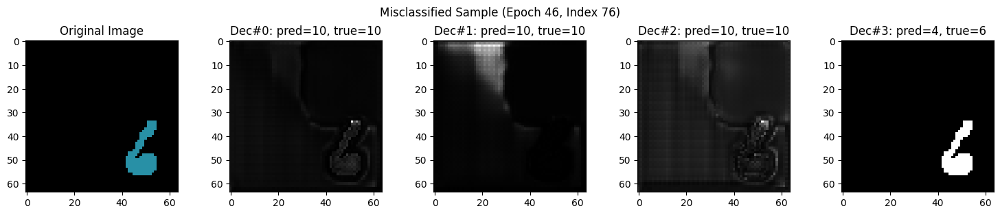

Right !!!!!!


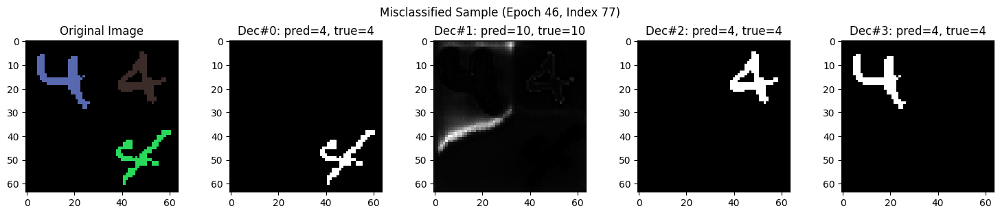

Right !!!!!!


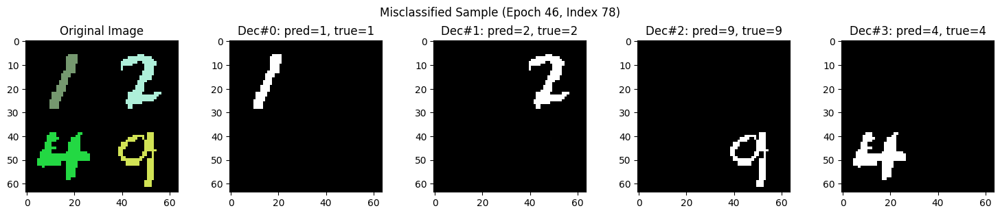

Right !!!!!!


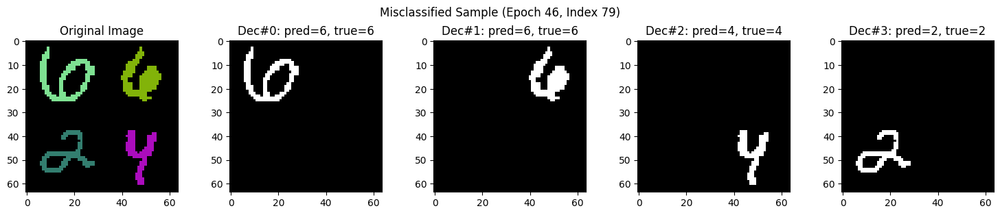

Right !!!!!!


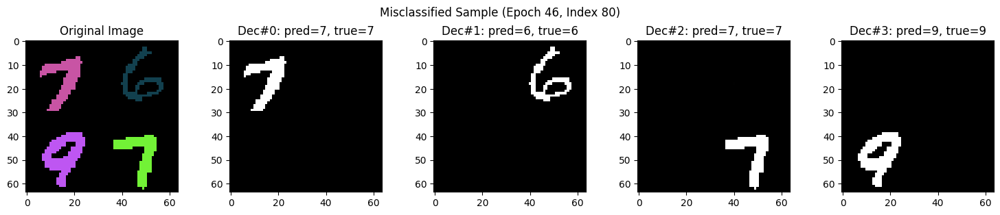

Right !!!!!!


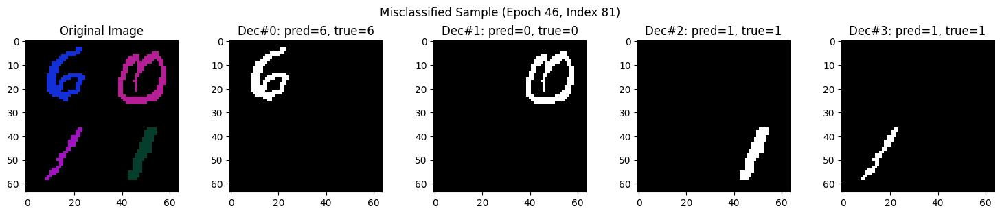

Right !!!!!!


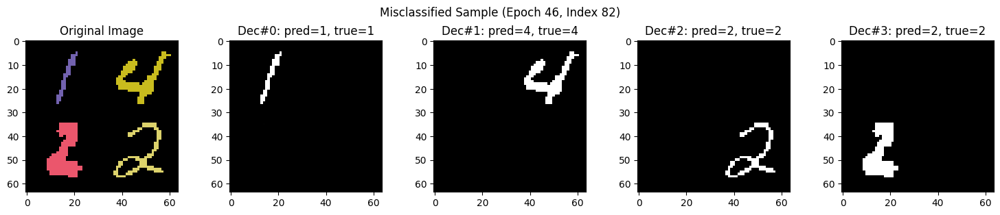

Right !!!!!!


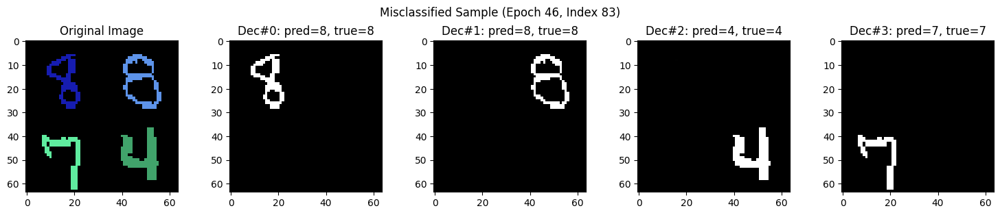

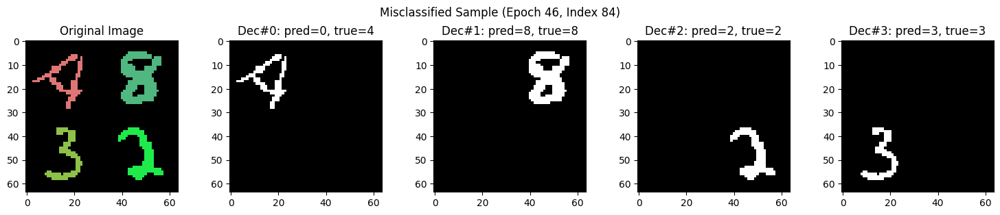

Right !!!!!!


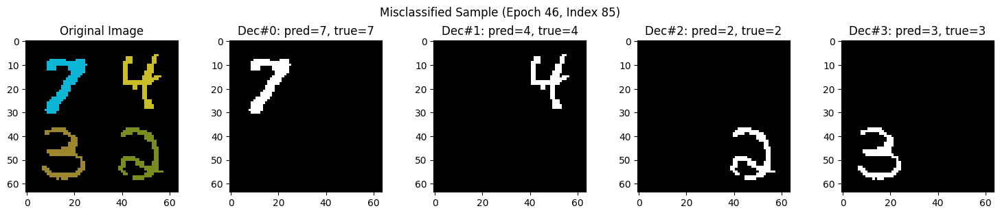

Right !!!!!!


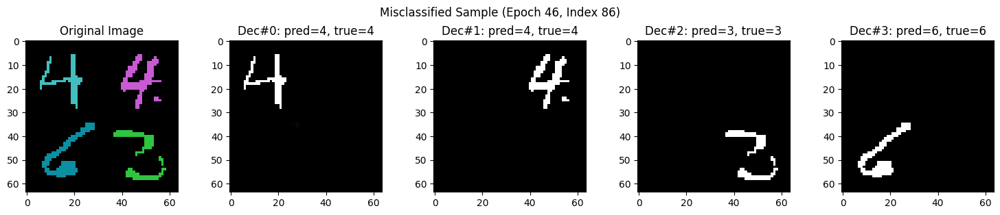

Right !!!!!!


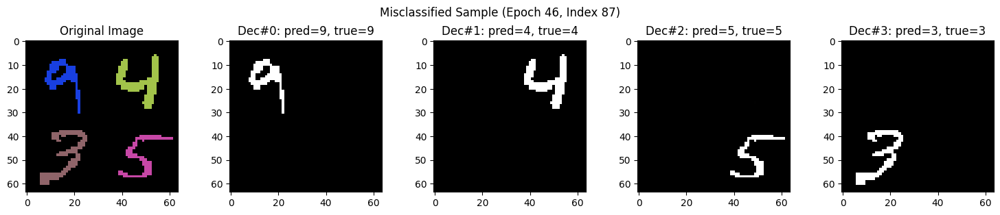

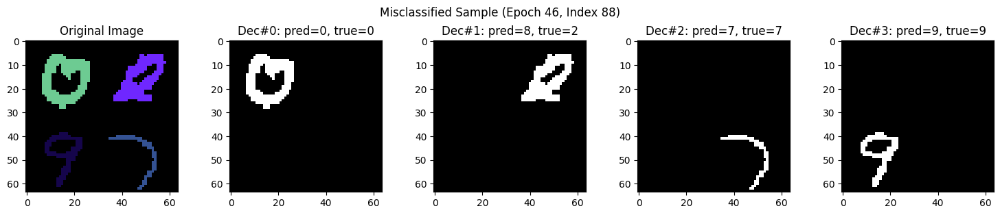

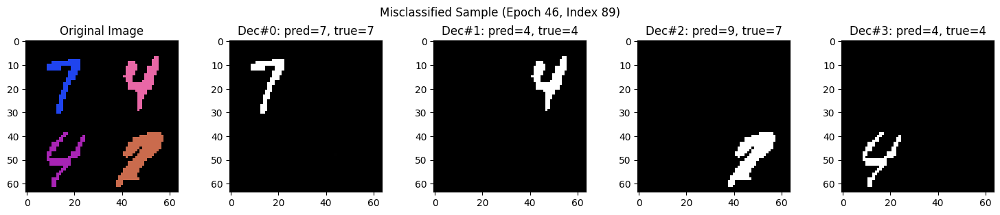

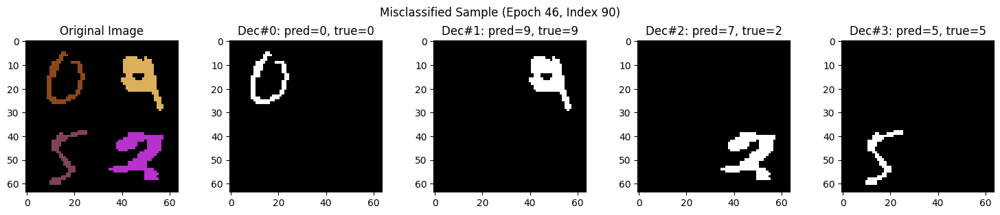

Right !!!!!!


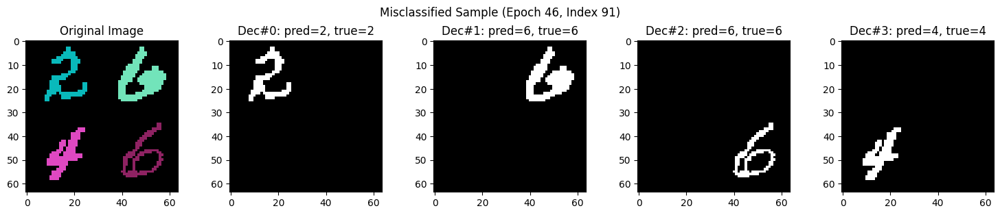

Right !!!!!!


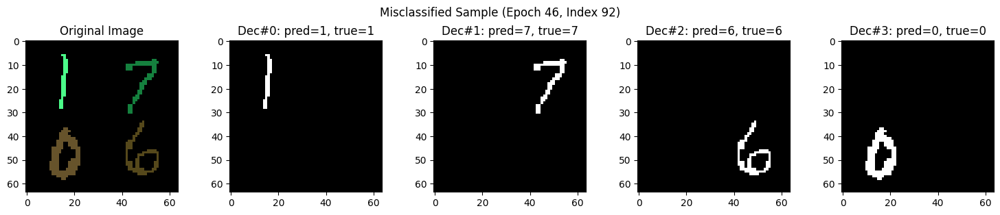

Right !!!!!!


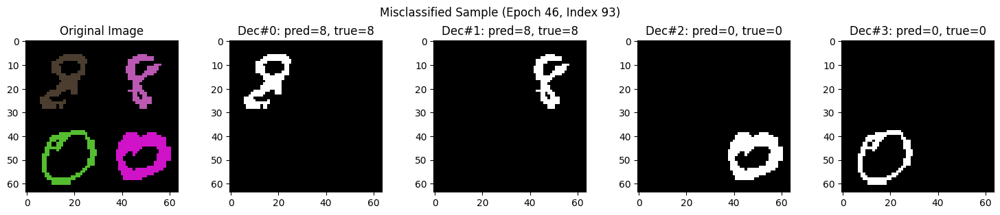

Right !!!!!!


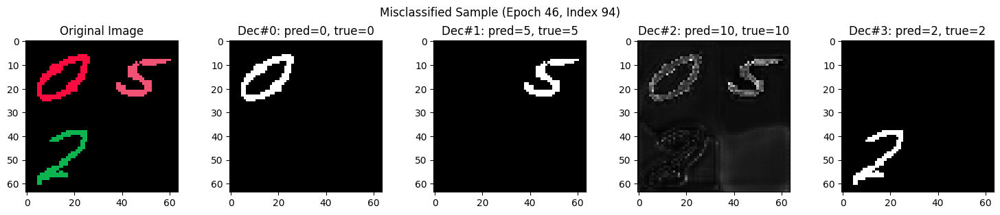

Right !!!!!!


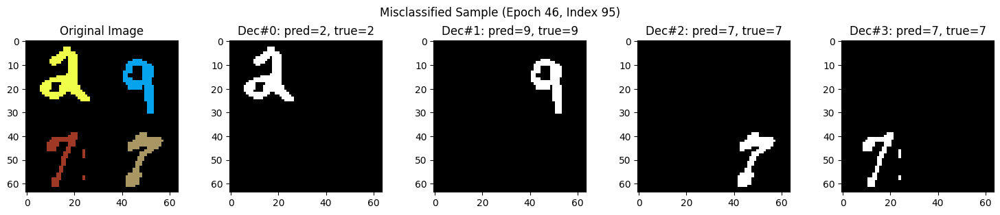

Right !!!!!!


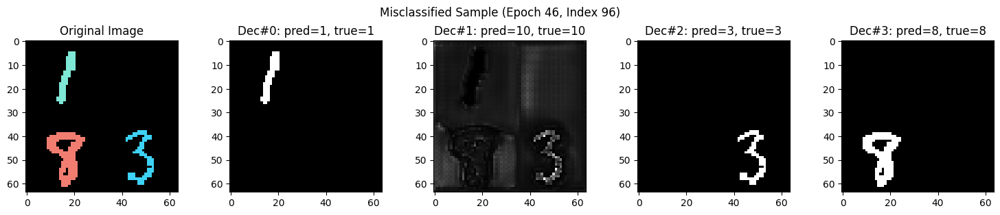

Right !!!!!!


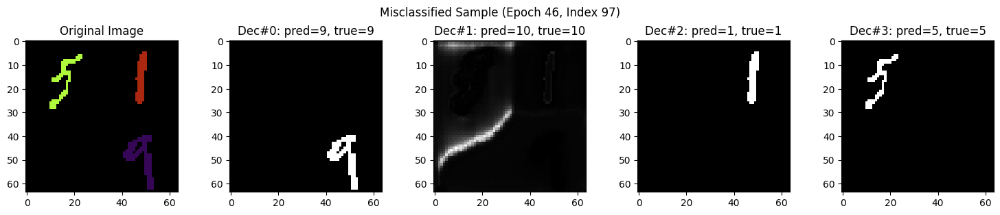

Right !!!!!!


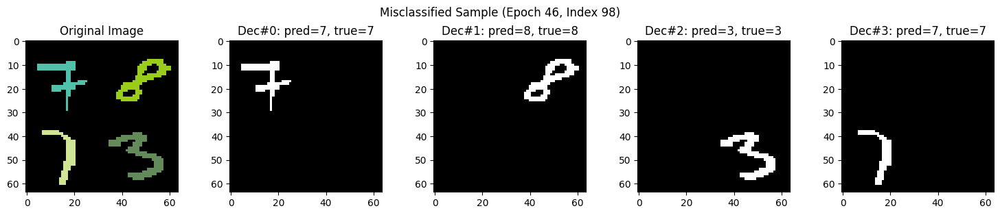

Right !!!!!!


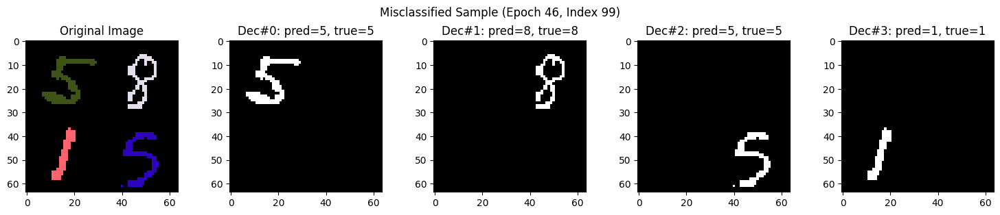

[Epoch 46] Train Loss: 0.1856 | Test Loss: 0.1794 | Test Acc: 94.52%
[Epoch 47] Train Loss: 0.1552 | Test Loss: 0.1883 | Test Acc: 94.25%
[Epoch 48] Train Loss: 0.1556 | Test Loss: 0.1824 | Test Acc: 93.42%
[Epoch 49] Train Loss: 0.1490 | Test Loss: 0.1763 | Test Acc: 94.25%
[Epoch 50] Train Loss: 0.1700 | Test Loss: 0.1807 | Test Acc: 94.25%


In [153]:
'''
    TODO : 학습 및 평가_Unet
'''
batch_size = 4
epochs = 50
lr = 0.003
device = 'mps' 

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# segmentation model freeze & load
seg_model = UNetLight().to(device)
seg_model.load_state_dict(torch.load('best_Unet_seg_model.pth'))
seg_model.eval()
for param in seg_model.parameters():
    param.requires_grad = False

classifier = Classifier().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(classifier.parameters(), lr=lr)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)


train_loss_list = []
test_loss_list = []
best_acc = 0

# ----- 학습 루프 -----
for epoch in range(epochs):
    classifier.train()
    total_train_loss = 0
    correct = 0
    total = 0
    shown_flag = {"shown": False}  # 🔸 에폭당 1회 시각화 제한

    for batch_idx, (img, masks, labels) in enumerate(train_loader):
        img, masks, labels = img.to(device), masks.to(device), labels.to(device)
        with torch.no_grad():
            pred_masks = seg_model(img).squeeze(2)  # (B, 4, 64, 64)

        reordered_labels = get_reordered_labels(pred_masks, masks, labels, device, verbose=True,
            img=img,
            epoch=epoch + 1,
            img_idx=batch_idx * batch_size,
            shown_flag=shown_flag)
        
        outputs = classifier(pred_masks)  # (B, 4, 11)

        loss = sum(criterion(outputs[:, i, :], reordered_labels[:, i]) for i in range(4)) / 4

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

        preds = torch.argmax(outputs, dim=2)
        valid_mask = (reordered_labels != 10)
        correct += ((preds == reordered_labels) & valid_mask).sum().item()
        total += valid_mask.sum().item()

    acc = 100 * correct / total
    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_list.append(avg_train_loss)

    # ----- 평가 -----
    classifier.eval()
    total_test_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for batch_idx, (img, masks, labels) in enumerate(test_loader):
            img, masks, labels = img.to(device), masks.to(device), labels.to(device)
            pred_masks = seg_model(img).squeeze(2)
            reordered_labels = get_reordered_labels(pred_masks, masks, labels, device)
            outputs = classifier(pred_masks)

            loss = sum(criterion(outputs[:, i, :], reordered_labels[:, i]) for i in range(4)) / 4
            total_test_loss += loss.item()

            preds = torch.argmax(outputs, dim=2)
            valid_mask = (reordered_labels != 10)
            correct += ((preds == reordered_labels) & valid_mask).sum().item()
            total += valid_mask.sum().item()

            if epoch == 45:
            # 틀린 예시 시각화
                for b in range(img.size(0)):    
                    wrong = ((preds[b] != reordered_labels[b]) & valid_mask[b]).any()
                    if wrong:
                        visualize_misclassified(img[b], pred_masks[b], preds[b], reordered_labels[b], epoch+1, batch_idx * batch_size + b)
                    else:
                        print("Right !!!!!!")
                        visualize_misclassified(img[b], pred_masks[b], preds[b], reordered_labels[b], epoch+1, batch_idx * batch_size + b)


    test_acc = 100 * correct / total
    avg_test_loss = total_test_loss / len(test_loader)
    test_loss_list.append(avg_test_loss)
    scheduler.step(avg_test_loss)


    print(f"[Epoch {epoch+1}] Train Loss: {avg_train_loss:.4f} | Test Loss: {avg_test_loss:.4f} | Test Acc: {test_acc:.2f}%")


Min Train Loss: 0.1490 at epoch 48
Min Test Loss: 0.1763 at epoch 48


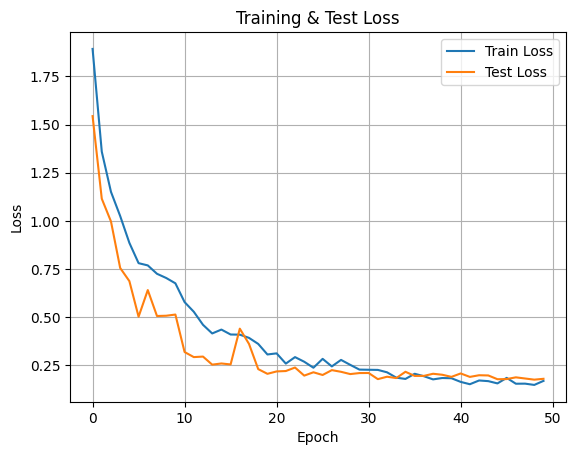

In [154]:
'''
    TODO : loss 시각화
'''
min_train_loss = min(train_loss_list)
min_train_epoch = train_loss_list.index(min_train_loss)

min_test_loss = min(test_loss_list)
min_test_epoch = test_loss_list.index(min_test_loss)

print(f"Min Train Loss: {min_train_loss:.4f} at epoch {min_train_epoch}")
print(f"Min Test Loss: {min_test_loss:.4f} at epoch {min_test_epoch}")

visualize_loss_curves(train_loss_list, test_loss_list) 